<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/14.UCB_P%3D10_20_dim_user_case_BOGP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
P_max = 10 #in dBm

In [2]:
var = 20
number_of_cells = 4

In [3]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

 The latest version of GNU Octave built for all supported Ubuntu releases. GNU Octave is normally distributed with Ubuntu, this PPA is for you if you have a need to use a newer version of Octave than what you can already get from your installed version of Ubuntu.

Simply follow the instructions below to add this PPA to your system and install the octave package. If it's not that easy or you encounter any errors, contact the team and let us know.

Much credit goes to the Debian Octave Group who maintain the official Debian packages that this work is derived from. Without their efforts to bring Octave packaging to such a high level of quality in Debian and Debian derivatives, this PPA would not be here.
 More info: https://launchpad.net/~octave/+archive/ubuntu/stable
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64

In [4]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

--2021-10-28 03:38:45--  https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m [following]
--2021-10-28 03:38:45--  https://www.dropbox.com/s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucb18030943daff632de18898f63.dl.dropboxusercontent.com/cd/0/inline/BY3IllYslFWrQAz7W8xZHOmGGApoORxj2kne-Uxt-McaHZJa5QC1z98slVHG_Y9K97ZU4--Ao2qw1cHN_20IeeqLI68AOWNL6OvK59nCl44eRY4PaAnepyGv83o2ZW_KBc9eQeKTPgi3Ns2KltdS6Nnp/file# [following]
--2021-10-28 03:38:45--  https://ucb18030943daff632de18898f63.dl.dr

In [5]:
!wget https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
!wget https://www.dropbox.com/s/52gyqiq137mo2bb/SE.mat

--2021-10-28 03:38:48--  https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/utf73kdk09gjvsu/RR.mat [following]
--2021-10-28 03:38:48--  https://www.dropbox.com/s/raw/utf73kdk09gjvsu/RR.mat
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucfecd50eba29cdcfb0391639cac.dl.dropboxusercontent.com/cd/0/inline/BY16nOHDWZmiAzX64kYnnUhpkGzN_u04bhONzFuMVurudirJ3gkFAk3vB0rc0HFbMJwfsbqT7n3oKZ6yc97RI-3cn5dwuIq8m6TvhUJq87lxRA7T85nVjDg9HYBmczbIN92MZi74KXMKCSXWlzYV2TMn/file# [following]
--2021-10-28 03:38:49--  https://ucfecd50eba29cdcfb0391639cac.dl.dropboxusercontent.com/cd/0/inline/BY16nOHDWZmiAzX64kYnnUhpkGzN_u04bhONzFuMVurudirJ3gkFAk3vB0rc0HFbMJwfsbqT7n3oKZ6yc97RI-3cn5dwuIq8m6TvhUJq87lx

In [6]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [7]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [9]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [10]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [11]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  if iteration<180:
   beta = 5*np.exp(((-6-np.log(5))*iteration)/180)
  else:
   beta = 5*np.exp(((-6-np.log(5))*180)/180)
  
  for i in range(2):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [12]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_P=10_3.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_P=10_3.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_P=10_3.npy")

x_next is [-20.41338556   5.84500297 -10.54097158 -30.23708155   0.51158534
   6.94142467   6.78003473  -0.18062468  -5.99953869  -0.93785965
   2.0841376    7.6629227  -28.47454743 -26.83097465 -10.21674927
  -8.92932072 -19.65672516   8.0785493  -25.62353668   1.78415225]
f()=0.000000, actual=19.047
0


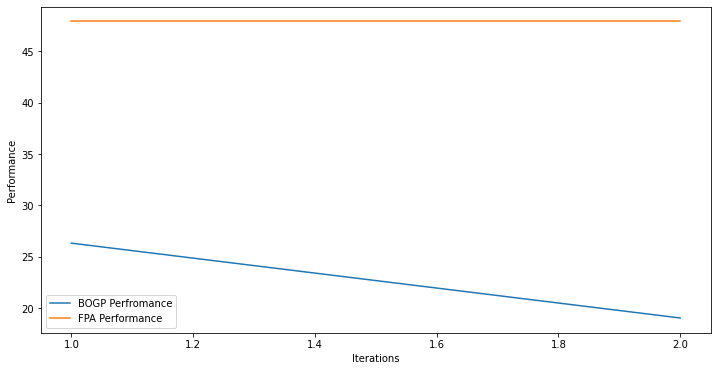

x_next is [  9.99996794 -30.99997451 -30.99995749   9.99987562 -30.99993014
 -31.         -30.99950384 -30.9994521  -31.         -31.
 -31.         -31.           9.99991341   9.99991458 -30.99979918
 -30.9998841    9.99987966 -31.           9.99985478 -31.        ]
f()=22.104438, actual=22.950
1


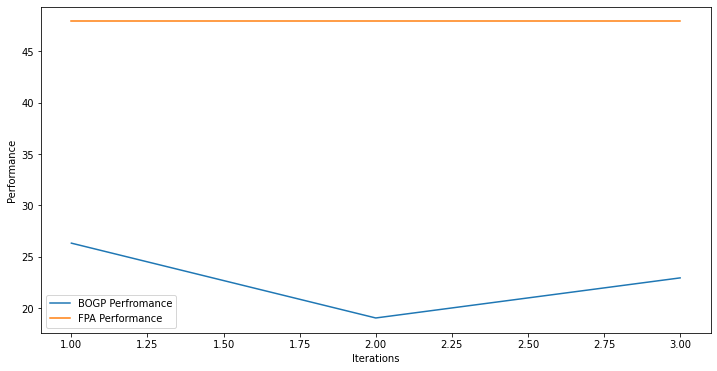

x_next is [ -5.78143827 -25.32043577 -27.20038301  -1.78525469 -19.37405824
 -22.01107317   2.79010753   5.9997664   -2.14611958  -6.94682437
 -30.85356545   4.56902782   7.67386817  -2.72447348 -26.32221494
  -2.70449901  -7.75285843 -13.42985118 -23.18534326   9.18113029]
f()=22.581433, actual=19.688
2


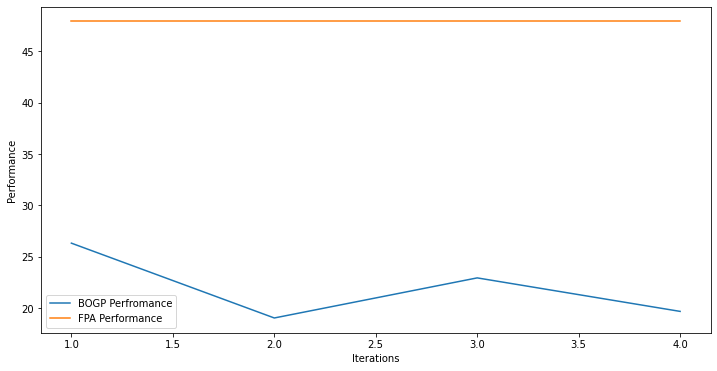

x_next is [  2.09725907   2.85122536 -30.75818529 -25.77378544 -12.14987133
   6.47840294  -3.95409553 -10.67417683  -9.86084698 -12.880573
 -16.91478845 -19.23942886  -2.89992107 -16.75342061  -4.53215995
  -7.74251144 -20.79285504  -2.28992736 -19.15731911 -29.24974222]
f()=21.876143, actual=9.737
3


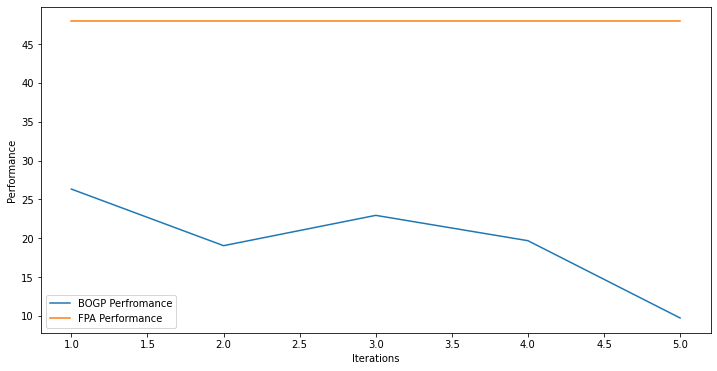

x_next is [ -2.84147684  -1.03440323 -17.88215859   6.87728127 -26.96133939
   2.30583942  -4.41634917 -16.2165854   -3.4893527   -2.7359297
  -6.64073109 -10.16223161 -26.93556575  -2.41746546 -19.93708694
 -14.46289786   1.73242059  -9.79440263 -28.49536666 -25.22583035]
f()=19.156410, actual=14.050
4


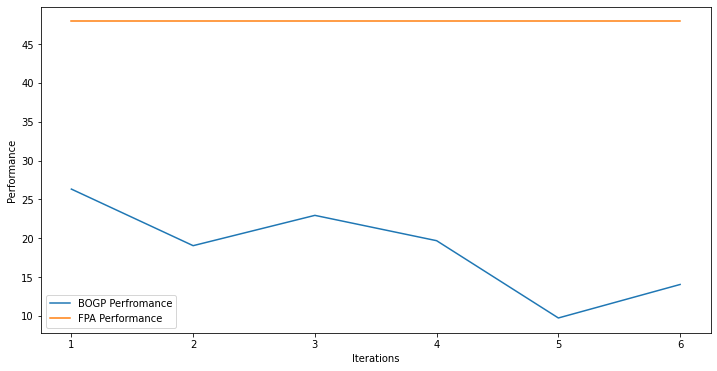

x_next is [-25.50423355  -1.95689773  -1.50558322  -6.62329116 -20.51650563
   9.54113562   0.44261839 -10.90301828   5.2222641  -21.2884602
   4.40491607   8.2889566  -30.62502956 -27.60982516 -17.35005546
 -15.05047016 -14.4139917   -9.56185705 -11.35906273   0.40433175]
f()=18.313012, actual=13.655
5


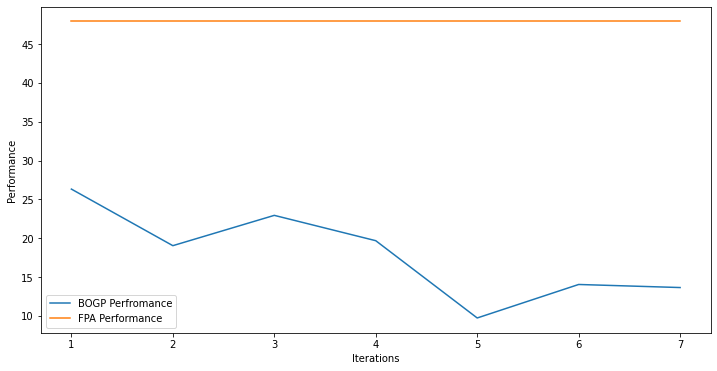

x_next is [ -1.81792313   4.03643302 -14.13262714  -4.47350566  -2.12712487
  -9.97676515 -18.58552911 -17.67655322 -11.66223419 -15.71238722
 -25.3857633    6.90499778   6.62211858  -3.77659219 -17.08514084
  -8.57292367 -19.79871257  -2.32910568 -14.1294197    9.73540116]
f()=17.656134, actual=16.985
6


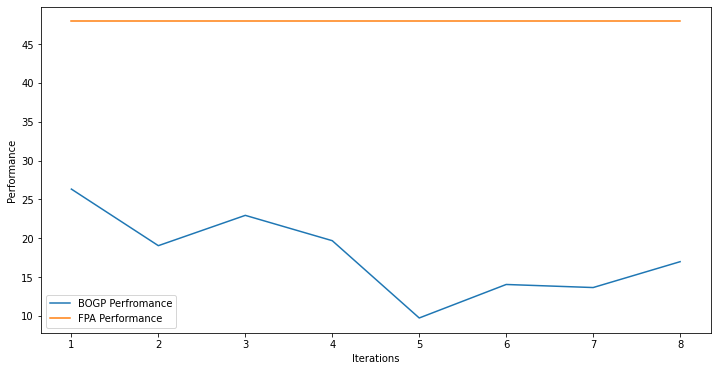

x_next is [-27.64814669   4.70457597 -10.86234864  -8.9911193   -4.17875724
 -11.87068559 -26.64758796   1.24460025   7.07841041 -23.04222785
 -29.77522586 -20.0474442   -7.07527868 -27.16936145 -19.00909499
 -19.38872125   8.90478832 -16.93571221 -18.31126082 -25.81996949]
f()=17.603484, actual=9.376
7


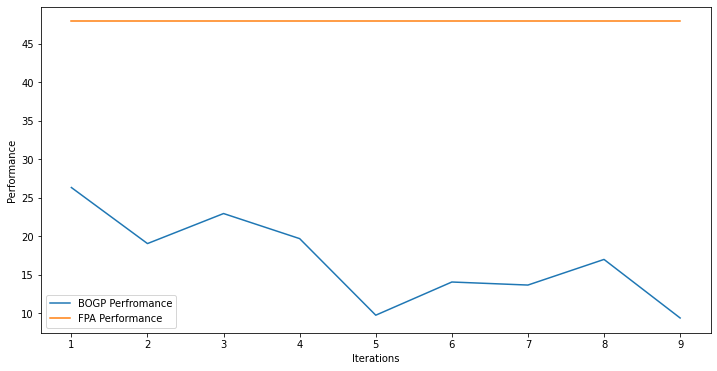

x_next is [ -0.13148852 -16.19296807  -6.91682197  -4.11031622 -19.95669991
   2.88972181 -22.32660532  -2.48935533 -19.17787802  -3.65192652
 -20.13208508   1.561802    -3.41422571  -1.47566077 -15.52634057
 -18.00490476 -21.34892932  -6.22921648 -16.75790273 -22.49388514]
f()=16.651028, actual=12.907
8


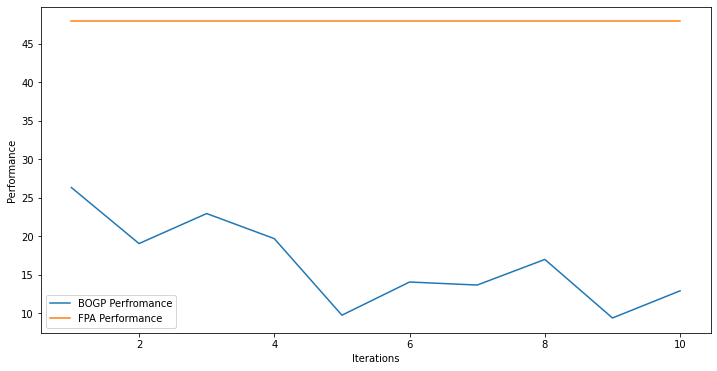

x_next is [ -1.20253527 -17.16620383  -1.0975111  -24.01056561  -2.59634046
  -5.99362011   8.38483588  -9.00896069   6.80739472   4.50557809
   1.11094581 -16.45359691   0.76998157   1.45957157   7.51981509
  -1.62730134   9.4260282  -22.91477079   9.80811978 -26.64394164]
f()=16.284639, actual=22.221
9


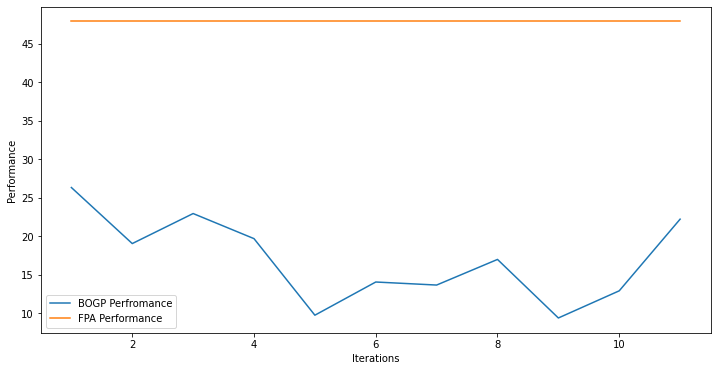

x_next is [ 10. -31.  10.  10.  10. -31.  10.  10. -31.  10.  10. -31. -31.  10.
 -31.  10.  10.  10.  10.  10.]
f()=29.153965, actual=41.151
10


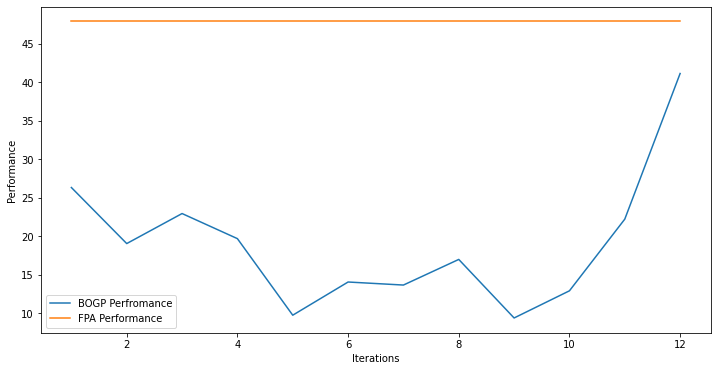

x_next is [-31. -31. -31.  10.  10. -31.  10.  10. -31.  10.  10. -31.  10.  10.
  10. -31.  10.  10.  10.  10.]
f()=34.208579, actual=36.939
11


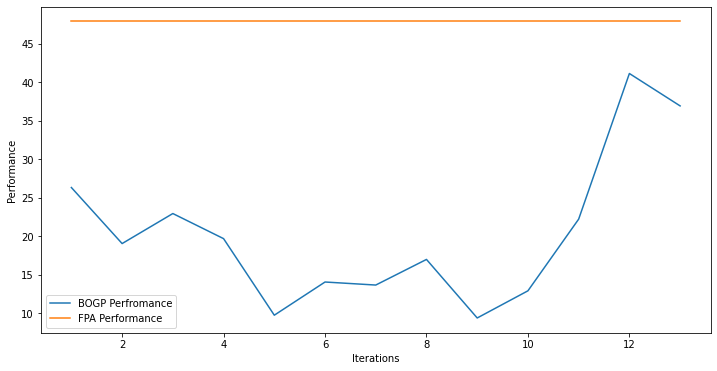

x_next is [  9.99982545 -30.99988131   9.9996402    9.99954054   9.99988413
 -30.99988959   9.99994894   9.9998093  -30.99994337   9.99988307
   9.99998837 -30.99974216   9.99999988   9.99999982   9.99943404
   9.99993219   9.99980367   9.99997049   9.99999553   9.99994731]
f()=20.028895, actual=44.005
12


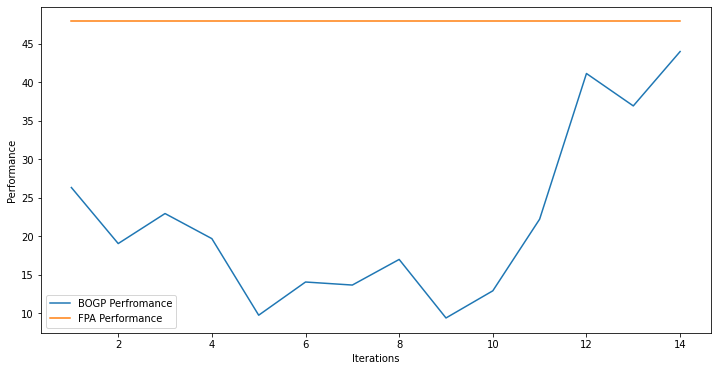

x_next is [ 10. -31. -31.  10.  10. -31.  10.  10. -31. -31.  10.  10. -31.  10.
  10.  10.  10.  10.  10.  10.]
f()=36.762472, actual=38.163
13


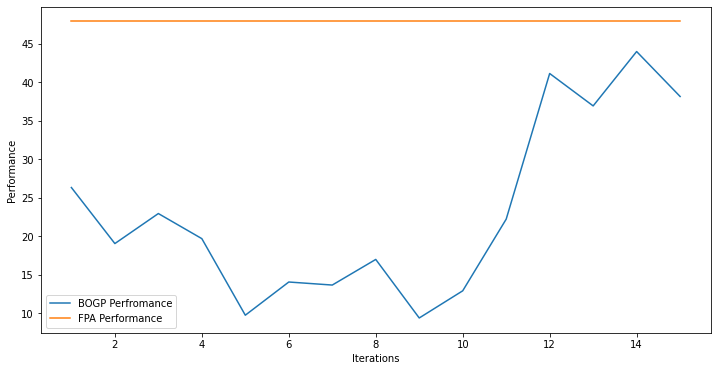

x_next is [  9.65464942 -30.88080765   9.94668362   9.92300017   9.65848634
 -30.80595522   9.57929133   9.22876386 -30.56823067   9.82818601
   9.86553826 -30.20308016 -27.18163319   9.65263994   9.82356094
   9.29379665   9.97903517   9.168141     9.9472039    9.79479029]
f()=22.756111, actual=41.113
14


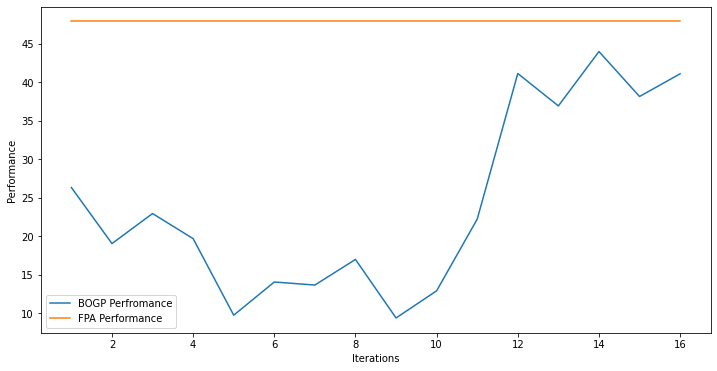

x_next is [ 10. -31.  10.  10.  10. -31.  10. -31. -31.  10.  10.  10.  10. -31.
  10.  10.  10.  10.  10.  10.]
f()=38.256156, actual=42.527
15


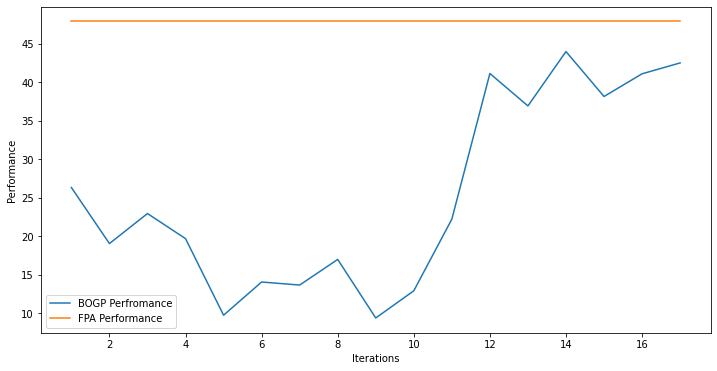

x_next is [ -4.62988868   5.20391793 -17.53383607   3.8263989  -11.01085285
   0.11443631   5.58603361  -0.95046485   8.92452072  -5.77690663
  -3.32175129 -10.80048533  -1.40471099 -13.92229351  -1.07024036
 -30.67028834  -6.5339512   -4.31367602   1.81087263 -10.76653396]
f()=24.978767, actual=18.380
16


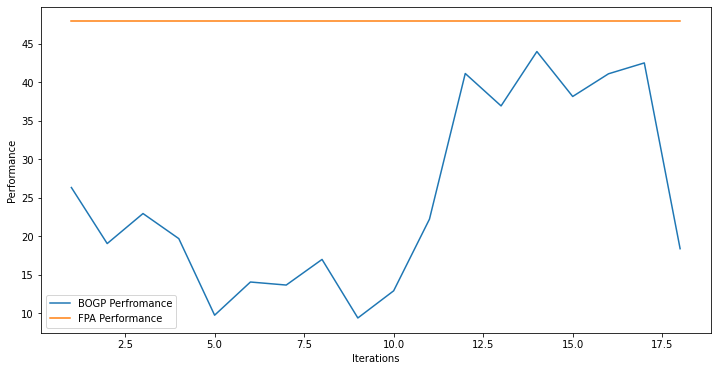

x_next is [ 10.  10.  10.  10.  10. -31.  10.  10. -31.  10.  10.  10.  10.  10.
 -31.  10.  10.  10.  10.  10.]
f()=41.458131, actual=44.481
17


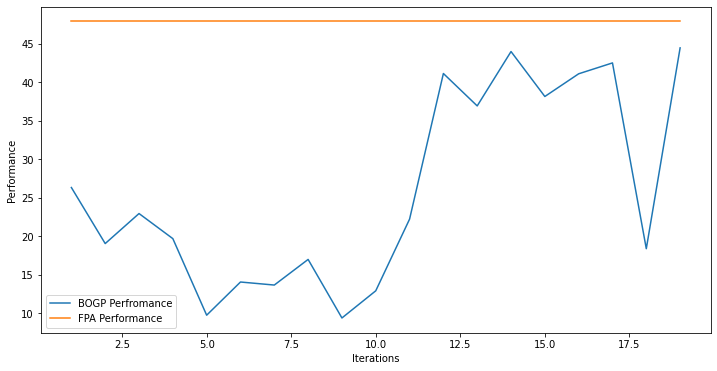

x_next is [ 10. -31.  10.  10.  10. -31.  10.  10. -31.  10.  10.  10.  10.  10.
 -31. -31.  10.  10.  10.  10.]
f()=42.801285, actual=40.754
18


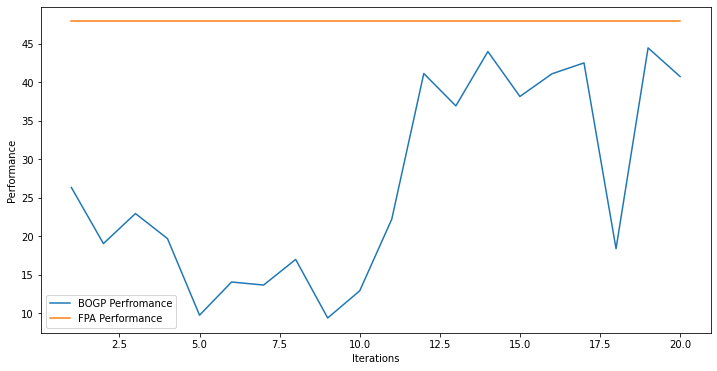

x_next is [ 10.  10.  10.  10.  10. -31.  10.  10. -31.  10.  10.  10.  10. -31.
  10.  10.  10. -31.  10.  10.]
f()=40.089556, actual=42.112
19


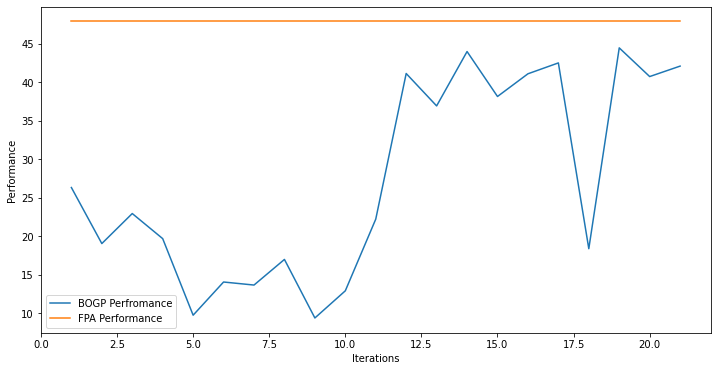

x_next is [ 10. -31. -31.  10.  10. -31.  10.  10. -31.  10.  10.  10.  10. -31.
 -31.  10.  10.  10.  10.  10.]
f()=42.339107, actual=43.112
20


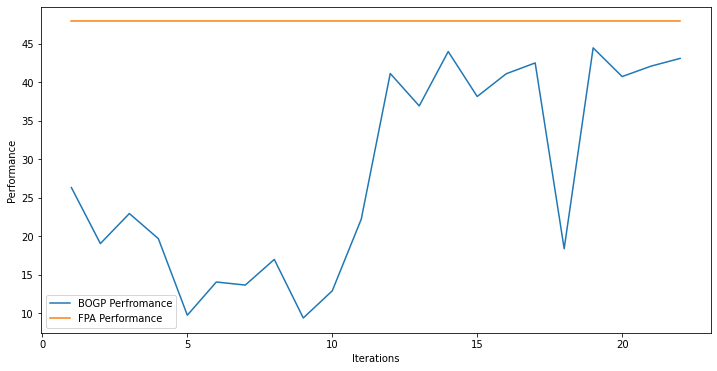

x_next is [ 10.  10.  10.  10. -31. -31.  10.  10. -31.  10.  10.  10.  10. -31.
  10.  10.  10.  10.  10.  10.]
f()=41.298699, actual=41.531
21


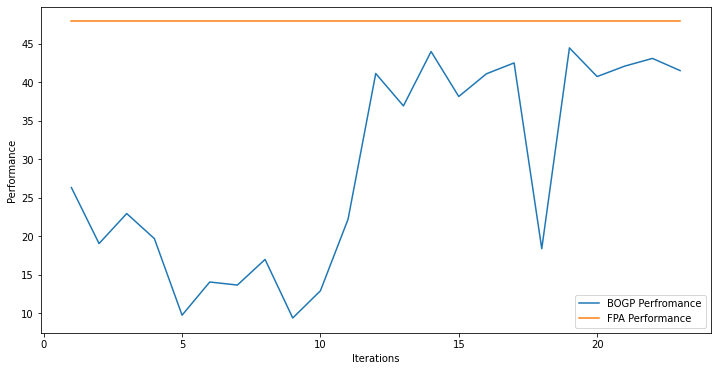

x_next is [-14.05532517   0.35082417 -17.94647045   4.34417183 -20.63845457
 -29.63624138 -30.38316239  -9.28286226 -16.37045383   3.19632608
 -20.78969871   5.2356312   -0.78614558 -24.0623046    5.31136776
  -2.92332025 -19.45519695 -17.75279089  -0.07856122 -28.41802239]
f()=28.489915, actual=17.669
22


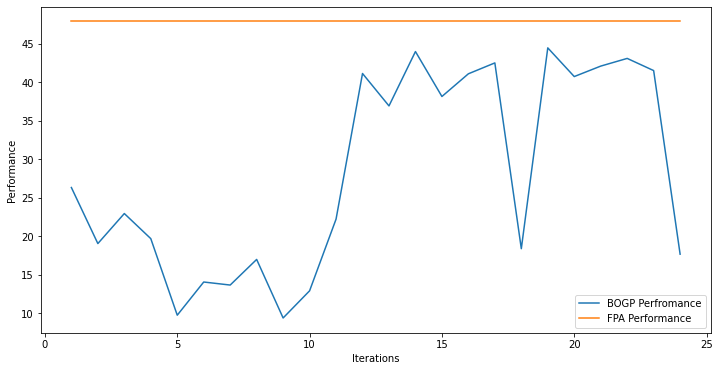

x_next is [ 10.          10.          10.          10.          10.
 -31.          10.          10.         -31.          10.
  10.         -31.          10.         -31.         -30.99999999
  10.          10.          10.          10.          10.        ]
f()=43.253877, actual=43.112
23


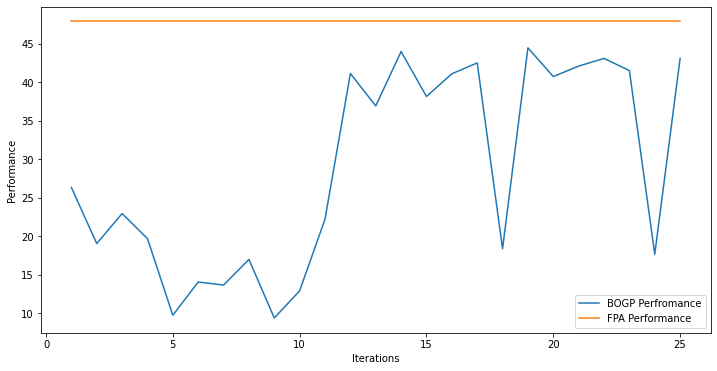

x_next is [  2.11623908 -27.59121188  -0.44695526 -13.87563056   2.93718404
   7.02680776   5.92306247 -11.99533444 -27.3216038  -29.22711855
 -18.0452134  -12.37379374 -24.46854725 -14.40151518 -12.00085456
 -11.49981654  -7.30328173  -6.87689674   3.3574547    2.59315775]
f()=28.643791, actual=18.876
24


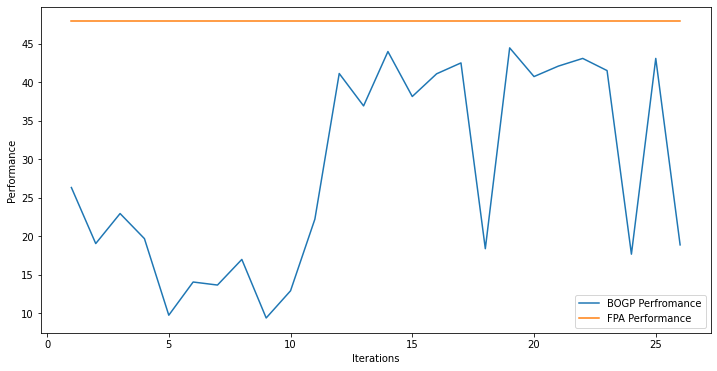

x_next is [ 10.  10.  10.  10.  10. -31.  10.  10. -31.  10.  10.  10.  10.  10.
  10.  10.  10.  10.  10.  10.]
f()=44.787595, actual=45.067
25


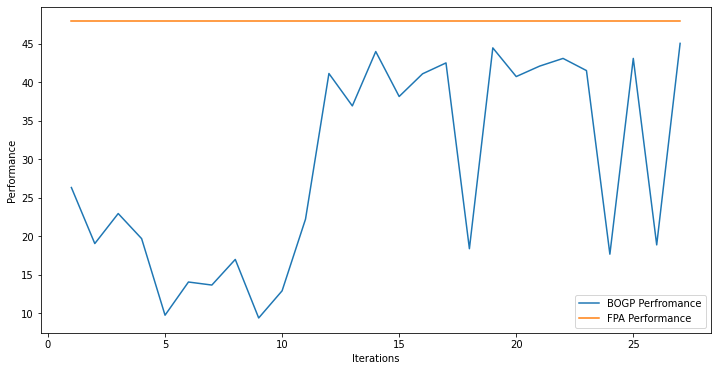

x_next is [ 10.         -31.          10.          10.          10.
 -31.          10.          10.         -31.          10.
  10.          10.          10.          10.           9.99989214
  10.          10.          10.          10.          10.        ]
f()=44.846467, actual=44.631
26


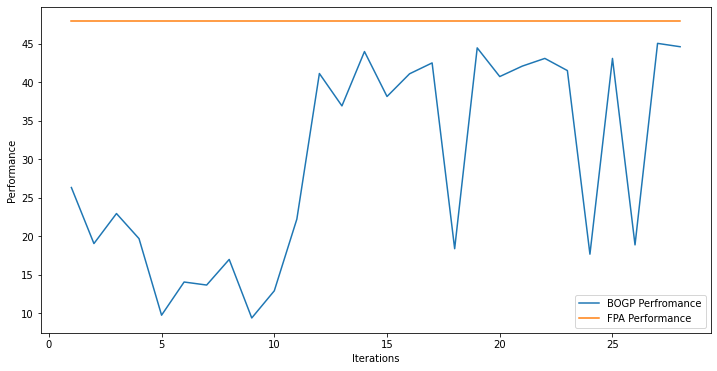

x_next is [  6.00925041 -26.03768909  -1.96147145   0.38587663   5.14077153
 -21.31630278 -30.54458715 -16.55188441  -6.34432005  -4.0569597
 -29.18704597 -25.57997216 -13.51458891  -9.69856406 -23.14711989
   7.72095522 -11.98233982 -23.61302739 -30.35742959 -22.11909997]
f()=29.454383, actual=17.494
27


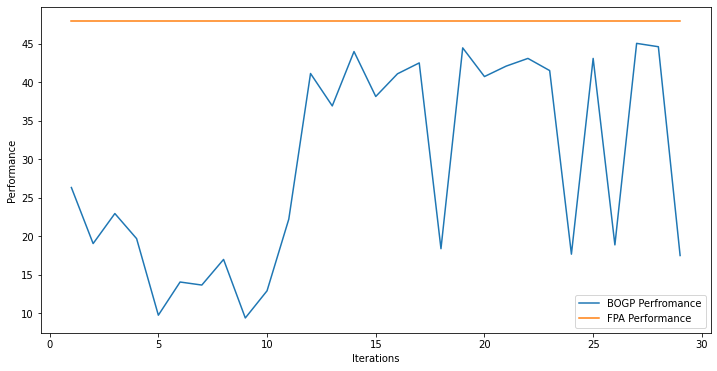

x_next is [ 10.           9.99999998   9.9999956   10.          10.
 -31.          10.          10.         -30.99999998  10.
  10.          10.           9.99997331 -30.9999475    9.99998581
  10.          10.          10.           9.99999999  10.        ]
f()=44.649542, actual=44.392
28


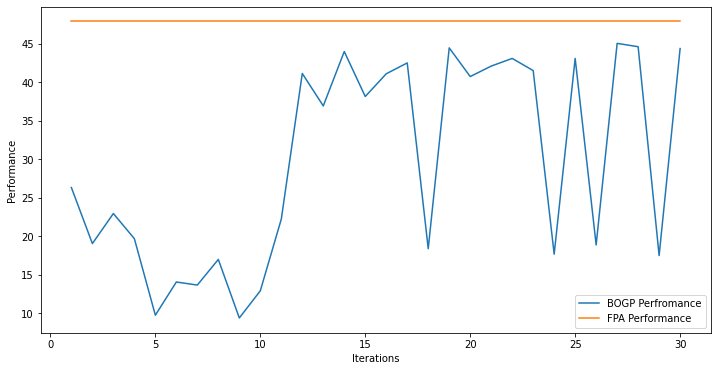

x_next is [ 10.         -31.          10.          10.          10.
 -31.          10.          10.         -31.          10.
  10.          10.          10.           6.66945846  10.
  10.          10.          10.          10.          10.        ]
f()=41.281443, actual=44.326
29


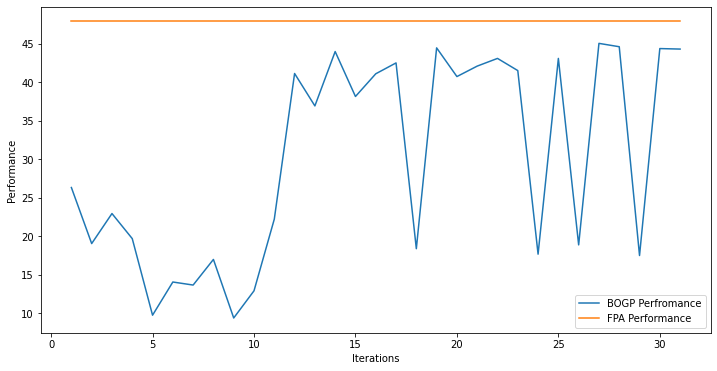

x_next is [  9.99999998   9.99999999 -30.99988035   9.99995596   9.99999998
 -30.99996518   9.99999998   9.99999999 -30.99972298   9.99999998
   9.99999992   9.99999996   9.99999998   9.99999998   9.99999994
   9.99999997   9.99999998   9.99999988   9.99999998   9.99999997]
f()=43.933135, actual=44.881
30


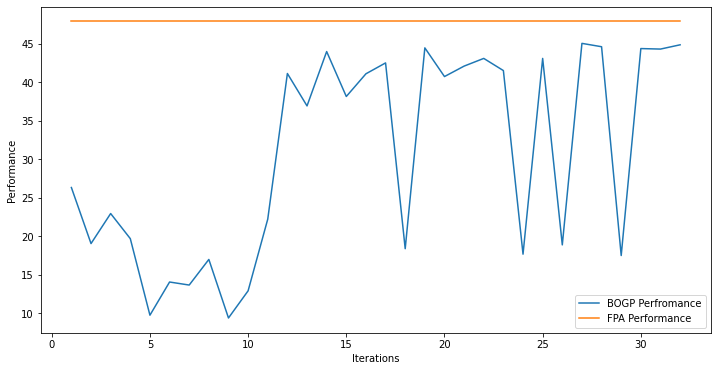

x_next is [  9.99999964   9.9999998   -7.52985373   9.99999988   9.99993012
 -30.9999909    9.99999983   9.99999989 -30.99999932   9.99987283
   9.99999975   9.99999978   9.99999974   9.99976883   9.99999982
   9.9999997    9.99999962   9.9999998    9.9999998    9.9999998 ]
f()=45.040280, actual=44.884
31


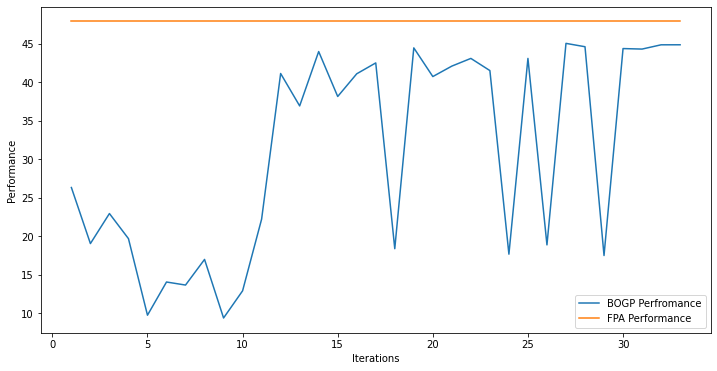

x_next is [  9.99999973   9.9999999    9.99999788   9.99999982   9.99999995
 -30.99999917   9.99999973   9.9999998  -30.99999953   9.99999963
   9.9999999  -11.70175444   9.99999993   9.9999999    9.99993301
   9.9999999    9.99999987   9.99999986   9.99990175   9.99963438]
f()=44.653477, actual=44.446
32


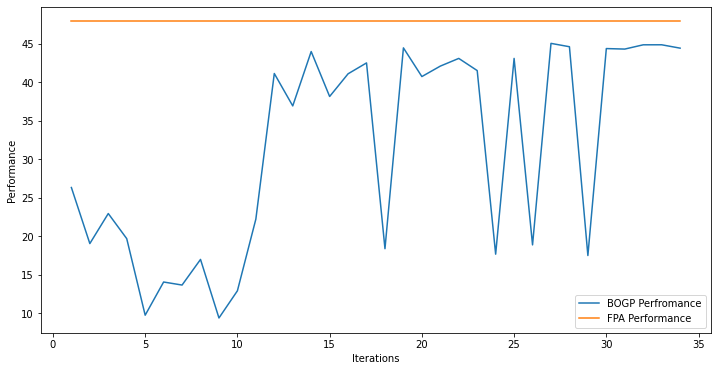

x_next is [  9.99999972   9.99980665   9.9999835    9.99991696   9.99999979
 -30.99952661   9.99995839   9.99999922 -30.9999645    9.99999957
   9.99999936   9.99999951   9.99999968   9.99999897   9.99999908
   9.99994977   9.99999975   9.99999973   9.99999956   9.99999936]
f()=45.042195, actual=45.067
33


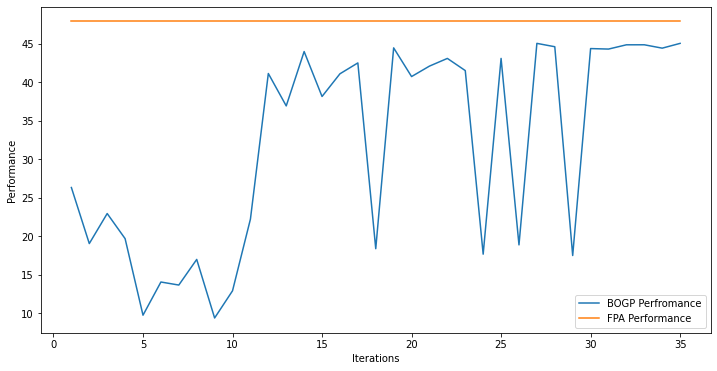

x_next is [  8.40498286   9.64748542   6.99233215   9.74027834   9.91780885
 -30.89189041   9.17455381   8.18358698 -30.93830917   9.47341755
   9.76943229   9.87414577   9.31668187   8.72828037   6.79104989
   9.77525467   9.48404372   9.90456597   9.69954019   9.6682446 ]
f()=44.389644, actual=43.716
34


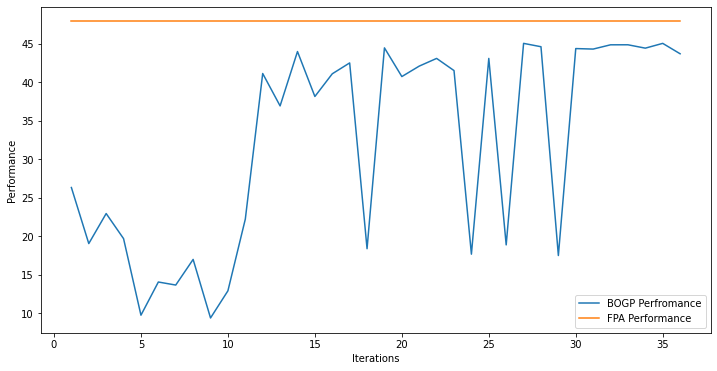

x_next is [  9.68656005 -30.35145128 -30.75722046   9.86480205   9.86225794
 -30.97109353   9.4719032    9.15178331 -30.92787962   9.94476004
   9.91307421   9.98311174   9.84313145   9.35098601   9.72209518
   9.69893318   9.88728164   9.36642616   9.93597362   9.60932323]
f()=44.333067, actual=43.842
35


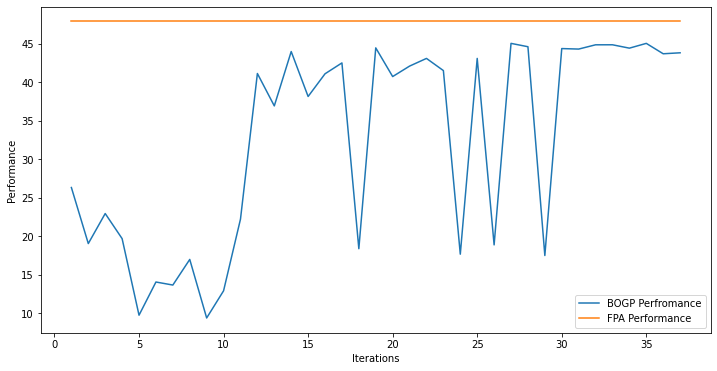

x_next is [  9.99815523   8.88710528   9.89324014   9.18710758   9.79469613
 -30.74427811   8.40886026   9.75965534 -30.94039669   9.89679246
   9.64633356   9.02684884   9.85411131   9.95511392   9.69022042
   9.33650801   9.72899129   9.54071149   9.62591219   9.49345945]
f()=44.365827, actual=44.500
36


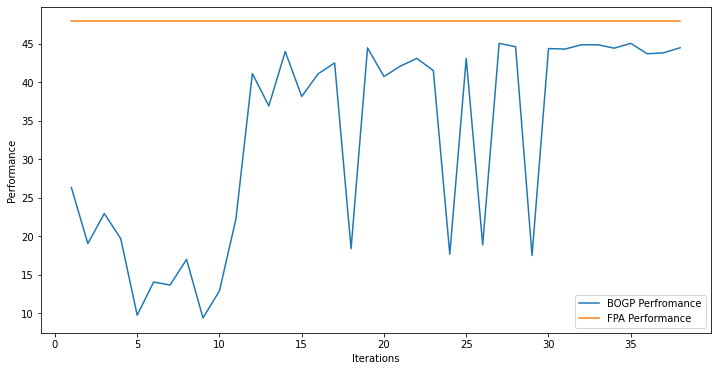

x_next is [  9.99999986   9.9999999    9.99999987   9.99999982   9.99999995
 -30.99999869   9.99999983   9.99999999 -30.99983772   9.99980771
   9.99999991   9.99999972   9.99991561   9.99999989   9.99999973
   9.99999985   9.99999978   9.99999988   9.99999979   9.99999938]
f()=44.934132, actual=45.067
37


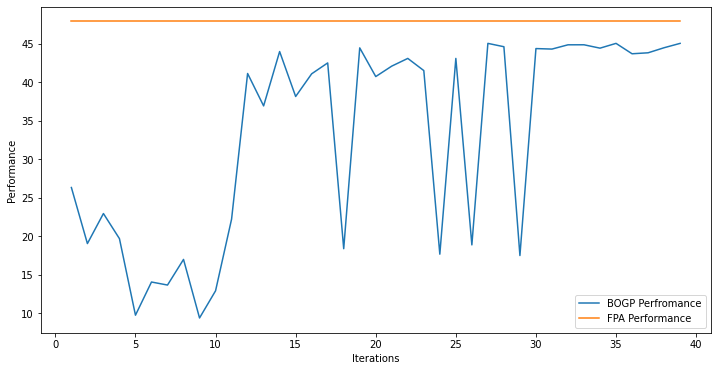

x_next is [  9.99999978   9.99998036   9.99999981   9.99999916   9.99999979
 -30.99999778   9.99999971   9.99997642 -30.99999832   9.99990088
   9.99999895   9.9999991    9.99999968   9.99999958   9.99999935
   9.99999933   9.9999998    9.99999973   9.99999974   9.9998539 ]
f()=44.972435, actual=45.067
38


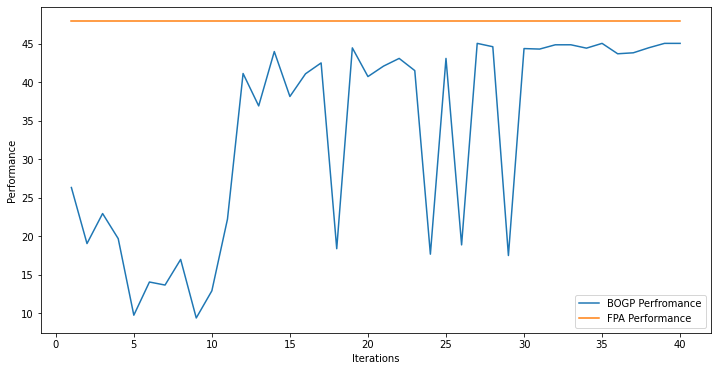

x_next is [  9.97603526   9.68869134   8.71258628   9.28941772   9.51464953
 -30.65356045 -30.86599413   9.26026223 -30.63113091   9.75212114
   9.94953058   9.42206258   9.00522975   9.01390546   9.88602261
   9.54884086   9.11474025   9.43665171   9.20726226   9.78271613]
f()=43.441976, actual=43.173
39


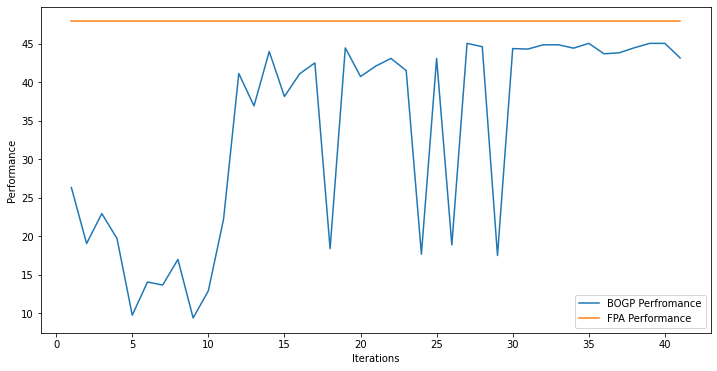

x_next is [  9.71109663   9.13346507   9.45419718   8.06222286   9.19873979
 -30.95318199   9.76789531   9.93209491 -28.10407335   9.5665968
   9.52040899   5.19258667   8.97024851   9.82566663   9.08256493
   9.88054705   9.92633637   8.04711762   9.57651582   9.68601237]
f()=43.885831, actual=44.093
40


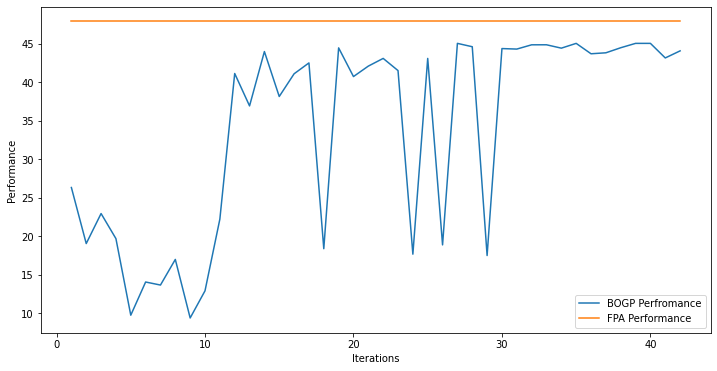

x_next is [  9.85090571   7.27786333   8.95171318   8.84553988   7.95796743
 -29.89398137   9.0679241    9.86675708 -30.94463512   9.76495279
   9.69619279   8.56133996   9.25307756   9.98886472   9.88075212
   8.6090054    9.62068132   9.63408656   9.8064891    9.57466698]
f()=44.162245, actual=44.002
41


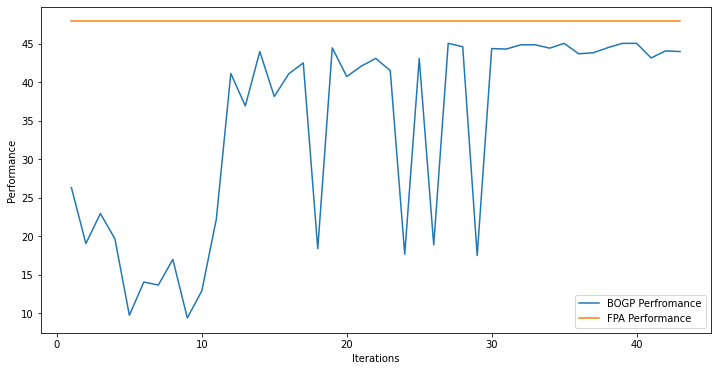

x_next is [  7.35575213   9.7733293  -29.36488141   9.23500073   8.66664368
 -29.63576209   5.93166149   7.25472248 -29.55297055   9.60705207
   9.87544641   7.49125416   9.54519503   9.0342661    7.3831177
   6.68368744   9.35690551   9.61933953   6.42651444   8.96121319]
f()=42.429673, actual=41.960
42


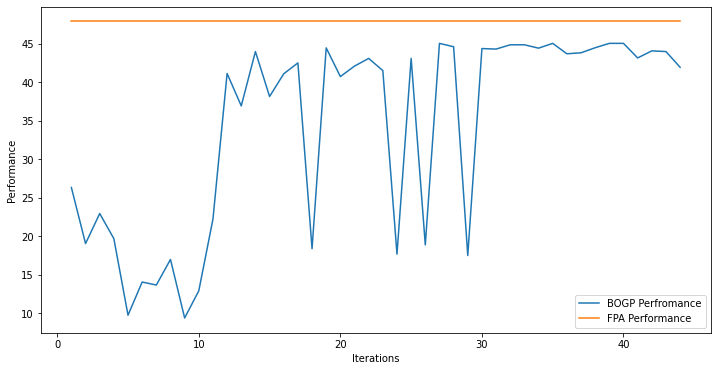

x_next is [  9.95810609   9.01078032   9.67559926   7.98107611   9.8760216
 -30.80846642   9.43456542   9.71143747 -28.88431165   9.94627979
   9.8895719    7.75140395   9.88614334   9.86606924   9.95239746
   9.74990224   9.05562803   9.97279073   9.6731567    9.73947197]
f()=44.463806, actual=44.911
43


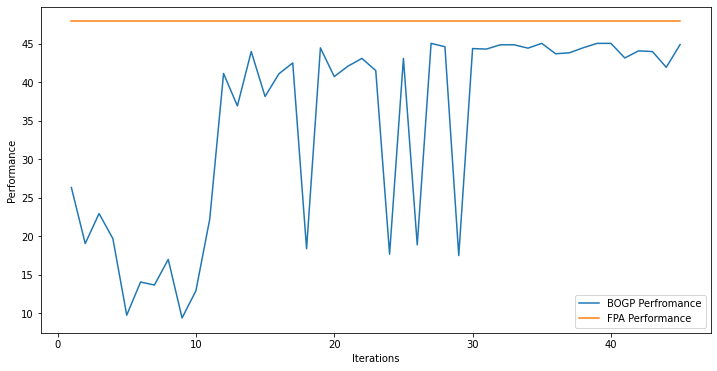

x_next is [  9.96794619   8.90071491   9.93668672 -30.49707229   9.80085563
 -30.59564148   9.8385068    9.51063871 -30.59102012   9.79635624
   9.97383075   9.86870098   9.91401153   9.89102957   9.78884259
   9.9686237    9.00704616   9.60474673   9.94351996   9.97980189]
f()=46.440086, actual=42.155
44


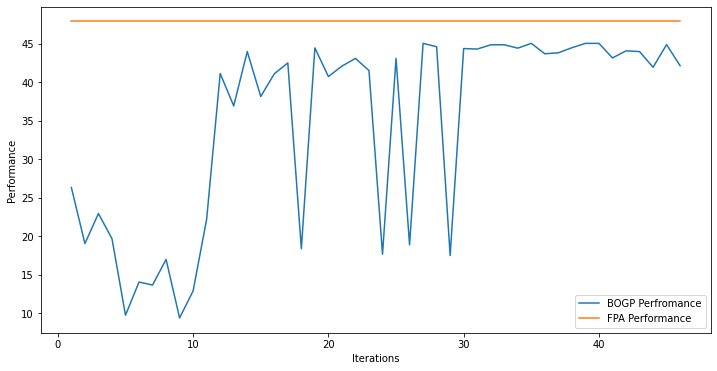

x_next is [  9.96201568   9.66974771   9.6129797    9.95781853   9.97188064
 -30.9265231    9.98470991   9.90473237   9.83370984   9.96997
   9.89716108   9.90503695   9.84301819   9.97431636   9.91088918
   9.93583964 -30.64665944   9.99702222   9.88170341   9.91938244]
f()=46.358784, actual=42.762
45


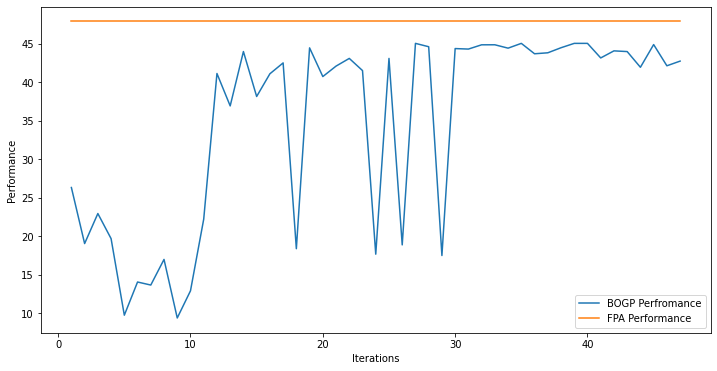

x_next is [  9.80408861   8.55414829   9.83428794   9.95311027   9.78496082
 -30.90013969   9.91706145   9.98899884   8.41516968   9.75205034
   9.90698454   9.38915669   9.99414933   9.67119528   9.98129803
   9.7577972    9.80058059   9.98963372   9.89480988   9.84022886]
f()=45.832477, actual=44.871
46


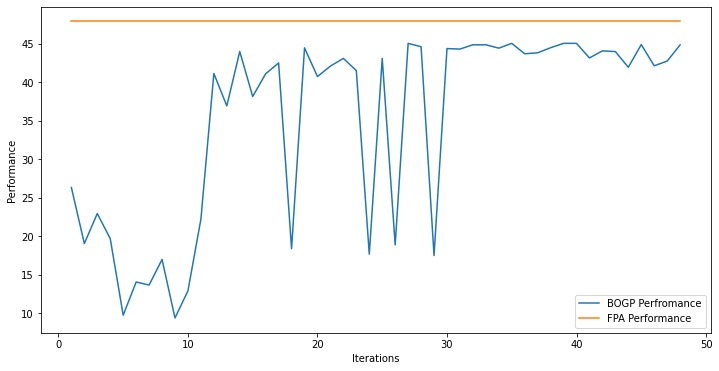

x_next is [  9.84795127   8.07841191   9.99615525   9.69942617   9.80279018
 -30.99283632   9.33092263   9.6567716  -12.36860157   9.59474151
   9.96522392   9.77285531   9.79779928   9.27713381   9.8321076
   9.98424497   9.27025297   9.71020779   9.55374152   9.8591513 ]
f()=45.308392, actual=44.508
47


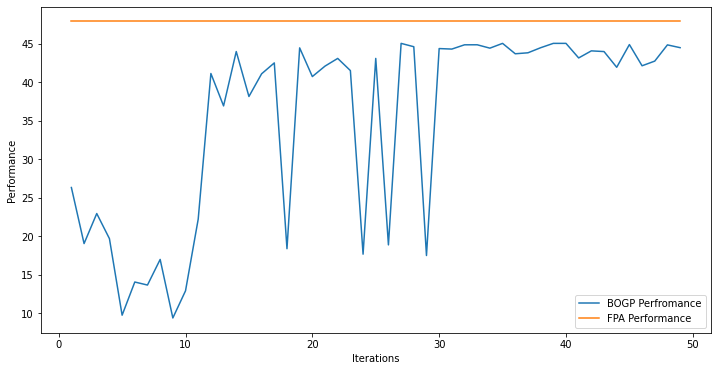

x_next is [  9.84523727   9.94185865   9.02653193   8.64611347   9.78938954
 -30.86604147   9.68868692   9.81650678 -27.15247886   9.92303633
   9.68198518   8.00261908   9.82819528   9.46347331   9.92471759
   9.96144713   0.84923016   9.97960335   9.93446095   9.87039526]
f()=44.904115, actual=43.388
48


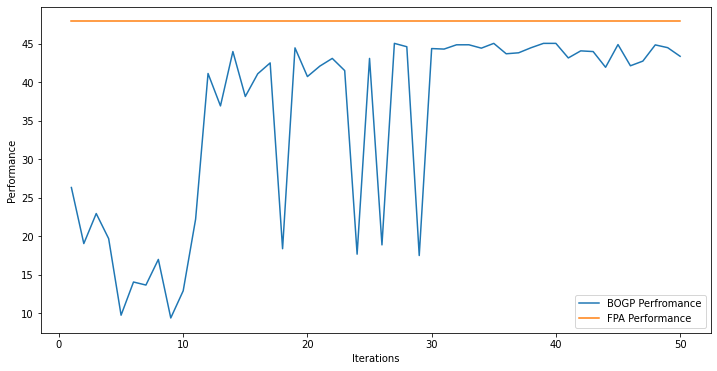

x_next is [  9.91218846 -30.92855852   9.92348844   9.7959688    9.90071116
 -30.86336827   9.91140178   9.89637858   9.96459797   9.93892079
   9.86745618   9.27703438   9.73594447   9.6593613    9.89410157
   9.83778714   9.81646401   9.98474255   9.94854137   9.95584807]
f()=44.748520, actual=44.606
49


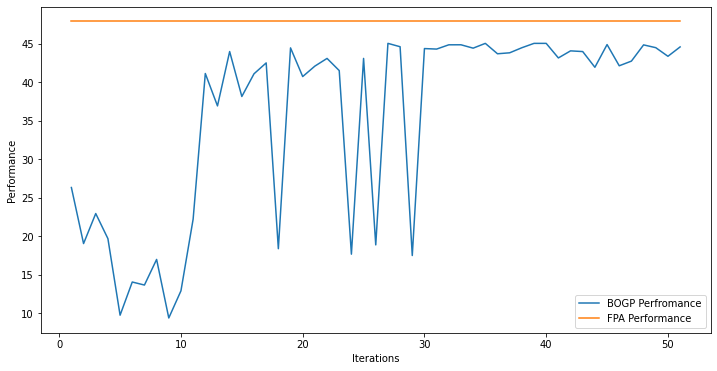

x_next is [  9.90451409   9.4429693    9.91108863   9.30971312   9.87573141
 -30.84983953   9.85579002   9.89533009   9.9364057    9.95205829
   9.9378058    9.69383191   9.76684271 -30.64293766   9.51058428
   9.98277484   9.91185583   9.97376931   9.98071232   9.75996091]
f()=44.479277, actual=44.486
50


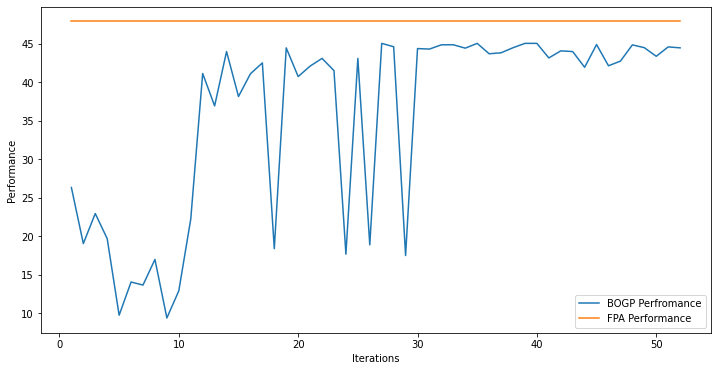

x_next is [  9.69421257   9.6021356    9.9548969    9.92853446   9.98852847
 -30.90696665   9.83882809   9.83770519   9.77432753   9.97203507
   9.9949037    9.9792667    9.93977434   9.71549252 -30.88960838
   9.88664361   9.92597941   9.99424602   9.97056537   9.82889143]
f()=44.335980, actual=44.469
51


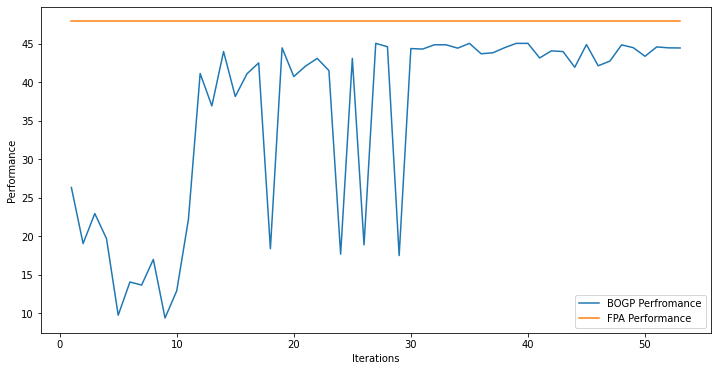

x_next is [  9.90076898 -30.87240905   9.99542783   9.88755015   9.91886888
 -30.97279263   9.95609737   9.8357863    9.96830404   9.71486952
   9.96969141   9.88610926   9.89216582   9.8176946  -30.60846708
   9.94696211   9.83193209   9.83988015   9.88533732   9.94733322]
f()=44.203673, actual=44.105
52


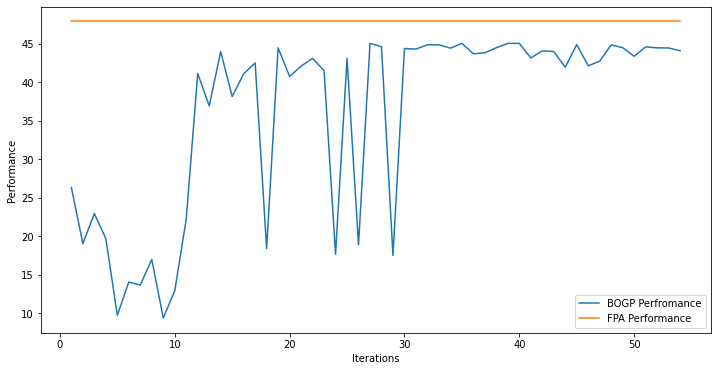

x_next is [  9.90689418   9.96050971 -29.81435441   9.98897883   9.9180639
 -30.95427227   9.84625854   9.79570091   7.74819952   9.94882973
   9.99073072   9.71932457   9.89660856   9.82566276   9.7886485
   9.83802249   9.91961852   9.99235699   9.96443779   9.97678992]
f()=44.589172, actual=44.803
53


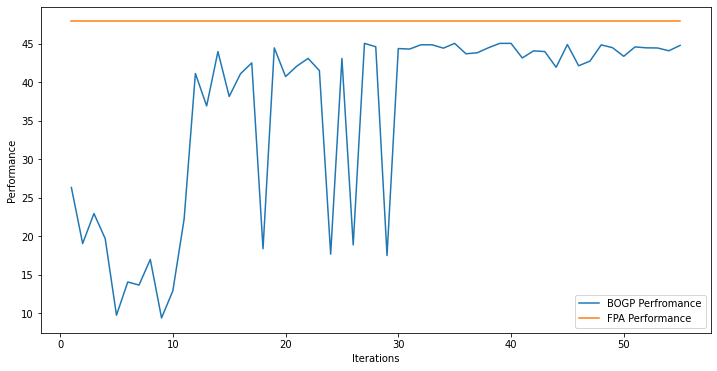

x_next is [ 10.           9.39941895   9.99999995   4.38942543   9.99999997
 -30.99816739   9.98983092  10.         -25.59870142   9.99999998
  10.           9.5378707   10.           9.99999999   9.99999999
   9.99999996   9.99999972   9.99999998   9.99999994  10.        ]
f()=45.448477, actual=45.855
54


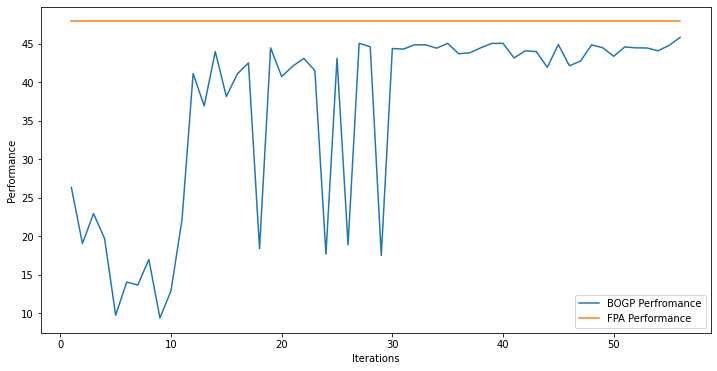

x_next is [  9.84483117   8.85794058   8.74296541  -1.64612775   9.77406642
 -30.37309956   9.70608406   9.77372448 -22.84760824   9.9647526
   9.98484852   9.37917675   9.86769016   9.52324334   9.8010472
   9.72665146   9.77905436   9.89549332   9.64858669   9.37257746]
f()=45.520690, actual=44.722
55


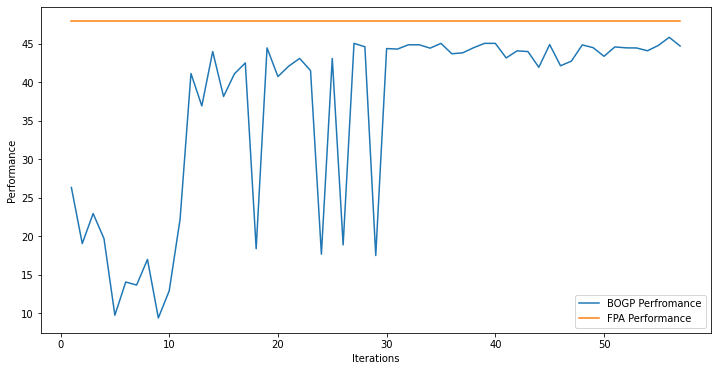

x_next is [  9.94978574   9.68458279 -30.47399104   9.57847015   9.83996969
 -30.95257255   9.90218809   9.92481403 -30.56319128   9.98938903
   9.96222209   9.81776385   9.97372677 -30.84661872   9.94731128
   9.93588146   9.98491235   9.83904389   9.96725521   9.89018925]
f()=44.022162, actual=44.164
56


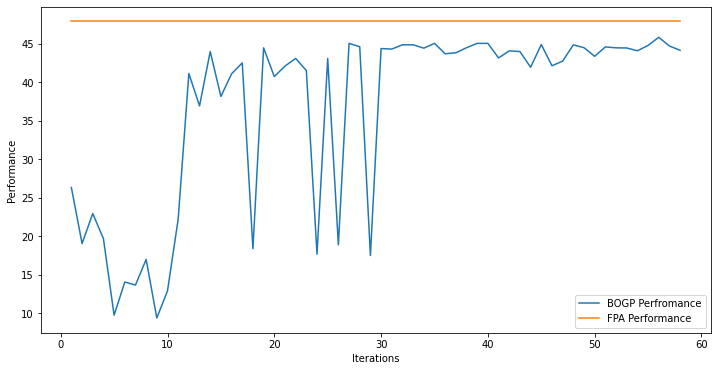

x_next is [  9.92227564 -30.76874715   9.76336585   9.74367324   9.80242955
 -30.8696911    9.61466809   9.8952024  -29.79388079   9.92490442
   9.99623284   9.81218985   9.93289394   9.95080429 -30.96088633
   9.94204117   9.9958997    9.92509562   9.95333887   9.91233793]
f()=44.210941, actual=43.926
57


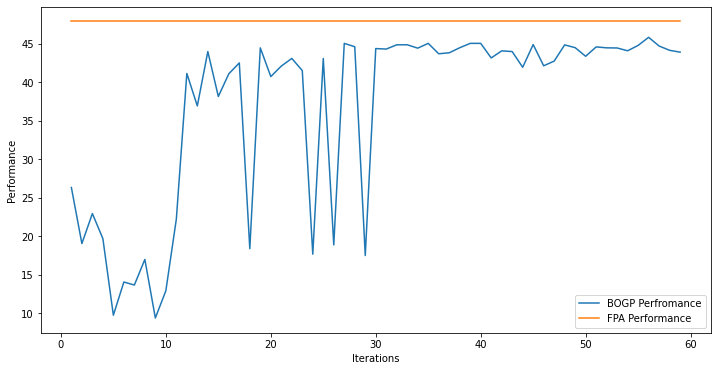

x_next is [  9.97052908   9.83159221   9.57604129   4.28350464   9.94335198
 -30.61994312   9.58073103   9.76009996 -25.45228434   9.99071743
   9.92578268   9.99519511   9.64625387   9.97883281   9.96080675
   9.69429055   9.90031873   9.95932738   9.91235328   9.9899708 ]
f()=45.628797, actual=45.736
58


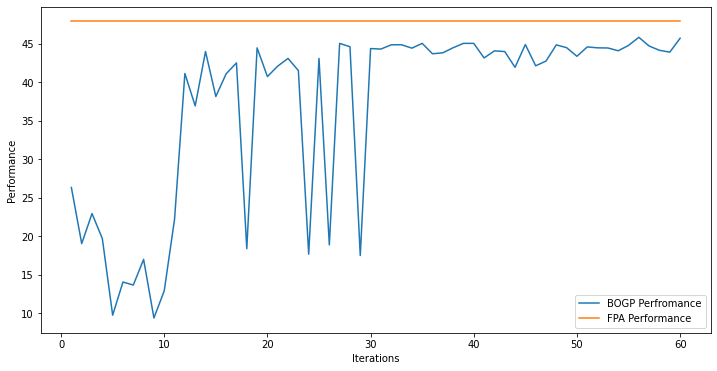

x_next is [  9.90315795   9.9296963    9.92554906   4.49156046   9.94078966
 -30.7560466    9.13619295   9.88599033 -24.37524221   9.68824726
   9.96266496   9.81238435   9.88928739   9.98706628   9.59903933
   9.97012087   9.97837419   9.98191118   9.97820996   9.88555127]
f()=45.707927, actual=45.709
59


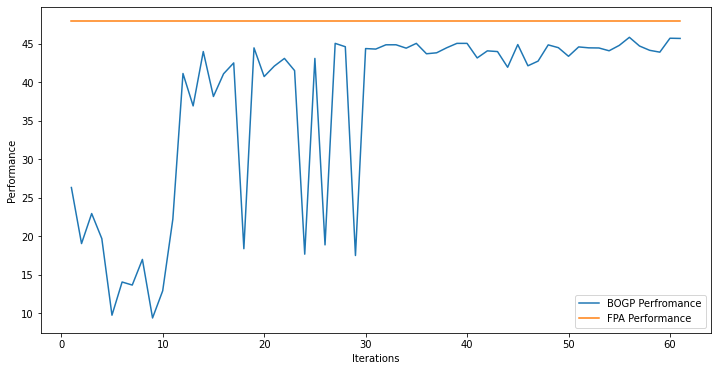

x_next is [  9.96475245   9.88824342   9.31301061   4.95603912   9.81240758
 -30.64716799   9.92457009   9.98378482 -24.92565544   9.56269551
   9.55560012   9.14828874   9.97868474   9.83417416   9.88176801
   9.78914266   9.94292108   9.91872944   9.7449902    9.90507617]
f()=45.527371, actual=45.769
60


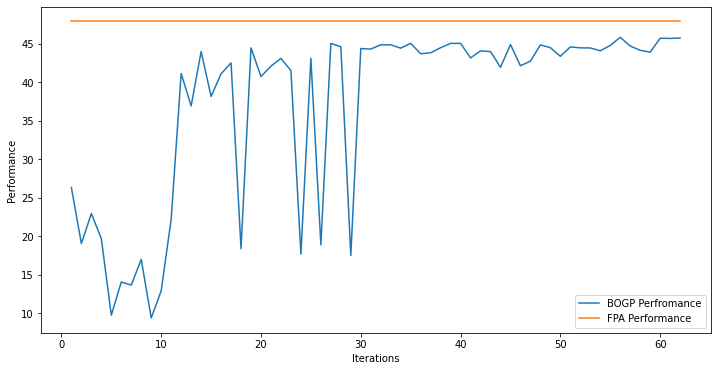

x_next is [  9.97294942   9.93552873   9.94312445   9.97430626   9.97640489
 -30.97845036   9.99054618   9.99233272 -17.98155162   9.89002982
 -30.98694614   9.94707111   9.99276438   9.94329464   9.9499999
   9.97481802   9.99157711   9.99104771   9.98862289   9.9947682 ]
f()=43.189165, actual=45.008
61


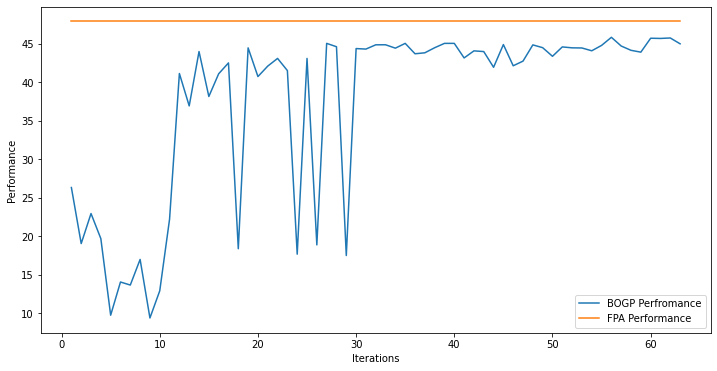

x_next is [  9.9675782    9.757586     9.89772673   5.07353501   9.86963055
 -30.04486995   9.6376781    9.57953557 -24.23492488   9.89299959
   7.70268104   9.89748759   9.8694952    9.96393372   9.76148722
   9.99081474   9.92123811   9.90447884   9.77383531   9.79191579]
f()=45.731458, actual=45.673
62


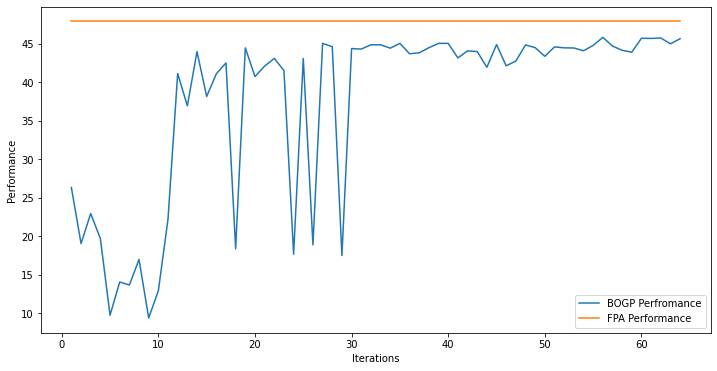

x_next is [  9.98084944   9.8611499    9.97305538   4.98671352   9.9603094
 -30.66022198   9.81325176   9.98648303 -24.79202133   9.60211354
   9.5785272    9.93732935   9.98831126   9.86321927   9.94700298
   9.91512695   9.91522393   9.97833537   9.85319457   9.92394483]
f()=45.847973, actual=45.904
63


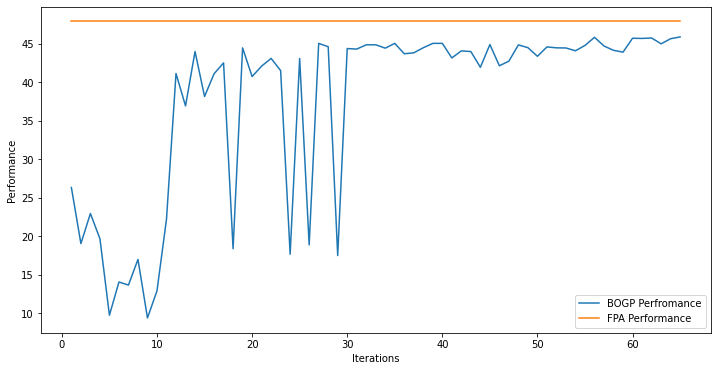

x_next is [  9.97297984   9.99427805   9.60071422   5.92020085   9.9387342
 -30.07805783   9.92913817   9.88973878 -24.06288175   9.63103093
   9.32987547   9.98552522   9.99469833   9.94121775   9.94628951
   9.48803396   9.92836531   9.98650661   8.85359547   9.92662681]
f()=45.853572, actual=45.924
64


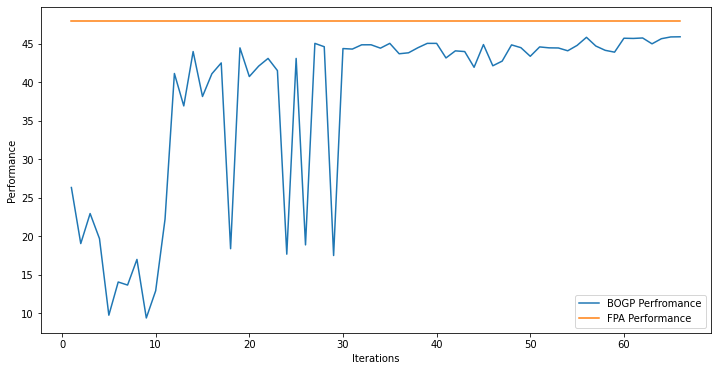

x_next is [  9.93290978   9.97894104   9.87260373   5.20757432   9.99008847
 -30.62594822   9.97583278   9.86007812 -24.28880837   9.22722002
   9.47219087   9.86496127   9.9927104    9.92194622   9.950767
   9.54966581   9.99000116   9.97640737   8.57832014   9.92567081]
f()=45.922229, actual=46.027
65


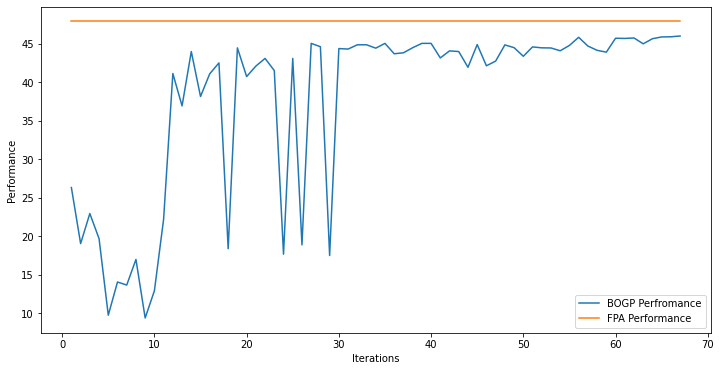

x_next is [  9.96753459   9.95908752   9.99954133   9.96533916   9.98835647
 -30.92440095   9.96187646   9.89768602 -24.34266108   9.71832393
   9.92257208   9.91167421   9.93328362   9.8909503    9.96042171
   9.95254008   9.95661352   9.98047139 -30.90222593   9.9710956 ]
f()=46.651660, actual=40.852
66


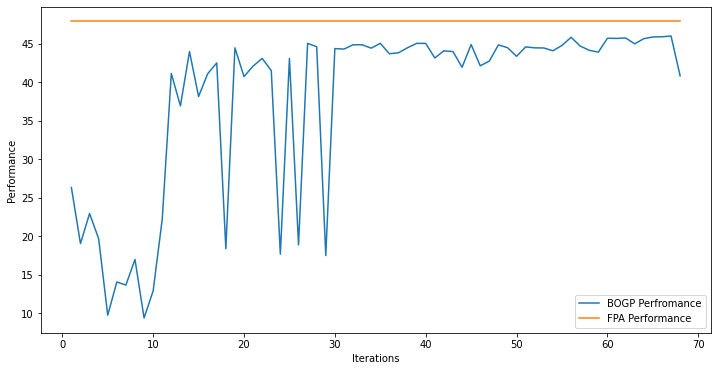

x_next is [  9.99999491   9.90467943   9.97969771   9.29637469   9.99999687
 -30.8851996    9.99999731   9.99999729 -17.7079877  -16.0751116
   9.72947441   9.99999836   9.97742229   9.87585244   9.9150569
   9.9583032    9.97837895   9.99999685   9.88809189   9.99502761]
f()=45.747527, actual=41.816
67


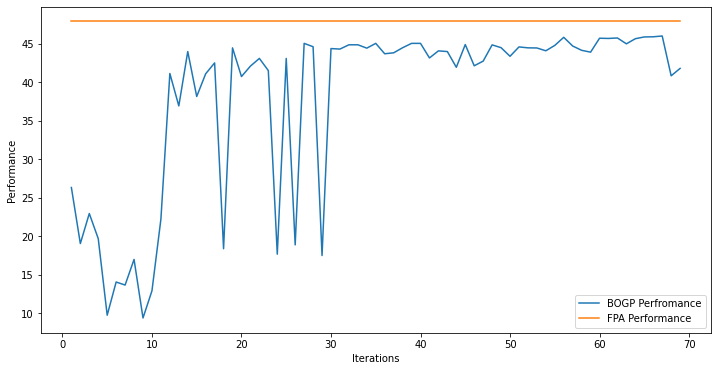

x_next is [  9.91014308   9.82630409   9.79899371   5.16719544   9.98391352
 -30.98952467   9.96342402   9.93551018 -24.62664935   9.09272303
   9.75171137   9.96574028   9.95867905   9.97826378   9.83514342
   9.82491147   9.98396944   9.97756976   5.71974278   9.98888855]
f()=46.081434, actual=45.880
68


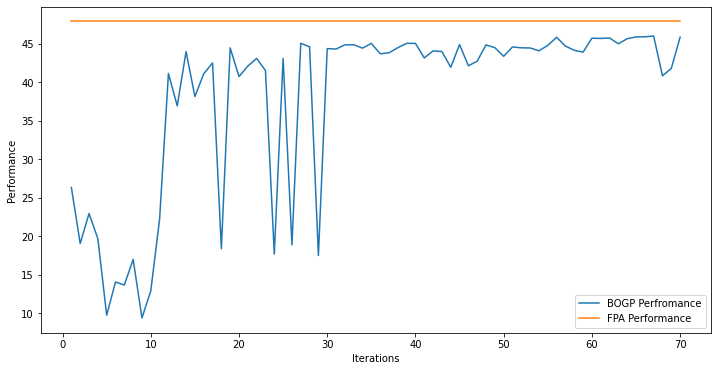

x_next is [  9.90365457   9.58998471   9.66110601   5.10024304   9.99300173
 -30.42079343   9.968052     9.69782427 -24.17053845   8.74858277
   8.71127908   9.99435201   9.85962566   9.75524198   9.87207939
   6.15892678   9.90883655   9.99644683   9.1991214    9.93467869]
f()=45.942448, actual=45.786
69


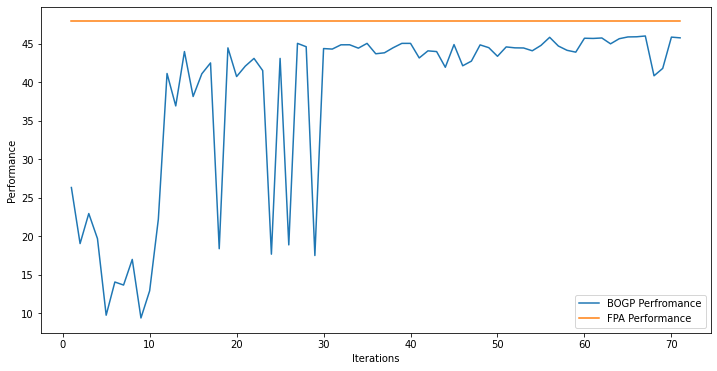

x_next is [  9.92988087   9.90588832   9.78971261   4.96003828   9.90672595
 -30.59210879   9.9964016    9.86955972 -24.45281654   9.26564066
   9.20134356   9.62959308   9.99777842   9.98637185   9.96185868
   9.00280987   9.90497767   9.96199523   8.43447703   9.99244686]
f()=45.984558, actual=45.996
70


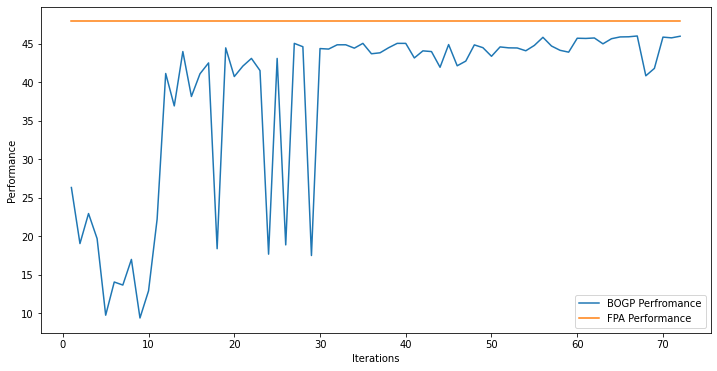

x_next is [  9.99999999   9.99982887   9.85468538   4.81146313   9.95488554
 -30.96927718  10.           9.99999991 -24.11388206   9.09661345
   9.33747203   9.99342847  10.           9.43528881   9.99972146
   8.78501196   9.9894678   10.           8.16820075  10.        ]
f()=46.079331, actual=46.076
71


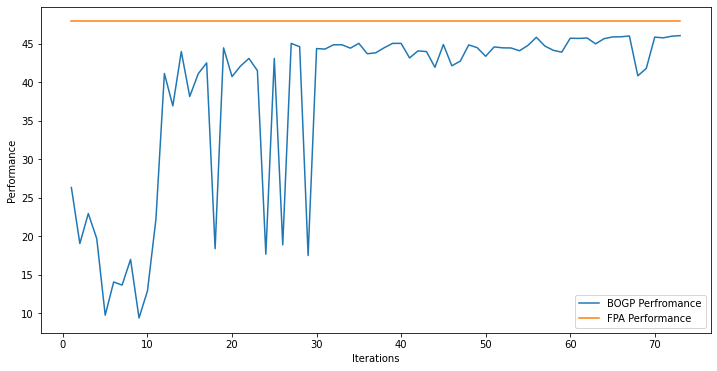

x_next is [ -1.61176024   2.70748358 -29.57203914 -21.07638656 -18.90461061
   2.93974555 -24.61027447   7.56306217  -9.11213597 -20.78180247
   8.06825906  -0.56372074 -25.21571832   6.12427195 -23.21812398
  -2.4498972  -20.58028049   8.72481477  -8.0325495  -23.01561611]
f()=38.412663, actual=15.823
72


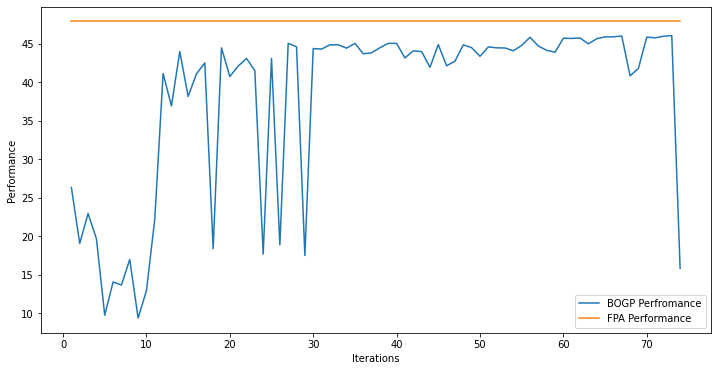

x_next is [  9.97843983   9.96639452   9.95627095   4.63999588   9.84294863
 -30.74334624   9.99578844   9.94732355 -24.22121309   8.93063186
   9.24867818   9.89570293   9.93700668   9.96520032   9.99822496
   8.43456707   9.94763221   9.97021246   8.57846006   9.96912063]
f()=46.037228, actual=46.082
73


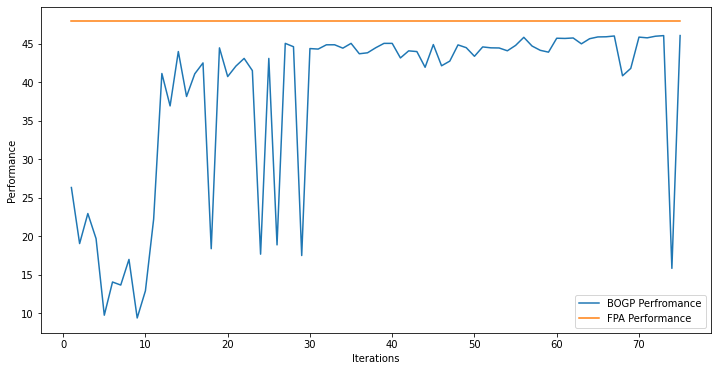

x_next is [  9.99775617   9.92493692   9.95849616   4.27750304   9.98302681
 -30.5745718    9.92420479   9.99504762 -23.91240005   8.12023991
   9.65516606   9.90514346   9.91531625   9.98651316   9.9218155
   7.87007588   9.95737752   9.94730801   8.51185197   9.99610133]
f()=46.076611, actual=46.146
74


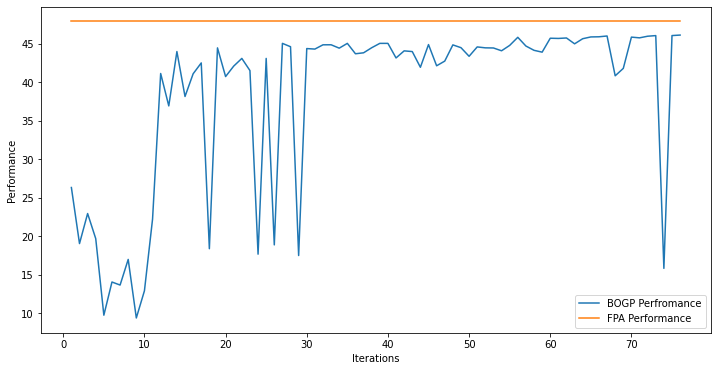

x_next is [  9.97859496   9.87787168   9.9014269    3.49071726   9.96494683
 -30.39442623   9.92445073   9.89703831 -24.39250262   6.52911756
   9.71291431   9.99920759   9.9584652    9.98112951   9.99969896
   9.50987407   9.97917235   9.96352477   8.09699428   9.98130869]
f()=46.143658, actual=46.138
75


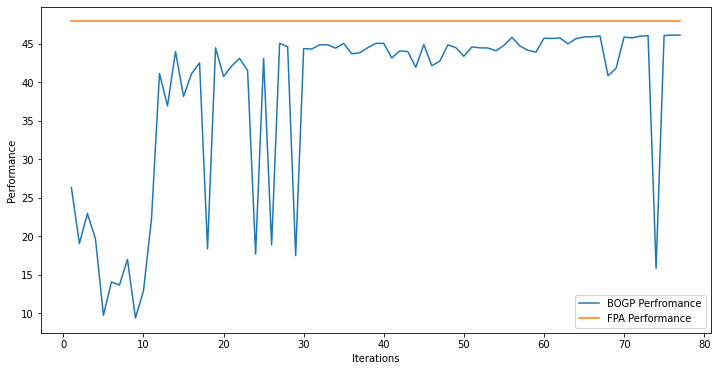

x_next is [  9.99268424   9.99820849   9.85168356   4.3298314    9.98439001
 -30.94336387   9.92157672   9.85921071 -23.71662603   7.23172257
   9.90632234   9.67472184   9.93891574   9.79463564   9.98728022
   9.28497125   9.99598256   9.99927233   8.78491456   9.93577296]
f()=46.129367, actual=46.114
76


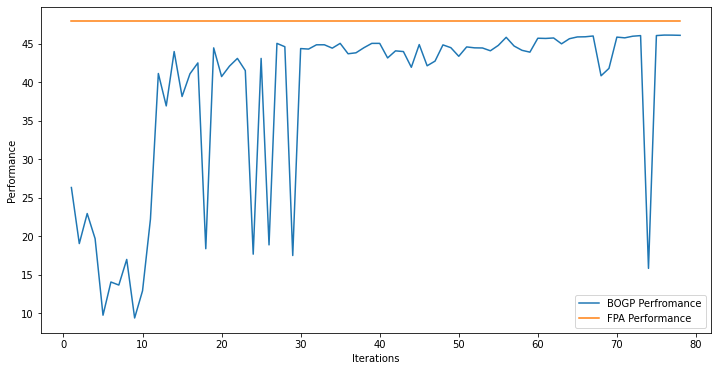

x_next is [  9.98194945   9.94907594   9.93975688   4.37291498   9.80590065
 -30.85248421   9.99227563   9.93277759 -23.45501299   6.48574124
   9.57411496   9.91936876   9.99206736   9.89542245   9.82920894
   8.78060303   9.97715241   9.97008065   8.20220689   9.96351943]
f()=46.120860, actual=46.137
77


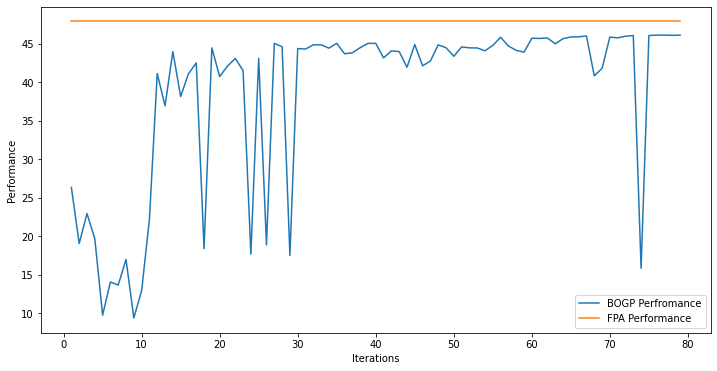

x_next is [  9.99999999   9.99999995   9.99992385   4.11156356   9.99986907
 -30.87132127  10.           9.99993466 -23.95148436   6.92414954
   9.84567166   9.999786     9.99999997   9.99973266   9.99996866
   8.26699735   9.99999998   9.99999999   8.09317994   9.99999999]
f()=46.259440, actual=46.267
78


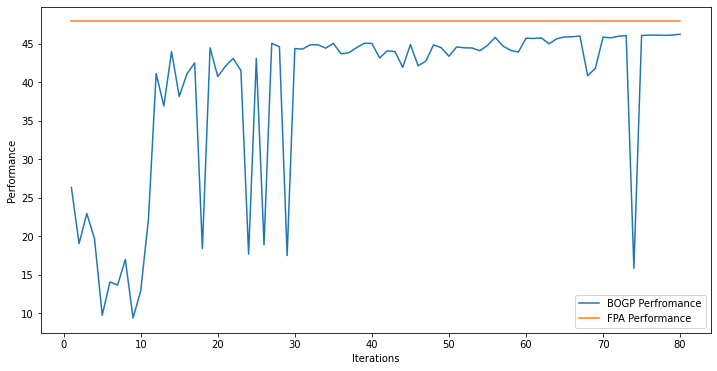

x_next is [ 10.          10.           9.99510971   4.0883792    9.9161908
 -30.35596496   9.99528125   9.99810012 -24.06780322   6.88701126
   9.98722454   9.99999999  10.           9.99999999  10.
   8.27121734  10.          10.           8.00316348  10.        ]
f()=46.243791, actual=46.251
79


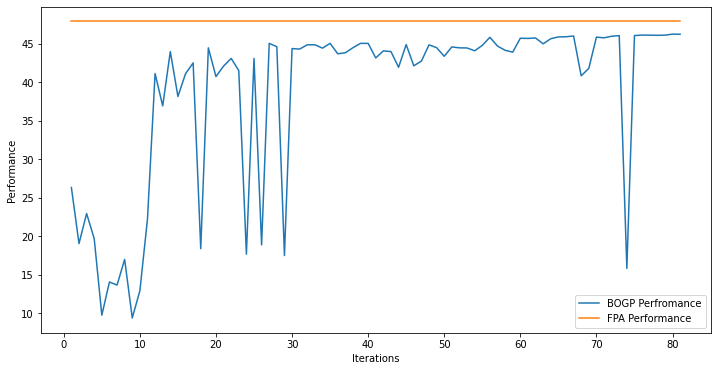

x_next is [ 10.           9.99999997   9.99996722   4.0905727   10.
 -30.76459918   9.99999999   9.99998689 -24.07450801   6.8237832
   9.99999998   9.99999998   9.99999999   9.99999999   9.99999999
   8.13014958   9.99999999   9.99999999   8.00702038   9.99999999]
f()=46.269031, actual=46.265
80


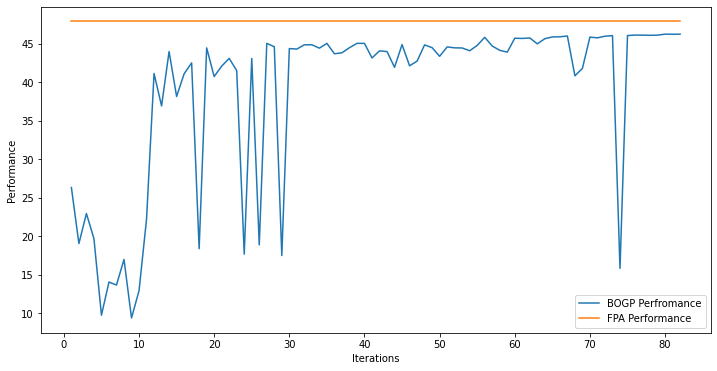

x_next is [  9.99822459   9.99323287   9.9742254    4.04790964   9.90941288
 -30.88669722   9.9851591    9.98881758 -24.07494429   6.76010385
   9.55862613   9.97068809   9.99781774   9.9518307    9.99257845
   8.43647784   9.98226882   9.97009137   8.03924454   9.99824384]
f()=46.224246, actual=46.221
81


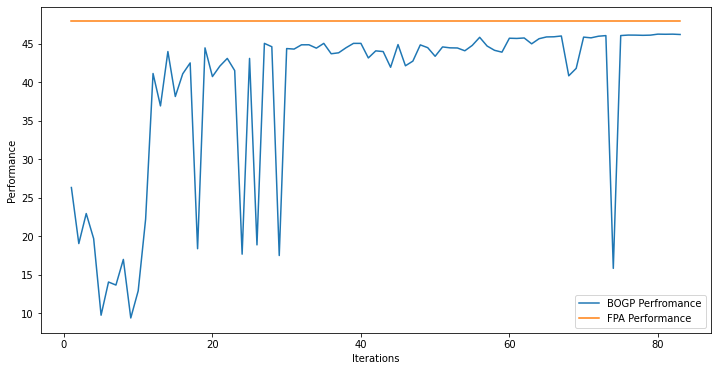

x_next is [  9.9997707  -17.21413878  -4.89970455   9.99330687   9.99909303
 -30.99996366   9.99980793   7.74079142 -18.70657107   8.54196807
   8.20460871  -4.77022366   3.84369755 -11.52534657 -14.65185845
   5.56390176   9.99986145   9.36205404   9.9993795    9.99993725]
f()=54.394572, actual=40.029
82


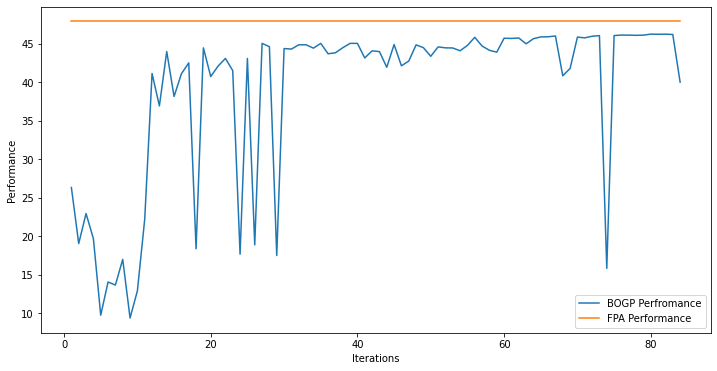

x_next is [ 10.           9.99999997   9.99999999   4.19281733   9.99999999
 -30.63521536   9.99999999   9.99999996 -22.94124204   6.99993037
   9.9447259    9.99999999   9.99999999   9.99999998  10.
   8.25885172  10.          10.           7.56729304  10.        ]
f()=46.250592, actual=46.255
83


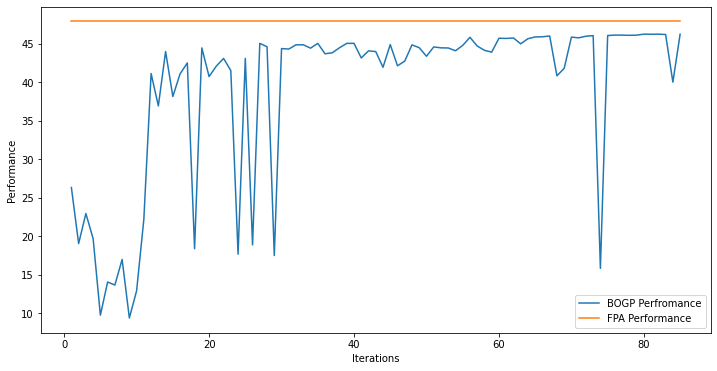

x_next is [  9.97768155   9.96272655   9.99999987   4.01029544   9.99999987
 -30.93934527   9.99999987   9.99999987 -23.14441413   6.75392202
   9.93086286   9.9771133    9.97789083   9.93589316   9.98345243
   7.77547042   9.98891356   9.99999987   7.822188     9.99999987]
f()=46.230166, actual=46.228
84


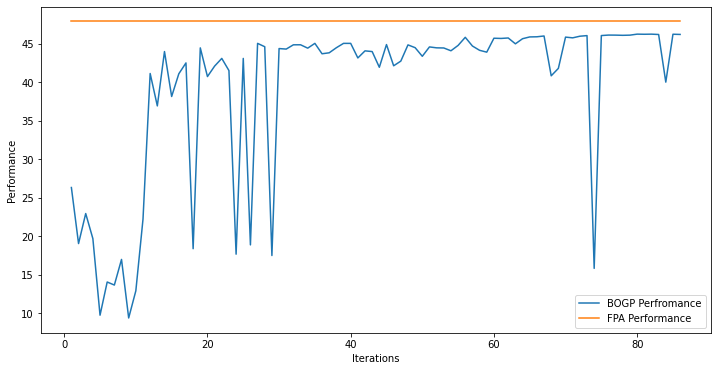

x_next is [  9.99999999  10.          10.           4.11845031  10.
 -30.59976279  10.          10.         -23.73797878   7.00561275
   9.93078676   9.99999999   9.93633269   9.99999998   9.99999996
   8.31678629  10.           9.97127507   7.97971256  10.        ]
f()=46.253185, actual=46.247
85


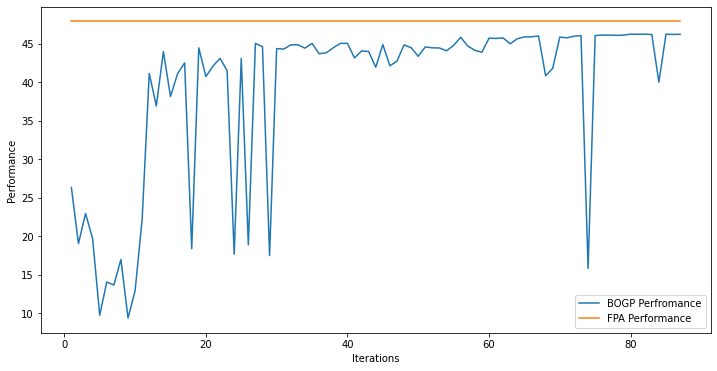

x_next is [  9.99546619   9.98001891   9.98673545   9.99361639   9.99871886
 -30.99694526   9.96606121   9.99963065 -30.95270907   9.99778511
   9.98432183   9.99903      9.96427093   9.99930928   9.99925376
   9.99184579   9.99123617   9.99904002   9.99418357   9.99895442]
f()=39.247854, actual=45.051
86


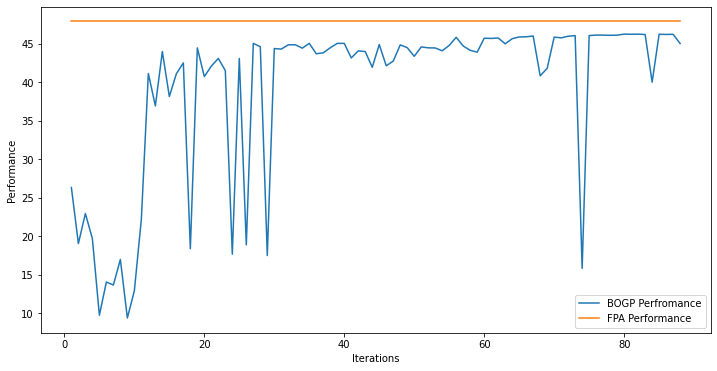

x_next is [  7.55314209 -12.66795408   8.24008095   3.94711169   2.61831219
 -25.71607295 -12.49439407   8.32455707 -27.14583942   6.04392892
 -10.53690092  -4.52555825   0.08842239 -20.4332737   -6.26138385
  -8.39290217 -16.63469406  -3.71601929   5.2895712    8.3308442 ]
f()=29.525139, actual=29.107
87


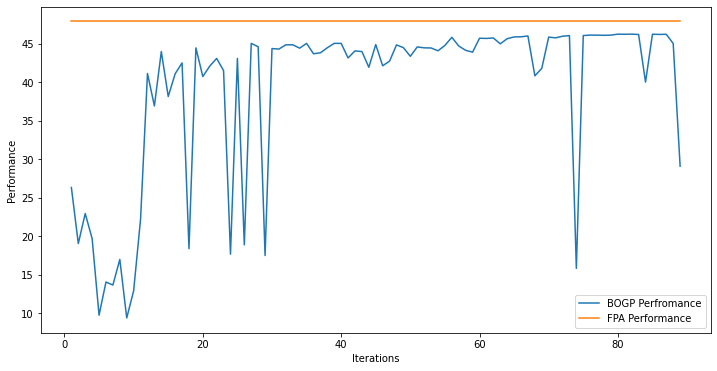

x_next is [ 10.          10.           9.73282446   3.76473135   9.99999676
 -30.5522413    9.99999563   9.95060707 -23.3035794    6.76459071
   9.00817382   9.99999868   9.99999021   9.96214928  10.
   8.78208606  10.          10.           7.68484869  10.        ]
f()=46.203983, actual=46.225
88


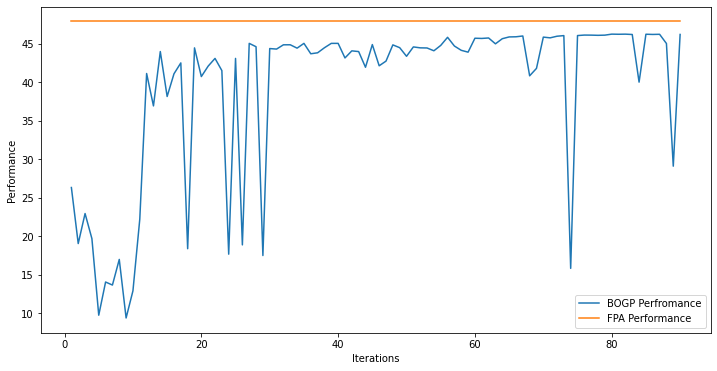

x_next is [  9.99999999   9.99999999   9.99995005   3.94679844  10.
 -30.60336575   9.99999999  10.         -23.73579792   7.0597788
   9.79824733   9.99999998   9.99999998   9.99999998   9.99999996
   8.20818973  10.          10.           8.0773397   10.        ]
f()=46.270438, actual=46.269
89


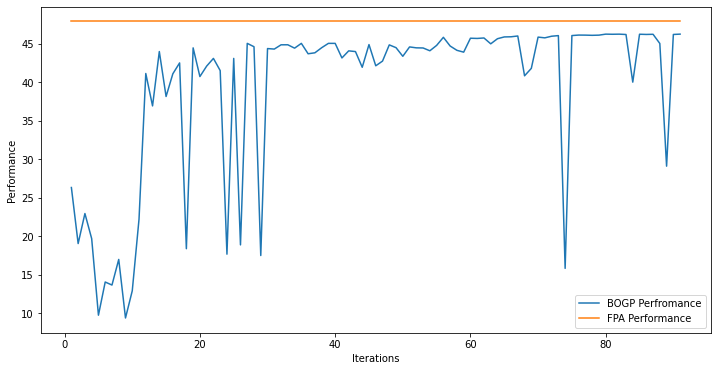

x_next is [  9.93220063   9.98866408   9.93426874   4.0443874    9.99363914
 -30.67961504   9.92354584   9.92759141 -24.60937102   7.03342517
   9.33306402   9.90572105   9.98688501   9.96305257   9.94295915
   8.53840706   9.95914921   9.99079713   8.31729942   9.99911942]
f()=46.177375, actual=46.197
90


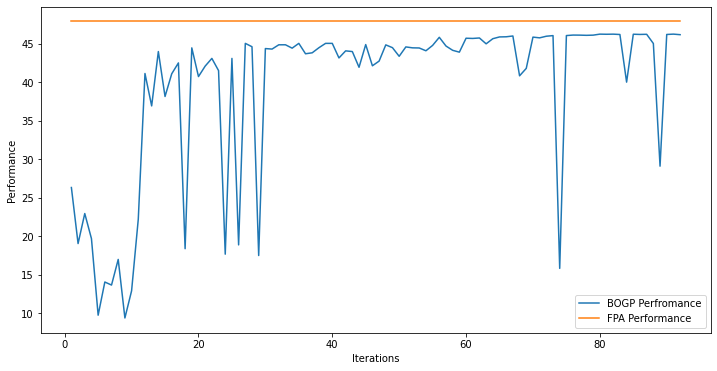

x_next is [  9.97155726   9.98677005   9.99921837   4.01728406   9.99329205
 -30.23533136   9.95396277   9.92759091 -24.05919037   7.33657199
   9.40739841   9.97299872   9.98038737   9.97704267   9.93718373
   8.45448103   9.93937838   9.99571107   7.84710466   9.96612636]
f()=46.210555, actual=46.207
91


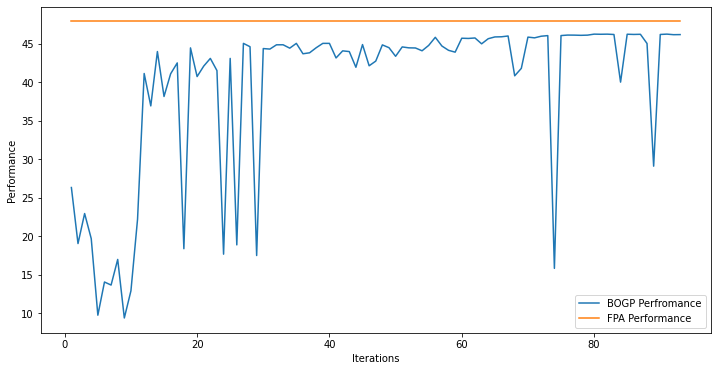

x_next is [ 10.          10.           9.99716089   4.2732887    9.99947483
 -30.39397824  10.           9.99756916 -23.96113519   6.96741943
   9.57523609   9.99983033   9.99999999   9.99999999  10.
   8.26262562  10.          10.           8.31092721  10.        ]
f()=46.271120, actual=46.263
92


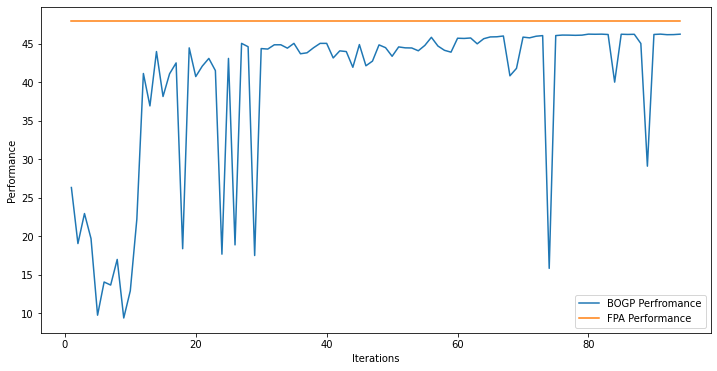

x_next is [  9.98502098   9.95327606   9.94393375   3.5715214    9.85968072
 -30.5416131    9.93829306   9.95859448 -23.90743308   7.23850176
   9.61422274   9.96093233   9.97576369   9.97656748   9.99361153
   7.91145544   9.929288     9.96158846   8.23866244   9.99577992]
f()=46.175588, actual=46.181
93


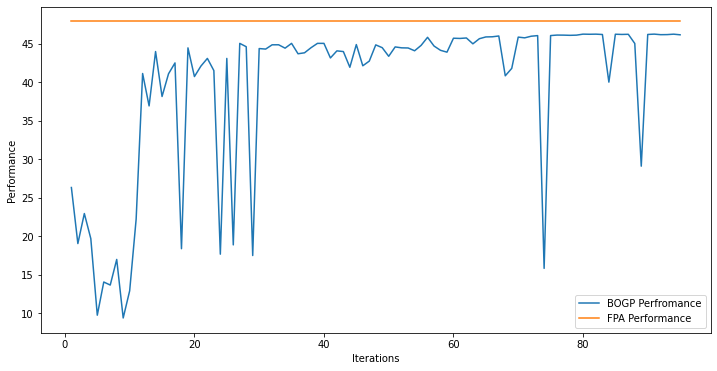

x_next is [  9.99937581 -13.01680889   9.0717791    9.99976528   9.99987638
 -30.99985228   9.99919878   9.99926031   3.42979652   9.99986048
   9.46601377   9.99940745   9.99976413   9.9998967  -15.8550543
   9.99928816   9.9959993    9.99993464   9.99927556   9.99927517]
f()=46.636788, actual=44.055
94


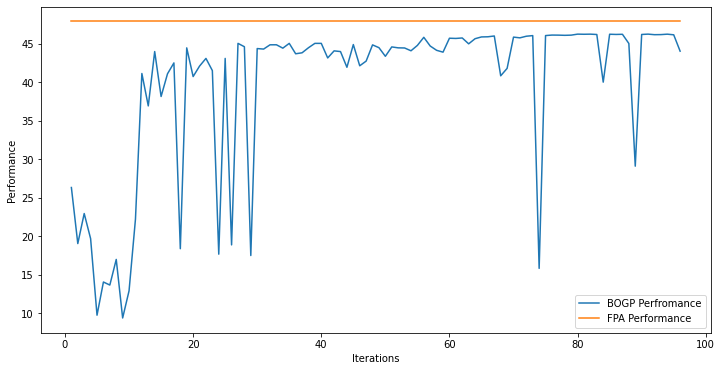

x_next is [  9.99999983   9.93821678   9.99999955   4.00652258   9.9999996
 -30.63395151   9.96991665   9.99999971 -23.80221597   7.06987258
   9.50374547   9.99999965   9.99648896   9.9999999    9.99999994
   8.34114557   9.99999984   9.99999995   7.94146658   9.98604184]
f()=46.249591, actual=46.251
95


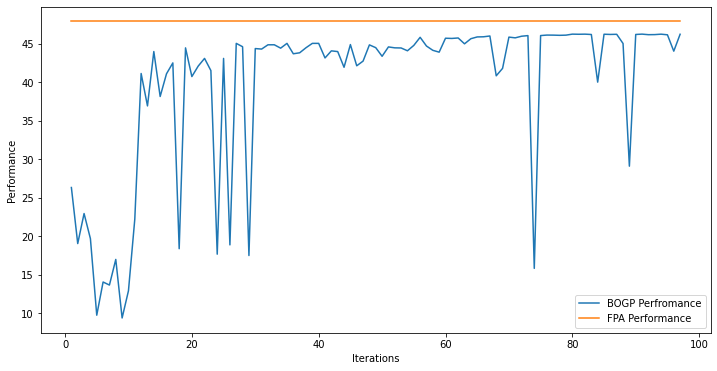

x_next is [  9.98324095   9.92490475   9.89946984   3.65665849   9.99587517
 -30.80390686   9.98374374   9.97761535 -24.1435834    6.99783296
   9.60428614   9.90587724   9.99443143   9.95618665   9.98073691
   8.35905215   9.9651412    9.96858863   8.61187907   9.98081628]
f()=46.204434, actual=46.212
96


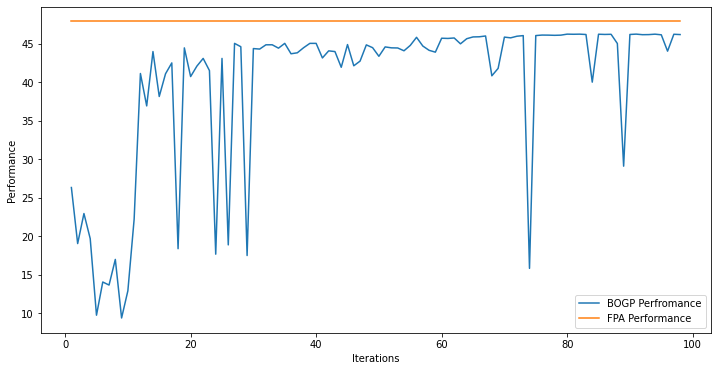

x_next is [  9.99999999   9.99999992   9.9999999    3.81748292  10.
 -30.63794442   9.99999997   9.99999993 -24.18073867   7.12430983
   9.74128531   9.99999995   9.99999999   9.99999996   9.99999999
   8.2703553   10.           9.99999999   8.28561056  10.        ]
f()=46.271133, actual=46.271
97


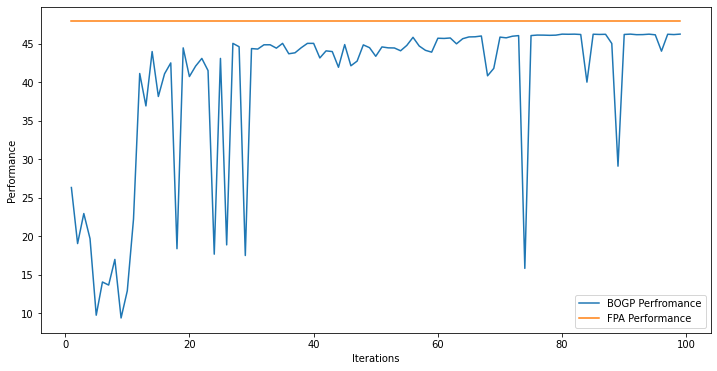

x_next is [ 10.           9.99999984   9.92951591   3.65462727   9.98786423
 -29.92656981   9.99999999   9.99999999 -24.28846186   7.25856904
   9.57255198   9.99999991  10.           9.9999998    9.93707092
   8.34452861   9.99999994   9.99999999   7.80359433  10.        ]
f()=46.243429, actual=46.249
98


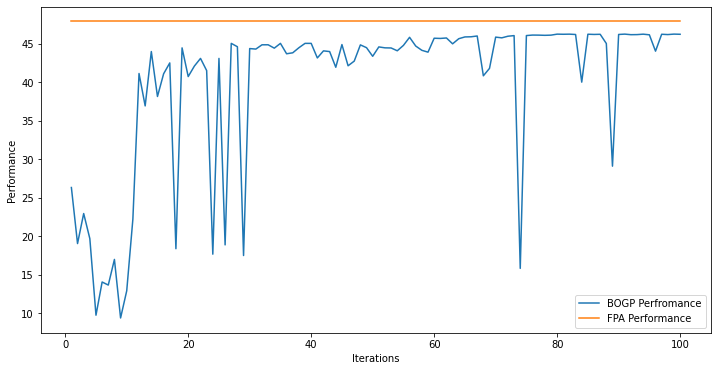

x_next is [ -2.38001707   1.227528     6.26055221   2.07211143  -2.70605609
   0.61563674 -12.06251094   4.64676369   9.21340295  -2.59158074
   4.68256349 -28.01418476 -11.25108772 -27.05121998   5.89132024
  -0.7427434  -28.9657127  -15.44502887 -17.66954744  -4.0689475 ]
f()=39.953909, actual=18.848
99


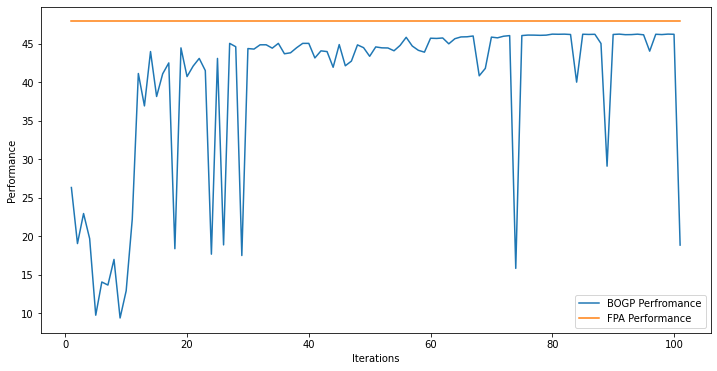

x_next is [  9.9999999    9.99981666   9.99937435   3.76469505   9.9999997
 -30.58759468   9.99999943   9.98159072 -24.2394286    7.09699757
   9.6661471    9.99999898   9.99999972   9.99999961   9.99805954
   8.24819968   9.9999993    9.99999971   8.27813615   9.9999997 ]
f()=46.268947, actual=46.268
100


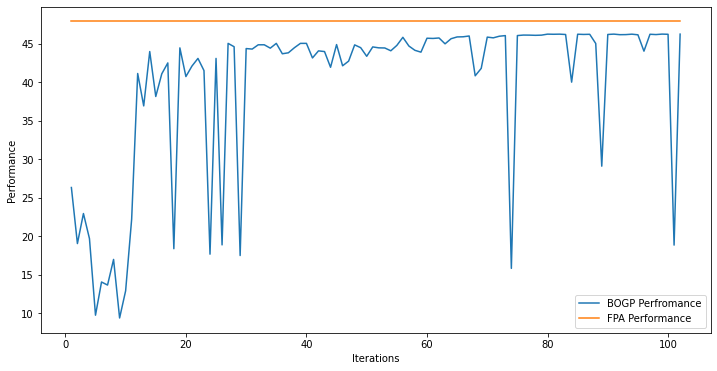

x_next is [  9.99999798   9.99934444   9.95537537   3.9020196    9.9999979
 -30.52477382   9.96143772   9.94790729 -23.72693008   7.20189583
   9.8516123    9.98693578   9.97355049   9.89859807   9.84798213
   7.9390439    9.99999714   9.98094411   8.09713449   9.95719705]
f()=46.205953, actual=46.206
101


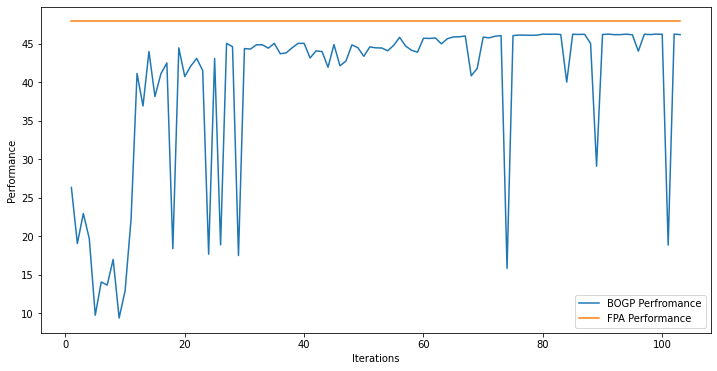

x_next is [  9.99285556   9.99548572   9.98543743   3.7842389    9.99822017
 -30.72728178   9.97209832   9.99548468 -24.29123353   7.05783418
   9.968431     9.9443568    9.97409849   9.98916628   9.95612397
   7.98851966   9.99609845   9.99500261   8.09408329   9.96682277]
f()=46.235874, actual=46.237
102


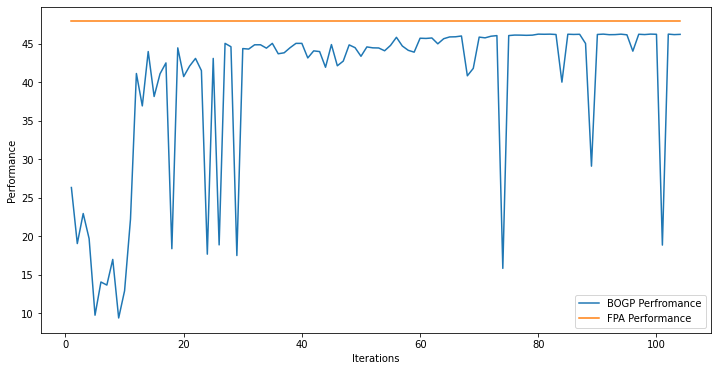

x_next is [  9.99999986   9.99999978   9.83552539   3.56769119  10.
 -29.33293853   9.99999987   9.99999987 -24.36518077   6.91346634
   9.8567133    9.96978785   9.99999987   9.99999987   9.99554458
   8.4023625    9.99999986   9.92682919   8.2952811    9.99999985]
f()=46.220064, actual=46.242
103


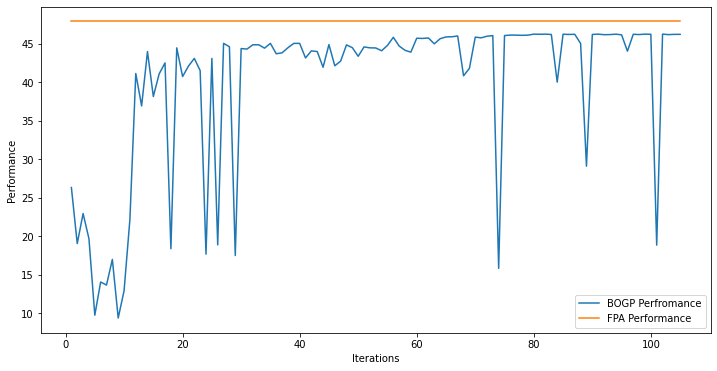

x_next is [  9.99999999  10.          10.           3.72614993   9.99999999
 -30.01571531   9.99999997   9.9999529  -24.32900567   6.96681409
   9.99999999   9.99999999  10.           9.99977086   9.99999999
   8.19676717   9.99999999  10.           8.33870015  10.        ]
f()=46.271753, actual=46.272
104


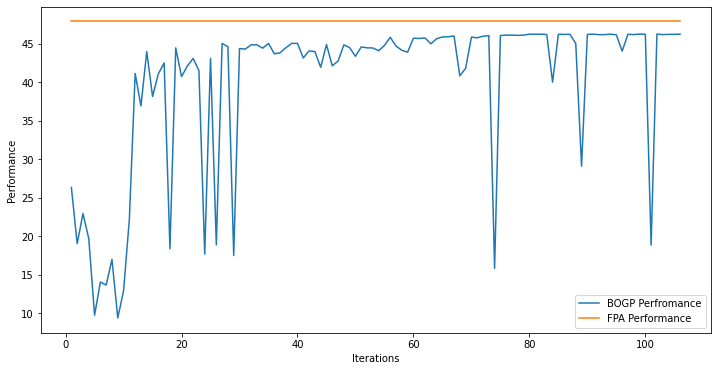

x_next is [  9.98501509   9.9961033    9.99822055   3.63333774   9.99171148
 -30.43472903   9.98989342   9.98966181 -24.5402609    7.01480196
   9.91131858   9.96876954   9.99217739   9.99934135   9.99215102
   8.04885968   9.99777734   9.99898053   8.41408349   9.99281823]
f()=46.255889, actual=46.255
105


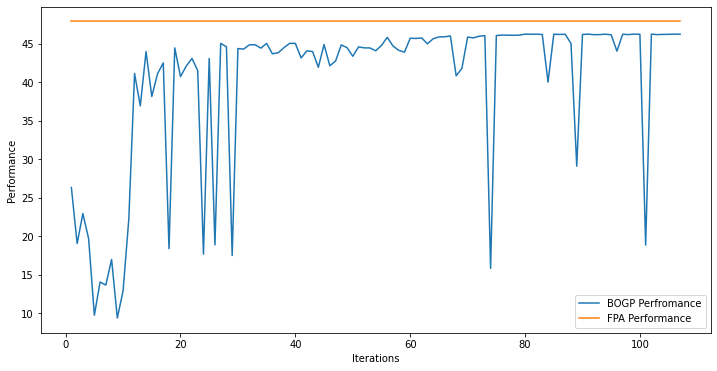

x_next is [  9.98408446   9.98329061   9.98798602   9.99097626   9.994973
 -30.98022127   9.99765588   9.99082319 -30.99364033   9.99333996
   9.99093784   9.99453214   9.9829335    9.99867734   9.98381314
   9.98664248   9.99284093   9.97677685   9.9889346    9.99529886]
f()=40.109793, actual=45.051
106


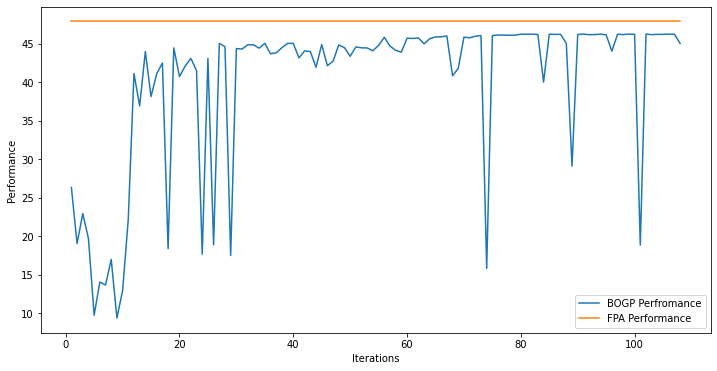

x_next is [  9.99376434   9.99079363   9.95250803   3.74334197   9.99114308
 -30.08915037   9.99973576   9.99403703 -24.50684794   7.05564841
   9.8006387    9.98345501   9.99814414   9.98263632   9.9653852
   8.03257719   9.99032472   9.99161185   8.40411892   9.98194632]
f()=46.249313, actual=46.250
107


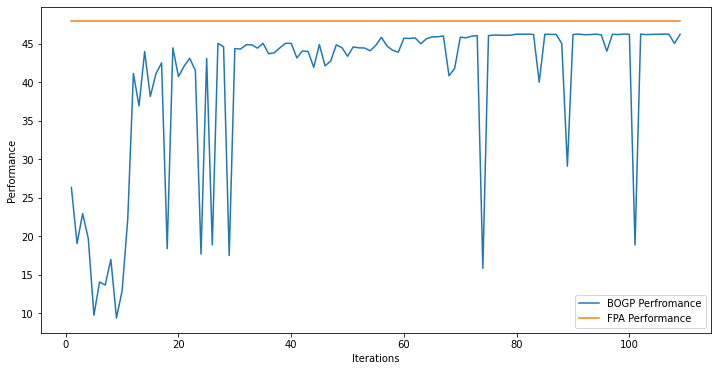

x_next is [ -2.08123417 -27.9879457   -5.75448507 -30.77678508 -30.50861221
 -18.93564641 -27.70090555  -0.54709372   7.45047385   3.72438821
   7.86801367   4.28768961 -30.18691845  -7.85826616  -8.58880347
 -22.57275878 -27.61490617  -4.16491519   5.12896723 -14.72058536]
f()=40.211844, actual=14.177
108


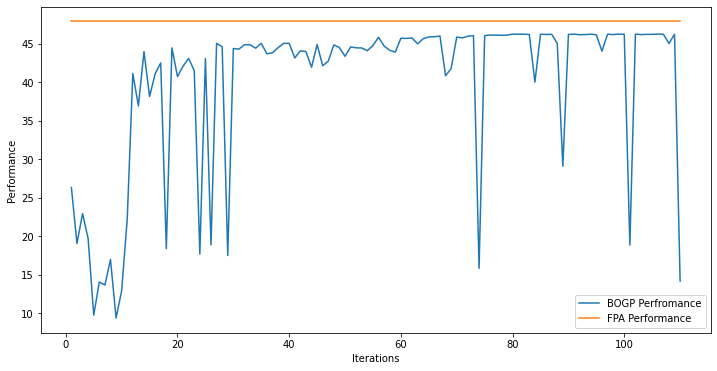

x_next is [  9.976637     9.98999998   9.99507818   3.84807668   9.97755427
 -30.14516107   9.9838685    9.99514662 -24.43172884   6.93737001
   9.88980899   9.92259024   9.99414125   9.98718482   9.9779427
   8.4127697    9.97083534   9.99566905   8.2715128    9.95234991]
f()=46.233016, actual=46.234
109


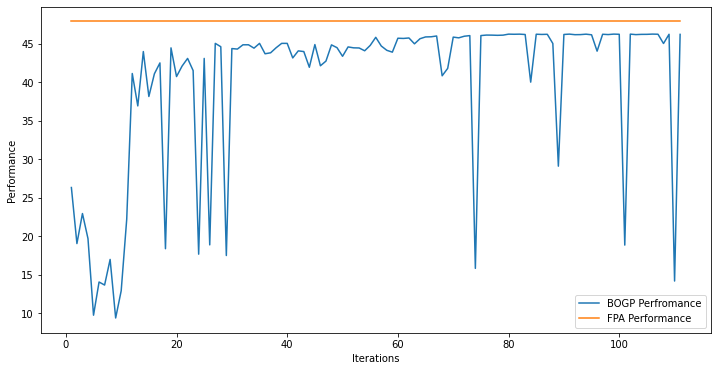

x_next is [  9.99999994   9.99999996   9.99985688   3.74520002   9.99999999
 -30.02093684   9.99999999   9.99999997 -24.33782916   6.97310388
   9.99989425   9.99999997   9.99999997   9.99999993   9.99999997
   8.22509222   9.99999988   9.99999996   8.33118136   9.99999998]
f()=46.272235, actual=46.272
110


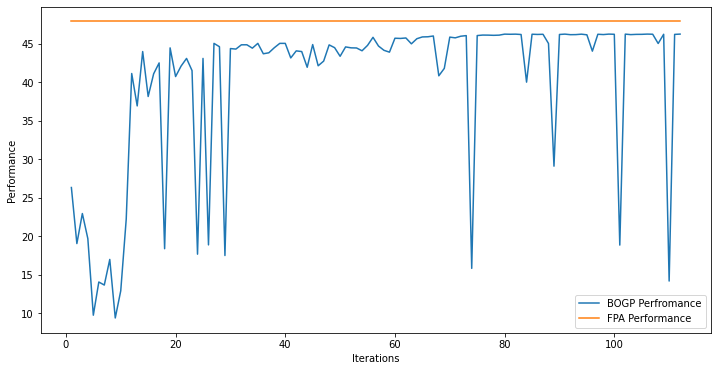

x_next is [  9.99997965   9.95264891   9.997553     4.0649387    9.99094792
 -29.7778015    9.95621494   9.9876028  -24.02510698   6.72461308
   9.91599403   9.96598235   9.99296136   9.96046591   9.99348982
   8.38334755   9.9542623    9.97904967   8.0076056    9.97592278]
f()=46.224769, actual=46.224
111


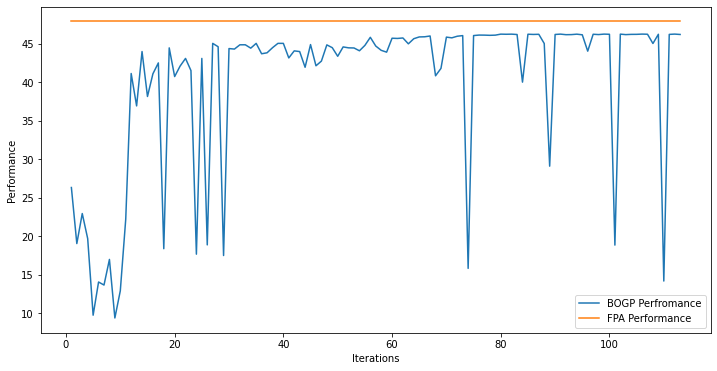

x_next is [ 10.          10.           9.99999979   3.98138292  10.
 -29.90975496  10.          10.         -23.8899133    7.37588573
  10.          10.          10.          10.           9.99444199
   8.30958315  10.           9.97855884   8.09864026  10.        ]
f()=46.260874, actual=46.264
112


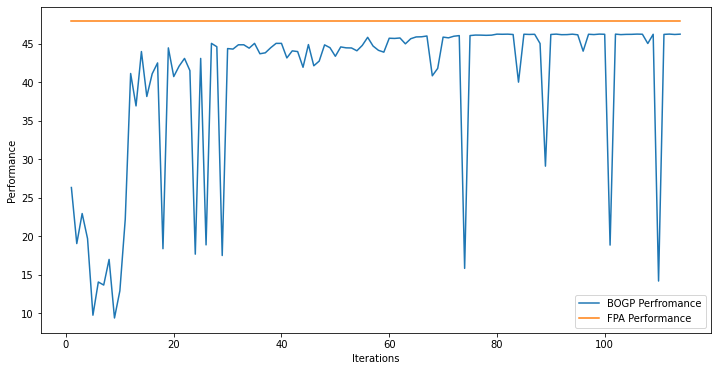

x_next is [  9.99616877   9.98501808   9.93773909   3.79429131   9.98741881
 -30.45131136   9.99377741   9.96854501 -24.3506684    7.08063564
   9.99287091   9.98306268   9.98698426   9.97074      9.99375518
   8.18755901   9.98864681   9.99341225   8.3366303    9.98956958]
f()=46.246260, actual=46.247
113


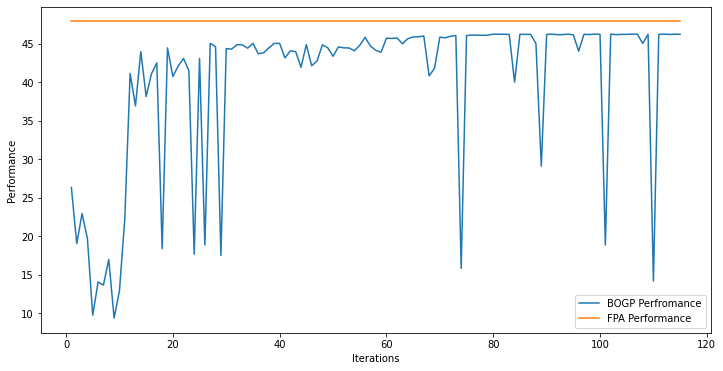

x_next is [  9.98200596   9.99533422   9.97546257   3.7813669    9.98455004
 -29.93416291   9.98923715   9.99103595 -24.5354976    7.09985132
   9.98422486   9.98778944   9.99512738   9.99929763   9.99843541
   8.16439469   9.97978286   9.99476308   8.54917475   9.99425546]
f()=46.253626, actual=46.254
114


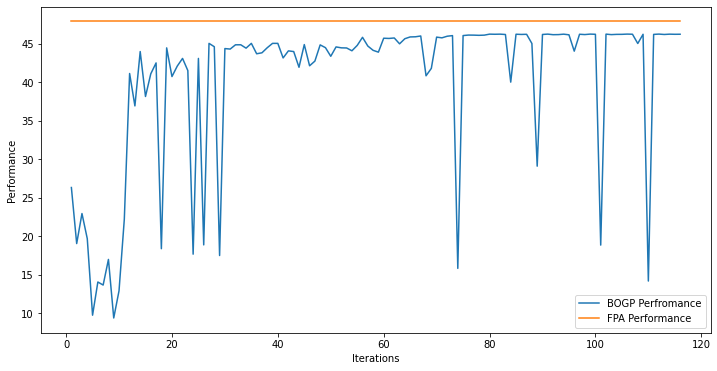

x_next is [  9.99999998   9.99999999   9.98404116   4.07616121   9.99999998
 -30.07365694  10.          10.         -24.44151148   7.16019856
   9.99871044   9.99999996   9.99999999  10.          10.
   8.24319567  10.           9.99999999   8.27706946  10.        ]
f()=46.269907, actual=46.270
115


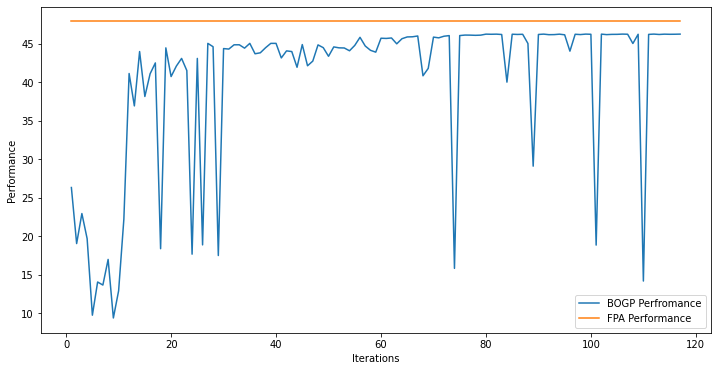

x_next is [  9.99700535   9.99414396   9.98425706   3.8326113    9.99290281
 -29.99504645   9.99076127   9.94182373 -24.41498075   7.00151923
   9.73112363   9.96861355   9.99161653   9.99265398   9.994398
   8.31755061   9.97396811   9.98276838   8.27894199   9.96716805]
f()=46.241262, actual=46.241
116


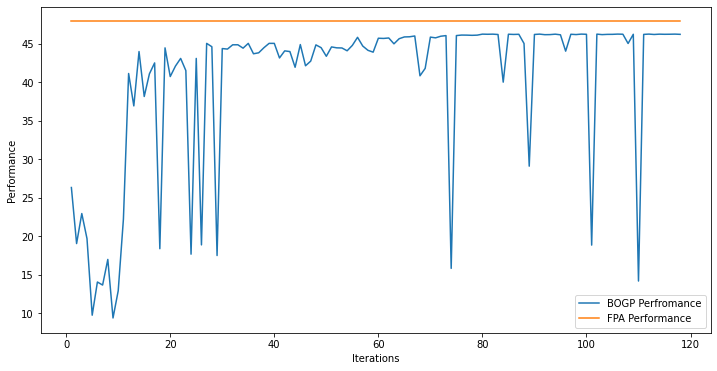

x_next is [  9.99999999   9.99999997   9.99999996   3.80908038   9.99999999
 -30.12171618   9.99999995   9.99999998 -24.33756209   7.12576601
   9.99999984   9.99999995   9.99999997   9.99999993   9.99999994
   8.29375414   9.99999998   9.99999998   8.34825097   9.99999994]
f()=46.273081, actual=46.273
117


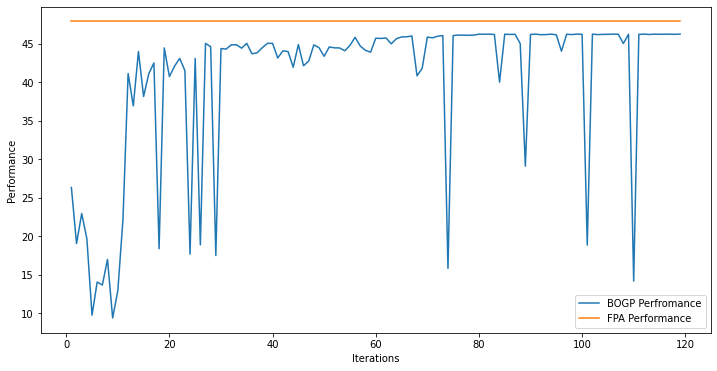

x_next is [  9.99995622   9.99982398   9.999955     9.99973      9.99991916
 -30.99995774   9.99980214   9.99996783 -30.99997359   9.99998917
   9.99985845   9.99997639   9.99979917   9.99998037   9.99959619
   9.99990505   9.99986993   9.99981934   9.99996349   9.9996269 ]
f()=40.450220, actual=45.067
118


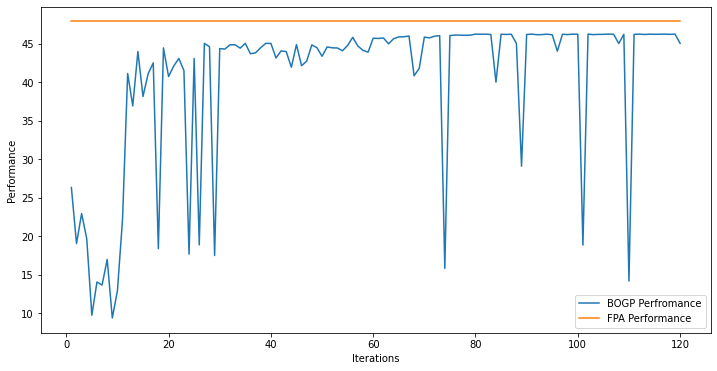

x_next is [  9.99984859   9.986013     9.98507042   4.07769573   9.99649769
 -29.94564305   9.96602308   9.97551914 -23.8576553    6.97450567
   9.95014189   9.98823317   9.98981231   9.97532319   9.9953149
   8.28407202   9.97248684   9.99572577   8.39190244   9.97759583]
f()=46.241932, actual=46.244
119


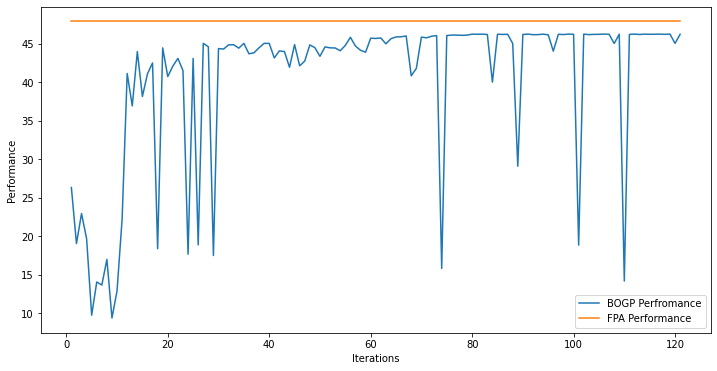

x_next is [  9.99999995   9.99999983   9.99999984   3.84535251   9.99999987
 -29.99393371   9.99999991   9.99999982 -24.26738057   7.05764299
   9.99999976   9.99999992   9.99999996   9.99999986   9.99999987
   8.30532917   9.99999995   9.99988018   8.40479917   9.99999996]
f()=46.272997, actual=46.273
120


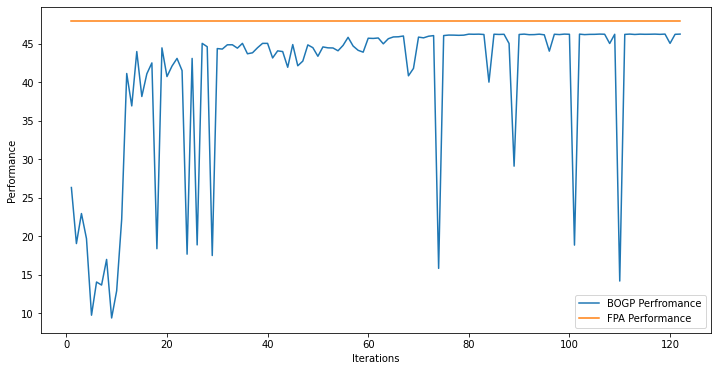

x_next is [  9.98505455   9.98362935   9.96708099   3.81447263   9.98107207
 -30.53915636   9.99587814   9.99797015 -24.29281765   7.09575844
   9.61424626   9.9908827    9.9996358    9.99010435   9.99930862
   8.21028222   9.99743664   9.98800402   8.14095697   9.98240107]
f()=46.251487, actual=46.252
121


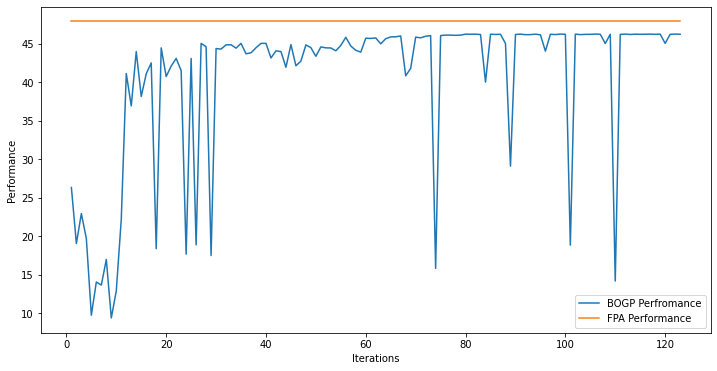

x_next is [  9.98010221   9.99666498   9.99403728   3.61778803   9.99804942
 -30.28256863   9.98889368   9.99683743 -24.63155769   7.13068878
   9.89938074   9.96195143   9.99923291   9.99311779   9.9962062
   8.27396807   9.99360802   9.99135752   8.24885172   9.99668213]
f()=46.256092, actual=46.256
122


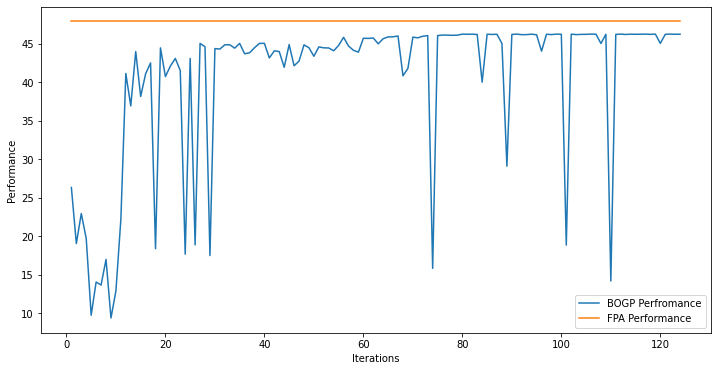

x_next is [  9.99518206   9.98856462   9.97337568   4.05941491   9.99653392
 -30.3853742    9.99128868   9.94308346 -24.04177651   6.85549556
   9.83909344   9.97607278   9.99126418   9.96486874   9.9947589
   8.03242809   9.99584276   9.99373288   8.27115092   9.99292734]
f()=46.243901, actual=46.242
123


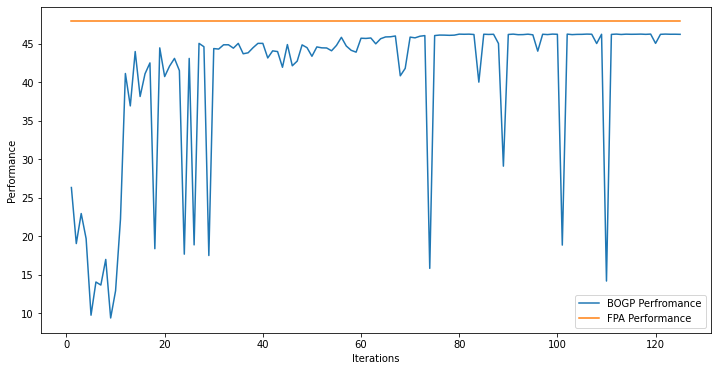

x_next is [  9.99142699   9.99805776   9.99424732   4.00454063   9.99698624
 -30.45624119   9.99635955   9.98400207 -23.53676743   6.8851218
   9.86068504   9.98676225   9.99883075   9.9621561    9.99740576
   8.13112529   9.97824948   9.98996502   7.9726783    9.9955376 ]
f()=46.249169, actual=46.248
124


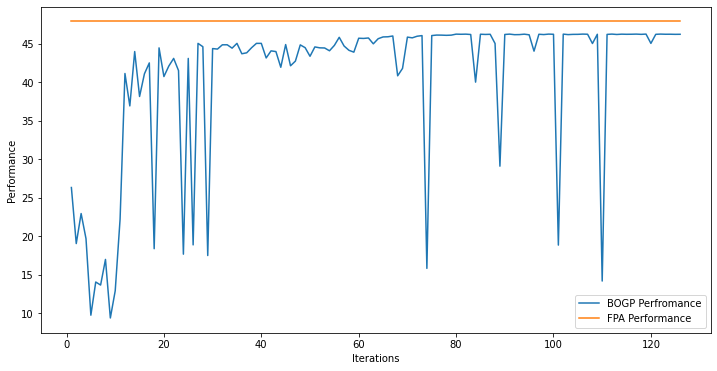

x_next is [  9.99999993   9.99999996   9.99999994   3.81844896   9.99999998
 -30.07432763   9.99999999   9.99999995 -24.33273263   7.0665955
   9.99982751   9.99999996   9.99999997   9.99999992   9.99999996
   8.29789526   9.99999999   9.99999996   8.38731292   9.99999984]
f()=46.272825, actual=46.273
125


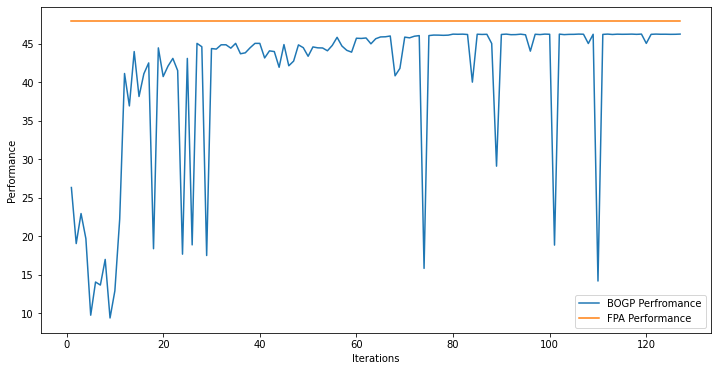

x_next is [ 10.          10.           9.99999998   3.82299974  10.
 -30.04804255  10.          10.         -24.28944366   7.06347067
   9.99799232   9.99999999  10.          10.          10.
   8.30798789  10.          10.           8.37562394  10.        ]
f()=46.272791, actual=46.273
126


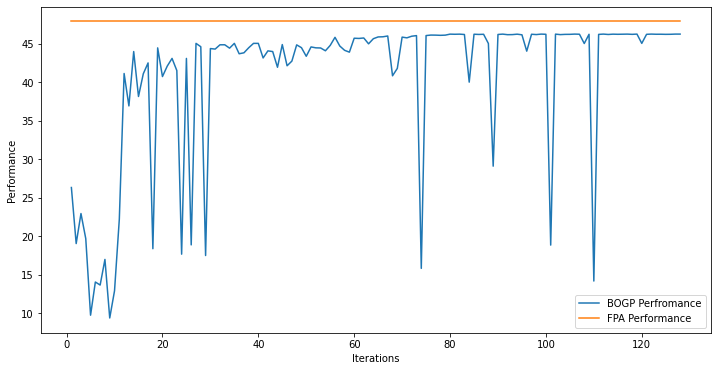

x_next is [  9.9999999    9.99999992   9.99999977   3.82405963   9.99999986
 -30.0604033    9.99999992   9.99999985 -24.27692539   7.07766452
   9.99999987   9.99999989   9.99999992   9.99999995   9.99999996
   8.30538006   9.99999997   9.99999999   8.36164288   9.9999999 ]
f()=46.272820, actual=46.273
127


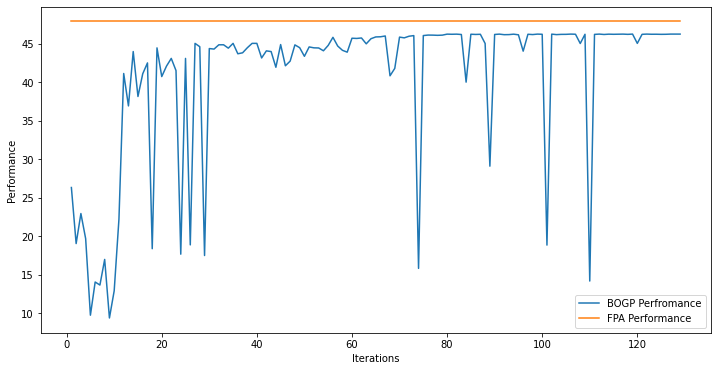

x_next is [  9.99999988   9.99999997   9.99999975   3.83008346   9.99993683
 -30.07748932   9.99999993   9.99999997 -24.25716006   7.08451286
   9.99998477   9.9999999    9.99999996   9.99999992   9.99999997
   8.30531741   9.99999994   9.99999992   8.35485032   9.9999999 ]
f()=46.272822, actual=46.273
128


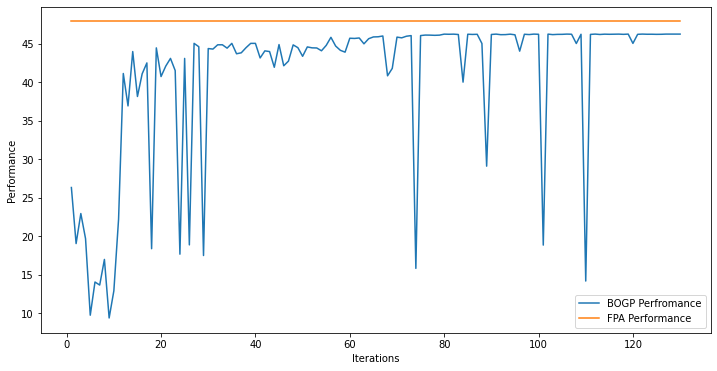

x_next is [  9.95991642   9.98394357   9.98848372   9.98066464   9.99699033
 -30.99816704   9.98855466   9.98920667 -30.98701982   9.99991732
   9.9911934    9.98727849   9.98156342   9.98569684   9.97494425
   9.99815955   9.99654375   9.99946408   9.99421492   9.99567883]
f()=40.934137, actual=45.052
129


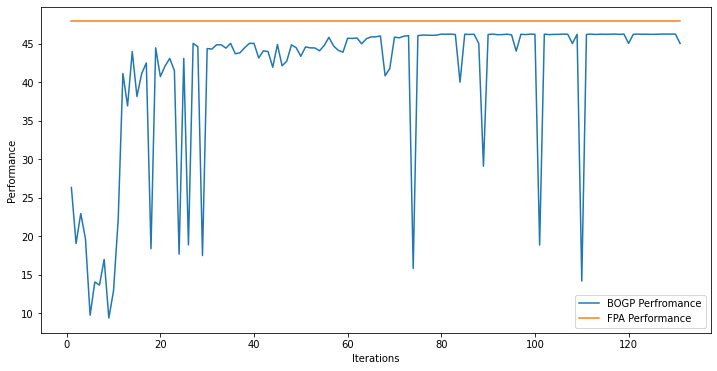

x_next is [ -5.64980637 -23.55578541  -2.74221711 -20.16299424 -26.55904244
  -9.62334109  -9.69740921 -24.2348255  -28.49246908  -0.22803833
 -27.55786243   8.89409632  -6.52025695  -6.05482019  -2.95871558
 -20.80413193  -8.15894722  -4.79337135  -4.04099904  -3.73291552]
f()=40.965707, actual=12.228
130


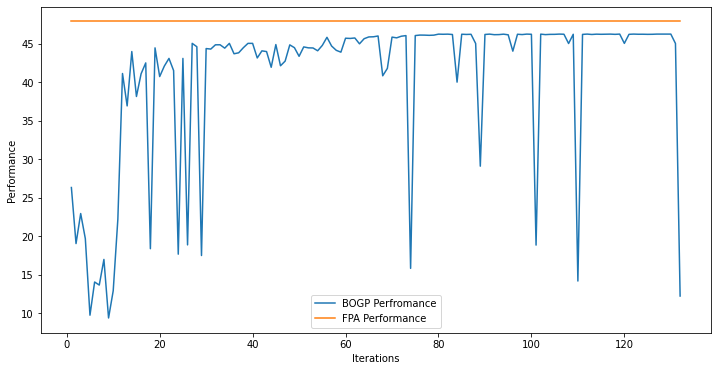

x_next is [  9.99936044   9.99476722   9.98353301   3.7542154    9.99828729
 -30.16234352   9.99596521   9.99302795 -24.29745128   7.11989161
   9.91681377   9.98388403   9.99958933   9.99384871   9.99793495
   8.15489748   9.99764601   9.99765002   8.38877091   9.99251791]
f()=46.264247, actual=46.264
131


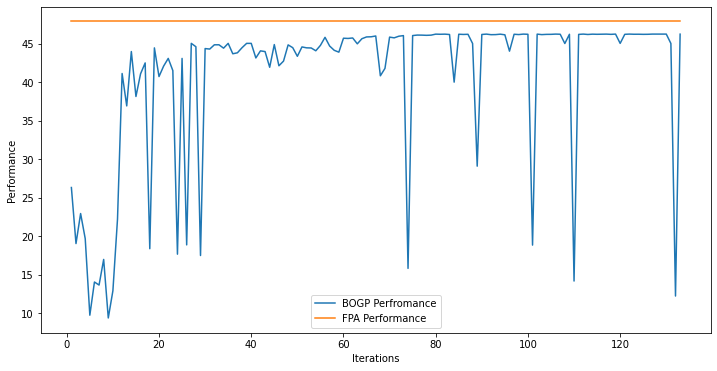

x_next is [  9.99286877   9.95946148   9.99370544   3.93001546   9.99999985
 -30.88192831   9.99999988   9.9999999  -24.44724279   7.02518575
   9.99846388   9.99961751   9.99999991   9.99999991   9.99932175
   8.26272319   9.98913044   9.99999996   8.11962388   9.99999997]
f()=46.259693, actual=46.264
132


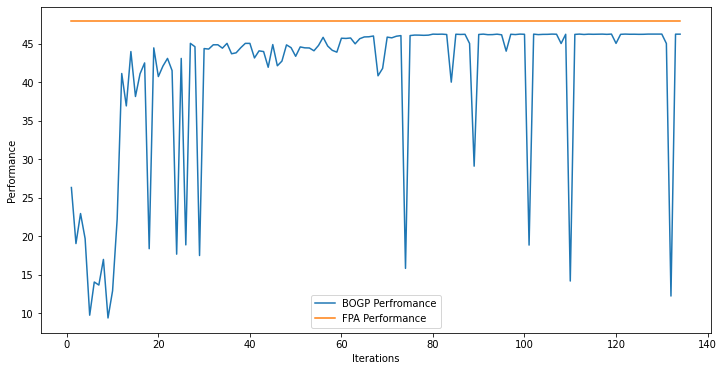

x_next is [ -5.84987782 -21.52706519  -1.68930315  -3.68483674 -22.02364403
   8.11049982   7.95237499  -7.58743709   0.89816057 -14.00370524
  -4.82512326  -5.58610483 -18.18827534  -0.94128958  -5.68939849
  -4.3406181   -0.77606331   8.05805308  -3.29358613   1.43672965]
f()=40.829459, actual=21.780
133


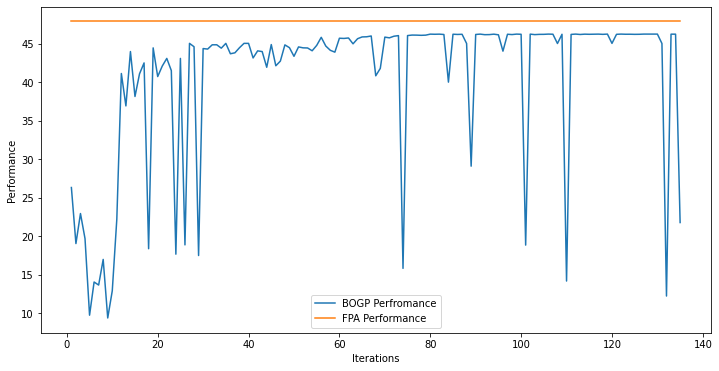

x_next is [  9.99999999   9.99999998   9.99999998   3.74125279   9.99999999
 -30.45604144  10.           9.99999999 -23.81005222   7.06455946
   9.95376124   9.99991141  10.          10.           9.99128858
   8.22342438   9.99999999   9.99999999   7.86805274  10.        ]
f()=46.266602, actual=46.266
134


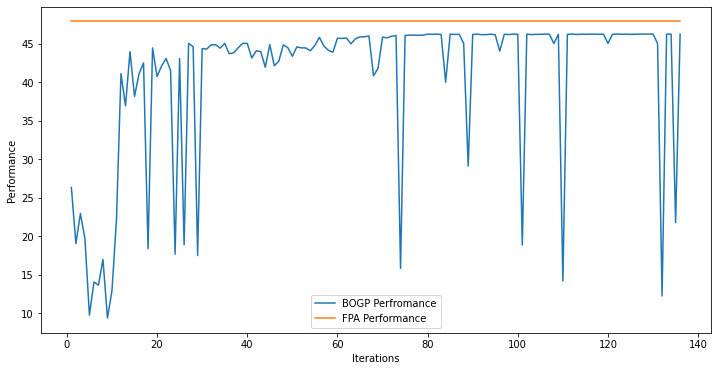

x_next is [-12.19114498 -24.28313644   1.97142557   8.36640298 -27.03148995
 -16.93235411   6.13863492 -30.22752181  -8.06967446   3.05858117
 -25.95392124 -10.01713059 -13.6628149  -24.38712382 -18.62603366
 -21.82589119   7.59071813   0.0369959  -17.40277303   1.28235462]
f()=40.729071, actual=17.906
135


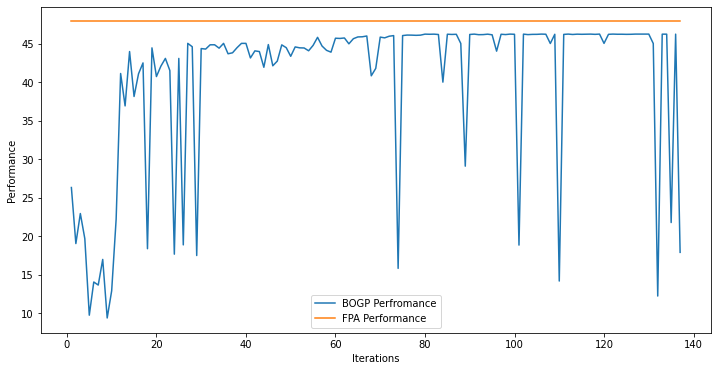

x_next is [-13.85571373   6.40786578   9.21087615   7.56964532   8.46577271
 -23.20215159   2.59424512   6.20810521 -27.97194777   2.04761197
 -14.56474528 -25.926685     8.96542833   9.73297253   8.15936096
  -7.43821144   8.22264486   7.20963102   9.77545859   7.11823922]
f()=40.561854, actual=33.905
136


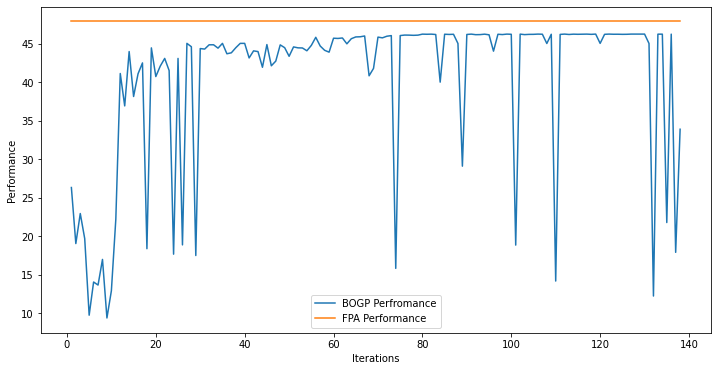

x_next is [  9.99999997   9.99969626   9.99999986   3.84425883   9.99893134
 -30.06314546   9.99999999   9.99971042 -24.10538807   7.08478232
   9.99920491   9.99999998  10.          10.           9.99717711
   8.32425051   9.99999998   9.99999997   8.23950168  10.        ]
f()=46.271881, actual=46.272
137


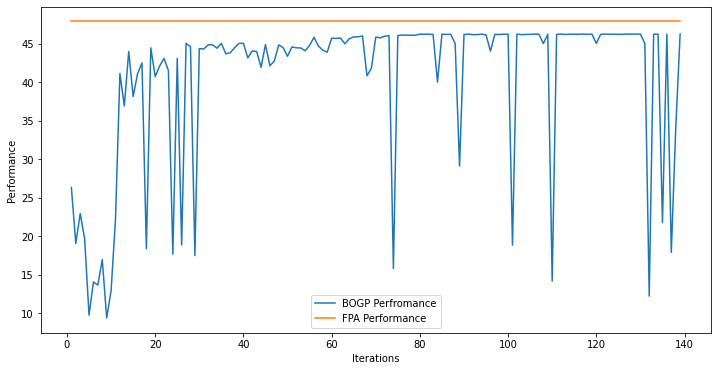

x_next is [  9.9999999    9.9999999    9.99999977   3.84348965   9.99999993
 -29.92433961   9.99999994   9.99999985 -24.21102703   7.06029051
   9.99995341   9.99999994   9.99999993   9.99999992   9.99999991
   8.32378676   9.99999994   9.99999976   8.34887053   9.99999986]
f()=46.272863, actual=46.273
138


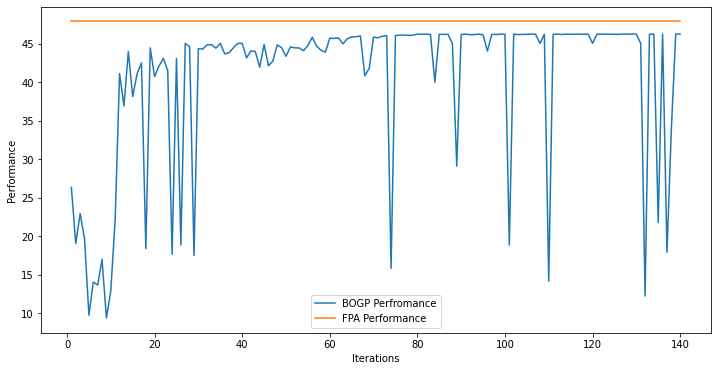

x_next is [  9.98354063   9.99986341   9.98140402   3.83122654   9.99992463
 -30.20643464   9.99888719   9.99863052 -24.27222749   7.11502604
   9.93293614   9.99758634   9.99867468   9.99701551   9.98693446
   8.33572274   9.99894891   9.99632485   8.39883473   9.99892895]
f()=46.265921, actual=46.266
139


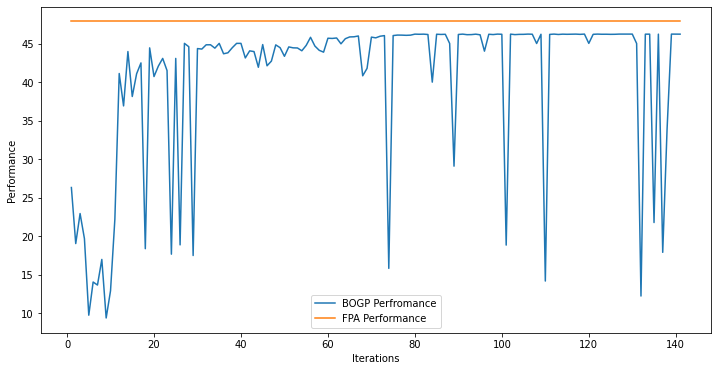

x_next is [  9.99999992   9.99999993   9.9999999    3.83725105   9.99999993
 -29.93471972   9.99999997   9.99999984 -24.24063052   7.06340241
   9.99999993   9.99999998   9.99999998   9.99999993   9.99999994
   8.31561374   9.99999996  10.           8.34578027   9.9999996 ]
f()=46.272866, actual=46.273
140


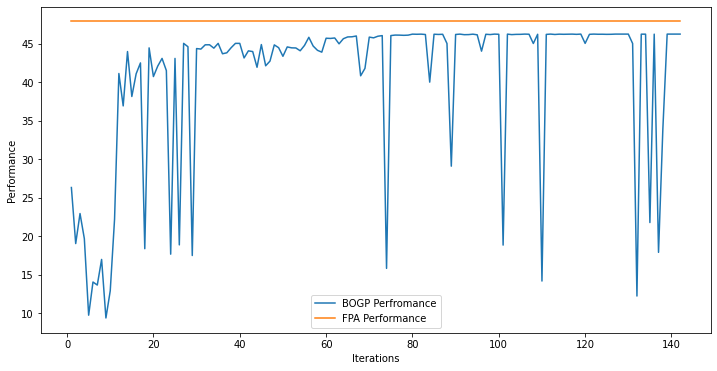

x_next is [  9.99155255   9.98671862   9.9807207    3.74483048   9.99842761
 -30.62398248   9.98525736   9.98624461 -24.38148054   6.94516568
   9.96316098   9.97525922   9.99998463   9.97409243   9.98963293
   8.28305063   9.9972259    9.99053282   8.43193035   9.97776886]
f()=46.251397, actual=46.252
141


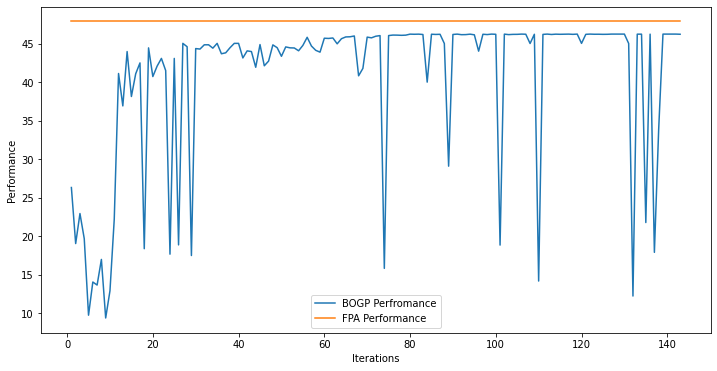

x_next is [  9.99853077   9.99989925   9.99066979   3.99147242   9.99351985
 -30.48525425   9.996929     9.99279536 -24.37555764   7.09796904
   9.98819146   9.99973984   9.98867071   9.9784175    9.99335049
   8.33128981   9.99684041   9.99280611   8.31548232   9.99441847]
f()=46.260755, actual=46.260
142


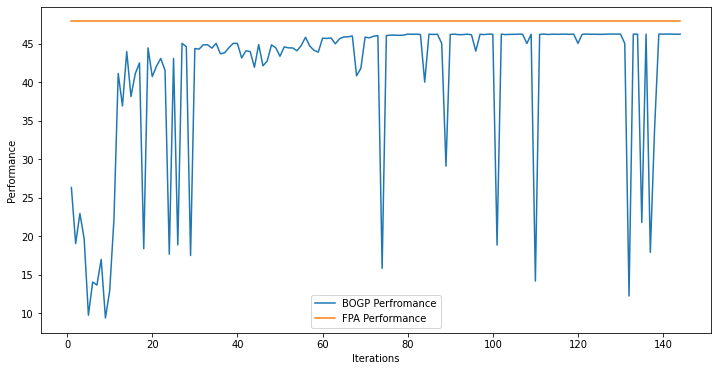

x_next is [ -7.28295443  -9.93956424 -10.88963244  -2.7838651   -3.87296744
 -15.24207041  -7.0062634   -0.53800546  -7.24705932   3.34997112
   3.69244245  -9.11927141 -12.51755804  -9.25015129 -26.12600084
 -25.03840735  -7.44765464  -9.0734047  -11.32080713 -30.80292761]
f()=40.754001, actual=12.514
143


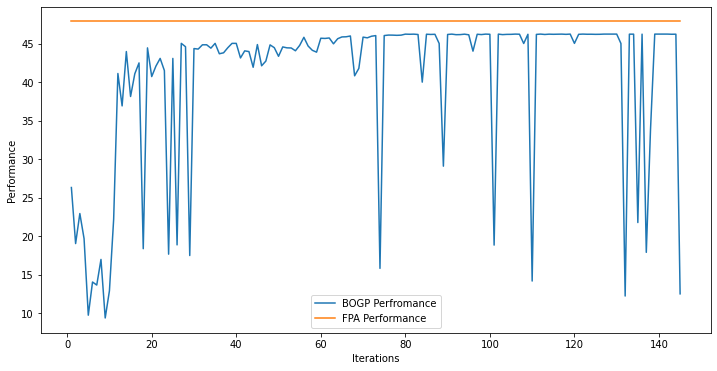

x_next is [  9.99999991   9.99999989   9.99991301   3.84096738   9.99999997
 -29.94960517   9.99999991   9.99999997 -24.23826163   7.06934934
   9.99960922   9.99999992   9.99999995   9.9999998    9.99999988
   8.31754052   9.99999993   9.99999995   8.34205537   9.99998553]
f()=46.272859, actual=46.273
144


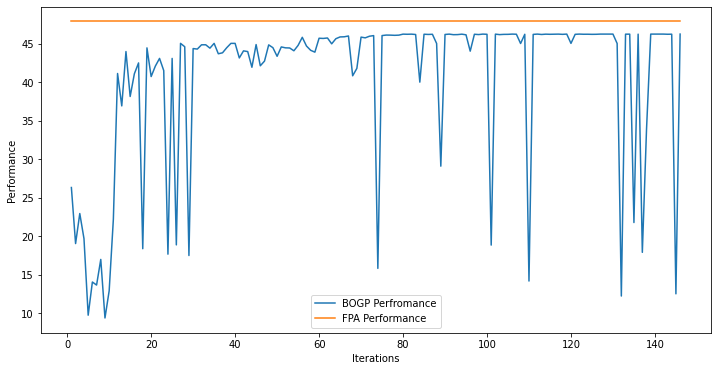

x_next is [ -0.33231162 -15.93662251 -20.90456107 -14.85658654 -15.40425081
 -19.62784293 -30.87634788  -8.42635659   4.60566318   4.79580747
   0.1621115   -2.41700077 -14.6991334  -25.33711785  -5.63062061
  -2.83487433  -4.72746167  -6.56933538 -19.13951189   2.5798389 ]
f()=40.597592, actual=14.840
145


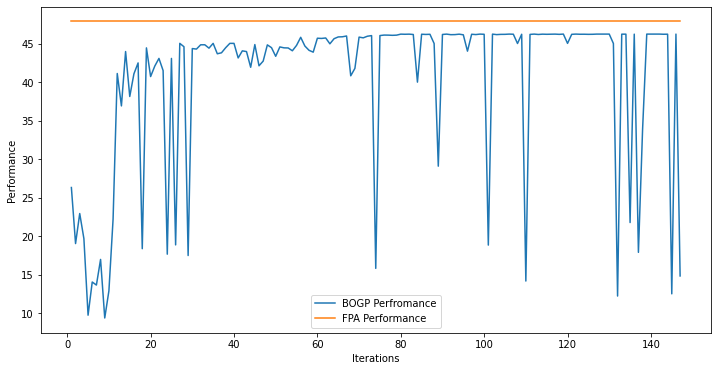

x_next is [  9.97431841   9.9935467    9.99997232   3.71078698  10.
 -30.40983012  10.          10.         -24.17587578   7.1324174
   9.93362651   9.99364656  10.           9.99242731   9.99846084
   8.15914322   9.99826519  10.           8.04995612   9.99430515]
f()=46.262891, actual=46.263
146


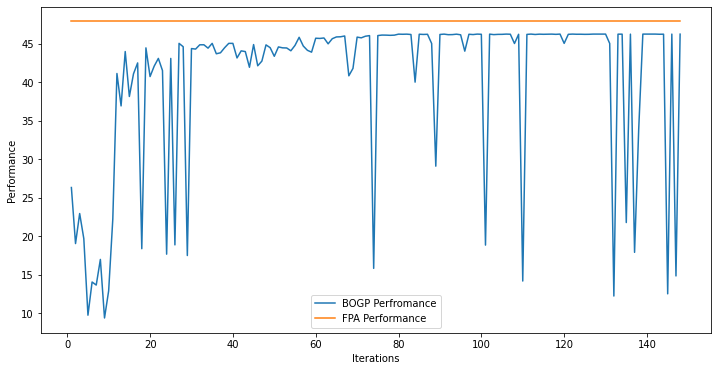

x_next is [  9.99966951   9.9956367    9.99999997   3.83540625   9.99999999
 -29.88926693   9.99999999   9.99613842 -24.19319088   7.04742933
   9.99999985   9.99999995   9.99610407   9.99937623   9.99081952
   8.30859303   9.99852065   9.99855567   8.35668521   9.99948245]
f()=46.269296, actual=46.269
147


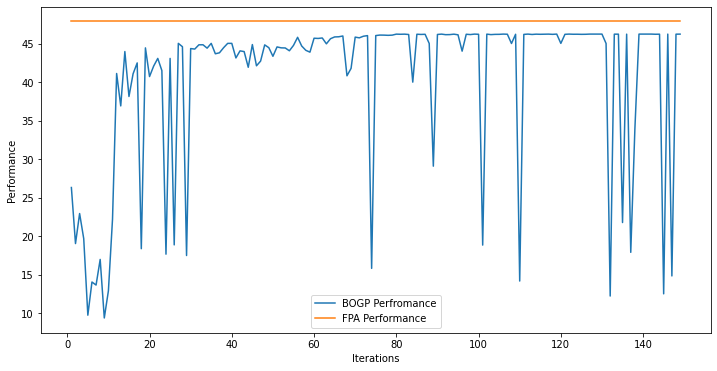

x_next is [  9.45349857 -30.95350216 -30.39001002   9.76503468   8.49186152
 -30.22382714   9.85669431   8.8679225  -29.37315316   9.64062751
 -29.69255952 -29.57243397   9.96293519   8.98924488   7.26382687
   9.06205967   9.84021484   9.70896137   9.35329066   7.98102278]
f()=41.021769, actual=42.244
148


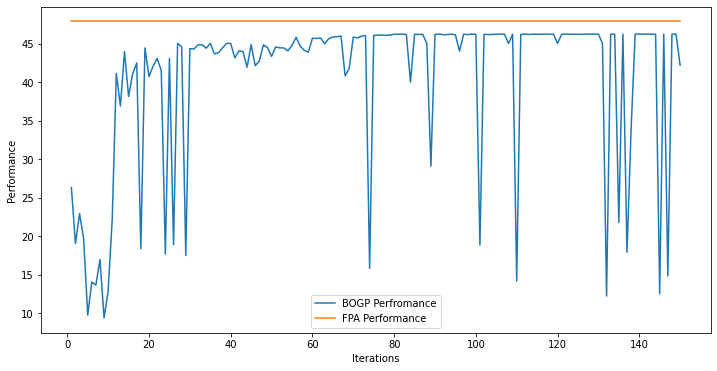

x_next is [  9.9999999    9.99999996   9.99999994   3.82925281   9.99999993
 -29.82324619   9.99999987   9.99999997 -24.20496584   7.03982456
   9.99999993   9.99999995   9.99999996   9.99999997   9.99939668
   8.29483244   9.99999989   9.99999995   8.36579862   9.99999991]
f()=46.272866, actual=46.273
149


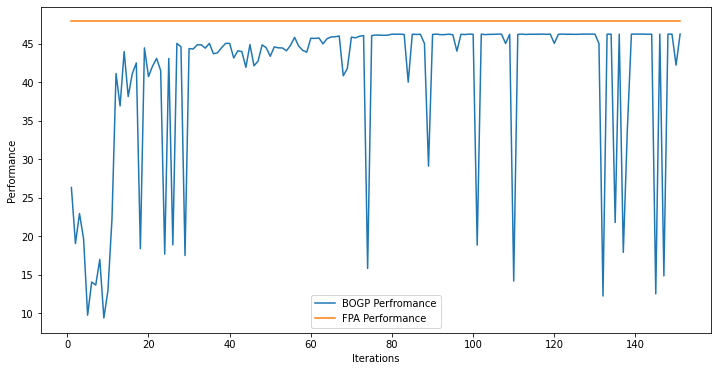

x_next is [  9.99765733   9.9945974    9.99599815   3.83370012   9.99786145
 -30.80786139   9.98644047   9.99804159 -24.39795158   7.02920703
   9.93709436   9.99431885   9.99958092   9.99491749   9.99965211
   8.21850935   9.9998091    9.99489921   8.2368805    9.99916814]
f()=46.265598, actual=46.265
150


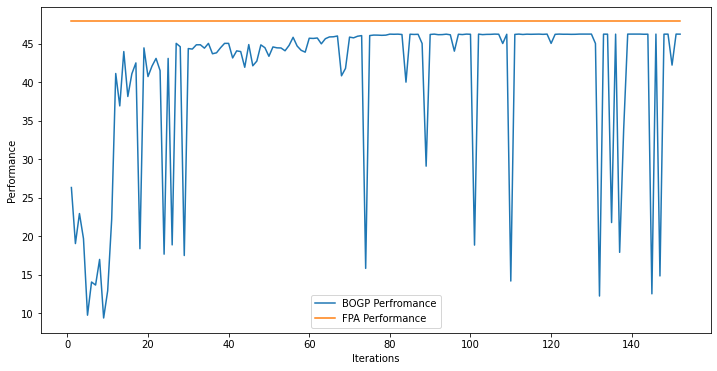

x_next is [  9.99434801   9.99795354   9.99732637   3.73029935   9.99785467
 -29.82363641   9.98899408   9.99739002 -24.31393202   6.96420567
   9.94717937   9.99301628   9.99759116   9.99677343   9.99508833
   8.42163203   9.99784307   9.99738459   8.48228804   9.99968405]
f()=46.264964, actual=46.264
151


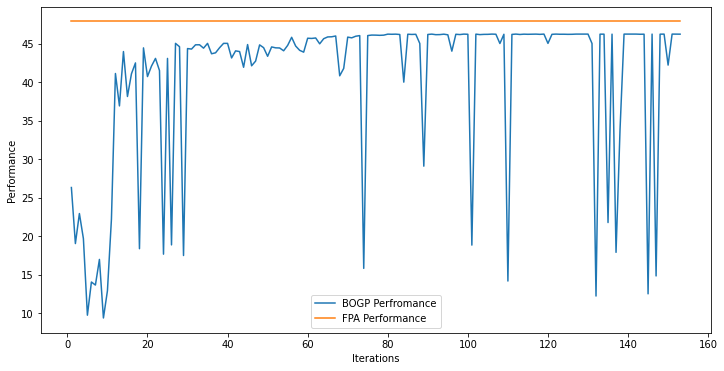

x_next is [  9.99908308   9.99066232   9.99100064   3.8650376    9.99729979
 -30.27964106   9.99944135   9.99009097 -24.13923691   7.08946738
   9.96791216   9.99866121   9.99900443   9.99643424   9.99866569
   8.22410518   9.99034282   9.99940226   8.38410478   9.99802065]
f()=46.265746, actual=46.266
152


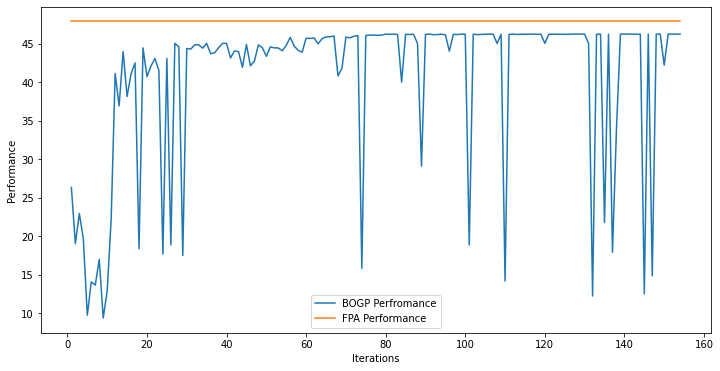

x_next is [  9.9907057    9.99822501   9.99727965   3.8935141    9.99801706
 -30.00818138   9.98953516   9.99955678 -24.02352886   7.04367709
   9.89714715   9.98476802   9.99334103   9.99400709   9.99252235
   8.3326204    9.98852559   9.99735928   8.25323578   9.99310994]
f()=46.260354, actual=46.260
153


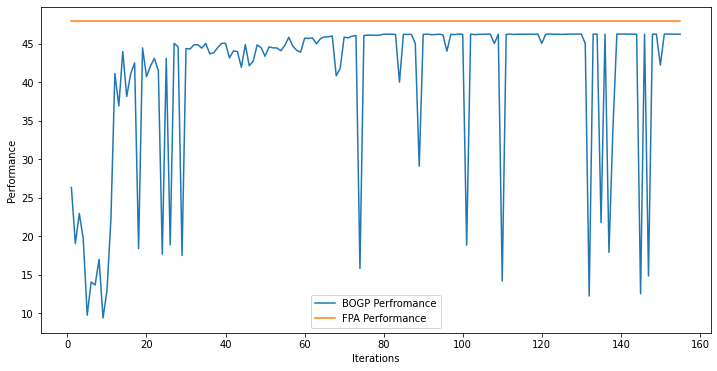

x_next is [  9.99903529   9.99238738   9.99580148   9.9987091    9.99910337
 -30.99982779   9.9970097    9.99905583   9.99960335   9.99983608
 -24.10648897   9.99682725   9.9994103    9.98978566   9.99414808
   9.99868655   9.99124409   9.99868469   9.99550819   9.99981293]
f()=45.289606, actual=45.247
154


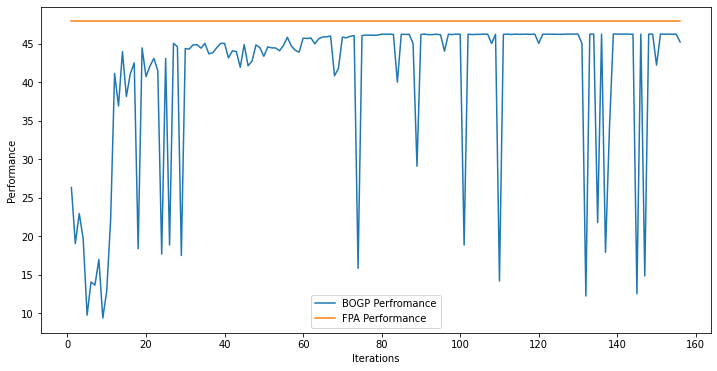

x_next is [  9.99909416   9.99912176   9.99982126   9.99985604   9.99996441
 -30.9981174    9.99958427   9.99840721 -30.9983018    9.99989037
   9.99996134   9.99859557   9.99993566   9.99909764   9.99995933
   9.99958326   9.99992185   9.99920056   9.99963595   9.99967351]
f()=40.727408, actual=45.066
155


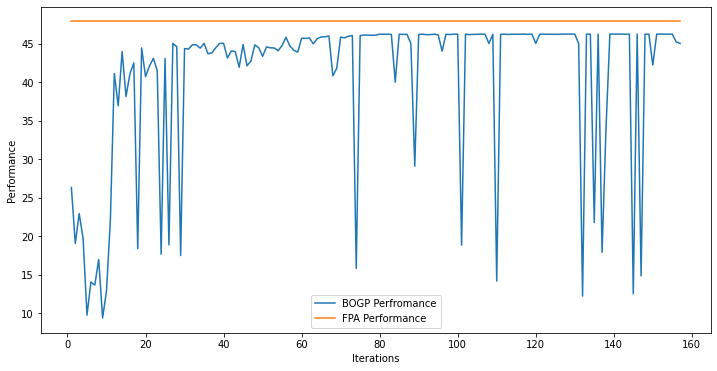

x_next is [  9.99885873   9.99049961  -0.84516369   9.99472592   9.99964065
 -30.99624712   9.99987676   9.9971822   -0.6883818    9.99959235
 -14.04111702   9.9919659    9.99757799   9.99056565   9.99563963
   9.99575893   9.99746266   9.99940649   9.99664678   9.99856935]
f()=46.014097, actual=44.877
156


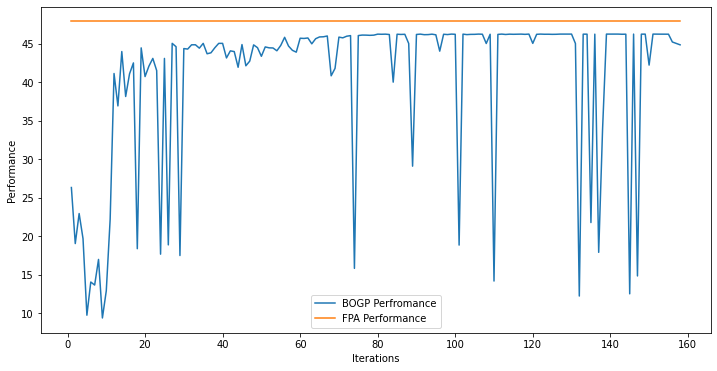

x_next is [-17.68137632 -17.82479751  -4.27012281 -30.86149864  -4.63201272
 -16.70951618  -2.00243745 -26.27040414 -27.49494989   0.04834299
   0.74221885 -14.03708885  -0.87945329  -4.78515062 -23.13144997
 -26.30365501   2.85473254  -8.4049888  -12.66767294 -10.26539292]
f()=40.781328, actual=8.821
157


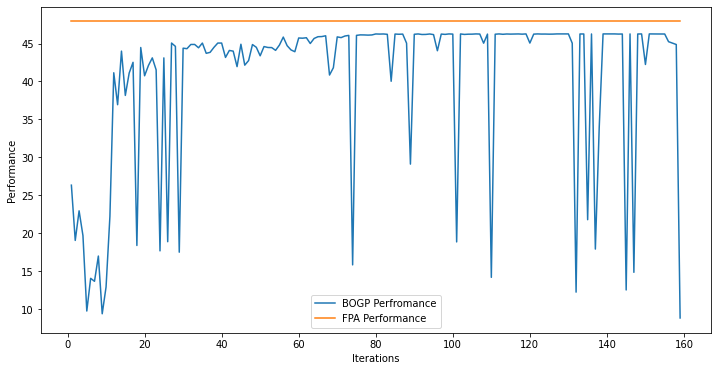

x_next is [  9.99776503   9.99785222   9.99350681   3.83664726   9.99284114
 -29.66623606   9.99524142   9.99346682 -24.16005988   7.0594728
   9.9509014    9.99626497   9.99492769   9.98642697   9.99416111
   8.24707434   9.99837979   9.99839702   8.30423383   9.9967711 ]
f()=46.263769, actual=46.264
158


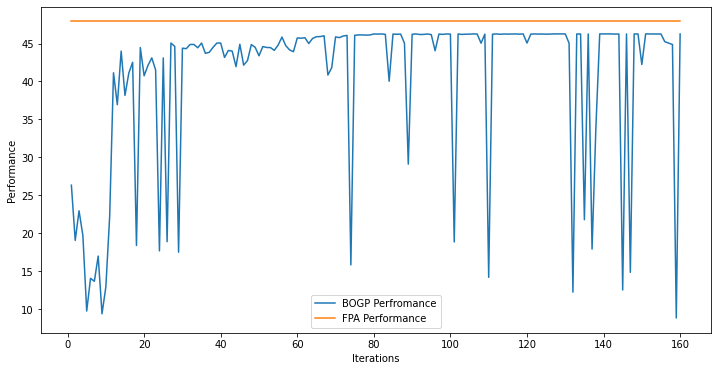

x_next is [  9.99904088   9.98721034   9.98288081   3.81681165   9.99943474
 -29.85541586   9.99560979   9.99150569 -24.1838194    7.16378091
   9.9999661    9.99511984   9.99661008   9.98566178   9.99395985
   8.19261026   9.99605909   9.99598015   8.27470512   9.99906689]
f()=46.263023, actual=46.263
159


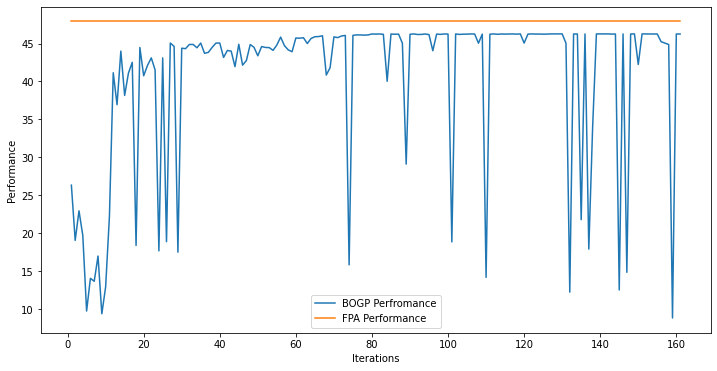

x_next is [  9.99391958   9.9978145    9.9747783    3.82187866   9.99997346
 -30.20702708   9.9986422    9.98789579 -24.5970311    6.89714675
   9.89108394   9.9991286    9.99936642   9.97981555   9.9928432
   8.28967696   9.99387497   9.99538304   8.3511521    9.99833178]
f()=46.262157, actual=46.262
160


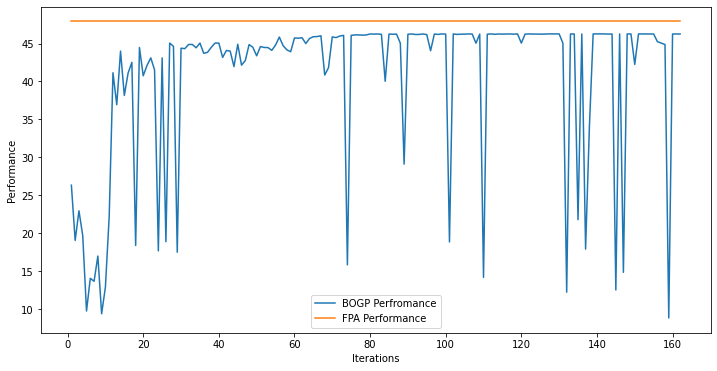

x_next is [  9.99918909   9.99920246   9.9997276    9.99828323   9.99943491
 -30.99889924   9.99950151   9.99964597   4.76587679   9.9983415
 -16.51215296   9.99985556   9.99956304   9.99786895   9.99923894
   9.99998049   9.99976945   9.99926202   9.99907476   9.99962327]
f()=45.488941, actual=45.101
161


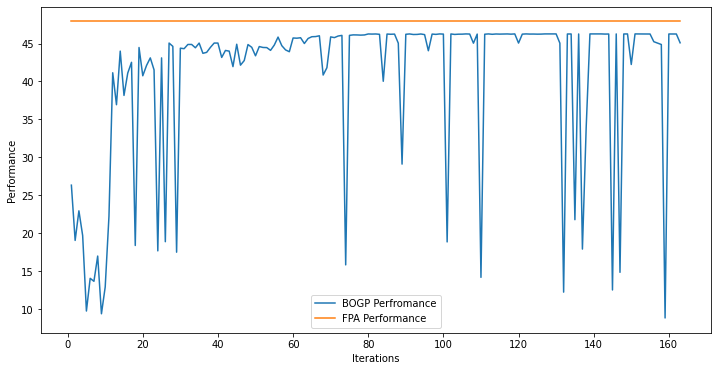

x_next is [  9.99999978   9.99999986   9.99999982   3.84766956   9.99999974
 -29.87511547   9.99999991   9.99999992 -24.22266186   7.05340557
   9.99985234   9.99999988   9.99999988   9.99999984   9.99999984
   8.29443476   9.99999989   9.99999989   8.34825326   9.99999988]
f()=46.272895, actual=46.273
162


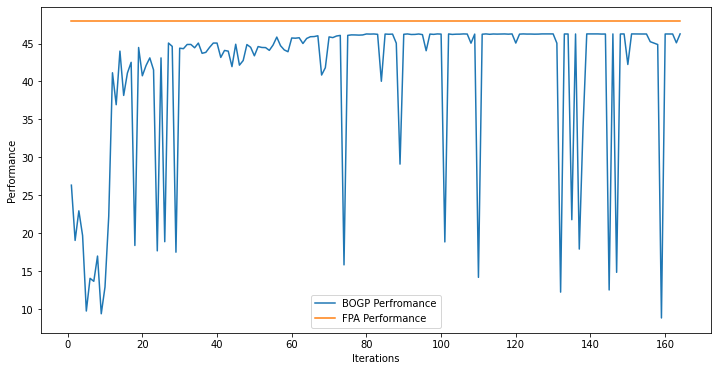

x_next is [  9.99580996   9.99334563   9.9994468    3.90472096   9.99658829
 -30.05539487   9.9994279    9.99493573 -24.12011391   7.14660315
   9.97296603   9.99887805   9.99831224   9.99705417   9.99920726
   8.3383093    9.9994556    9.99726564   8.30139761   9.99193588]
f()=46.267156, actual=46.267
163


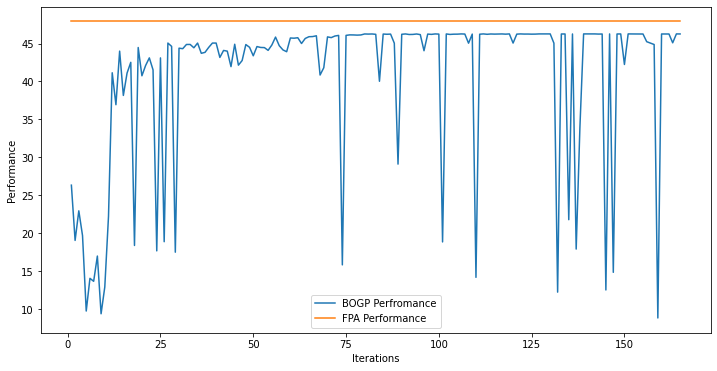

x_next is [  9.99999992   9.99995497   9.99974377   3.87026627   9.99945184
 -30.03849483   9.99999983   9.99993891 -24.15119127   7.11779279
   9.99956426   9.99926464   9.99974878   9.99999997   9.99925449
   8.3310021    9.9996437    9.99997923   8.33945645   9.9999095 ]
f()=46.272465, actual=46.272
164


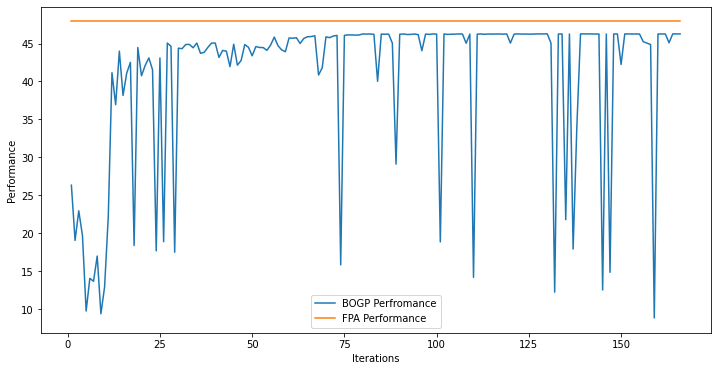

x_next is [  1.38292394 -20.66596212  -5.09893952 -16.12526383 -10.70374756
 -15.24990916 -25.15911662  -5.89014564  -5.37199388 -28.71877963
 -14.64236621 -15.47942545 -11.71613921 -20.00708579  -1.94153799
 -12.62442322 -14.09763061 -17.9630943   -7.8698788   -7.61559389]
f()=15.246837, actual=7.417
165


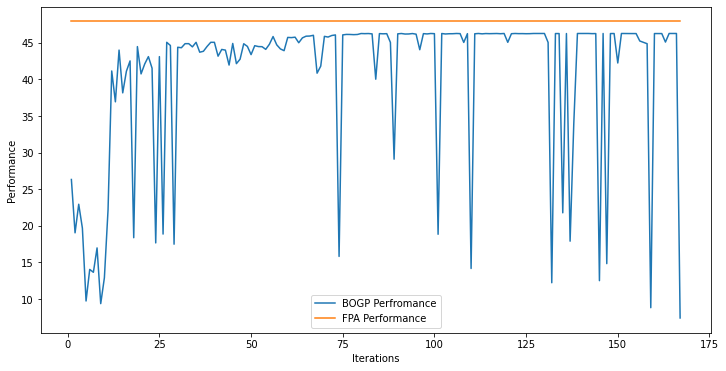

x_next is [  9.68237239   9.99216623   9.64899905   9.47334579   9.94687237
 -30.73969804   9.92375258   9.45334783 -29.79796345   9.36713567
   9.61511317   9.92971452   9.76273232   9.62727211   9.64562753
   9.87848846   9.48024844   9.07006616   9.7036136    9.79066244]
f()=40.611832, actual=44.697
166


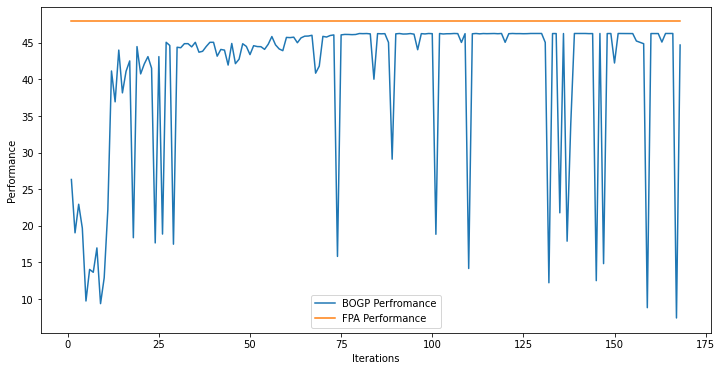

x_next is [  2.54783875   6.36546112 -14.39866468  -2.70385335   6.31905225
 -20.94421391   6.14766532   4.48967775 -26.56437664   8.21243962
  -2.67684024   2.04327209  -9.50796037   3.18433472  -2.20463353
   0.92518293   9.09162607   0.49264701  -0.34117883   1.71519432]
f()=40.636246, actual=31.663
167


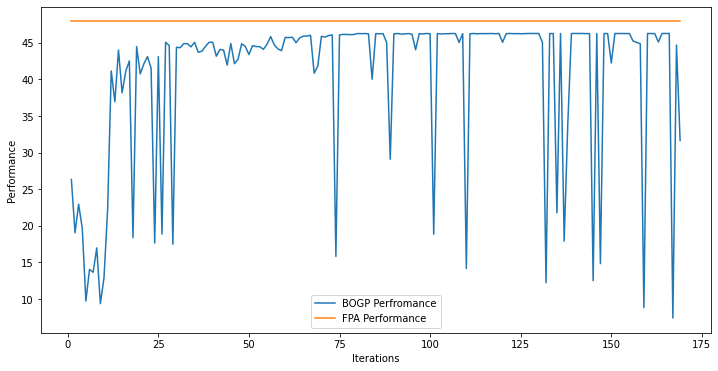

x_next is [  9.98322635   9.25194789  -3.80102524   3.54699762   7.9038088
 -28.19360457   6.7794268    9.60251737 -25.83569615   0.14822925
  -1.07824391   7.95241628   8.61339648   7.60617298   5.68889116
   7.16394084   9.31458095   5.44298593   4.0593423    8.58363434]
f()=41.009928, actual=41.116
168


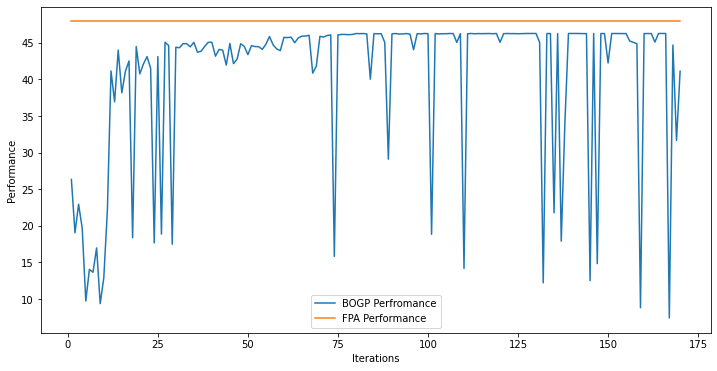

x_next is [  9.99779855   9.9999994    9.99861255   3.94028004   9.97050214
 -30.2428677    9.99999932   9.99999949 -24.16358323   6.97704616
   9.95136864   9.99999945   9.99539201   9.99999931   9.9999993
   8.29726873   9.99793769   9.99999944   8.58626227   9.99999941]
f()=46.263618, actual=46.264
169


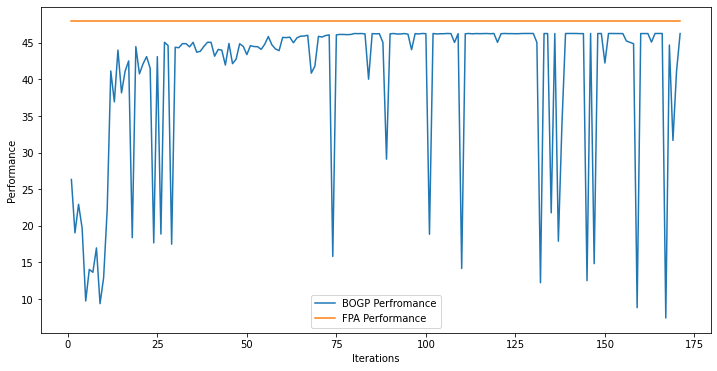

x_next is [  9.99999999   8.96018418 -20.12288794   9.99999996  10.
 -30.99999991   9.99988995   9.99999999   2.39078889   9.99999999
   9.93163126   9.99999999  10.           7.75416066   9.99999999
   9.99999999   9.99999994   9.99999999   9.99999997   9.99999999]
f()=45.515851, actual=44.616
170


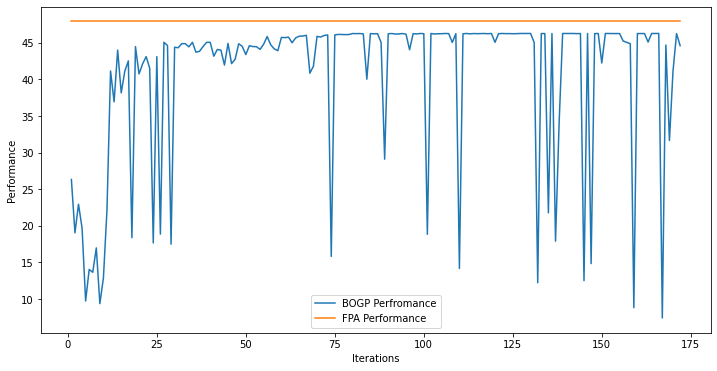

x_next is [  9.99774011   9.99743411   9.98483807   3.79968254   9.9997964
 -29.81987032   9.99586813   9.99783467 -24.21209184   6.96676576
   9.99592379   9.99825692   9.99994741   9.99988072   9.99746204
   8.21739996   9.99960001   9.9965762    8.34960816   9.99979135]
f()=46.269045, actual=46.269
171


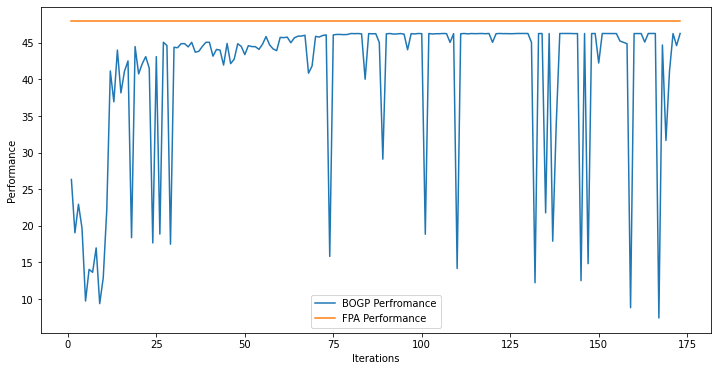

x_next is [  9.99999802   9.99998713   9.99998376   3.84236275   9.99998712
 -29.80562738   9.99994839   9.99773012 -24.20567181   7.06594687
   9.99997296   9.99994578   9.99997178   9.99988653   9.99999885
   8.3147416    9.99995788   9.99996569   8.36128118   9.99995266]
f()=46.272575, actual=46.273
172


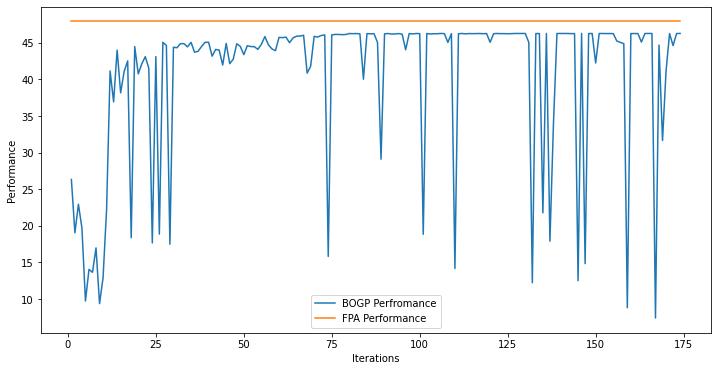

x_next is [  9.99903047   9.99788457   9.99829759   3.78567746   9.99453649
 -30.17531352   9.99613066   9.99842376 -24.22930576   7.11478265
   9.9248825    9.99493405   9.99780651   9.99999636   9.99538052
   8.33126805   9.99793193   9.99648654   8.32849518   9.99889755]
f()=46.267257, actual=46.267
173


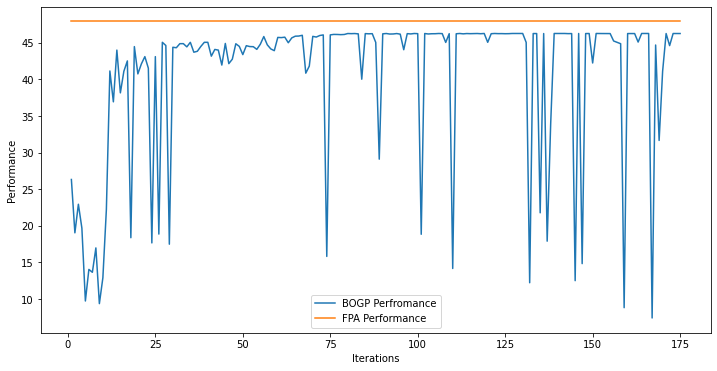

x_next is [  9.99999961   9.99999978   9.99992239   3.84607673   9.99999969
 -29.79341135   9.99999984   9.99999989 -24.19950644   7.06535602
   9.99995331   9.99999989   9.99999996   9.99999982   9.99999984
   8.31875442   9.99999989   9.99999996   8.35762289   9.99999994]
f()=46.272905, actual=46.273
174


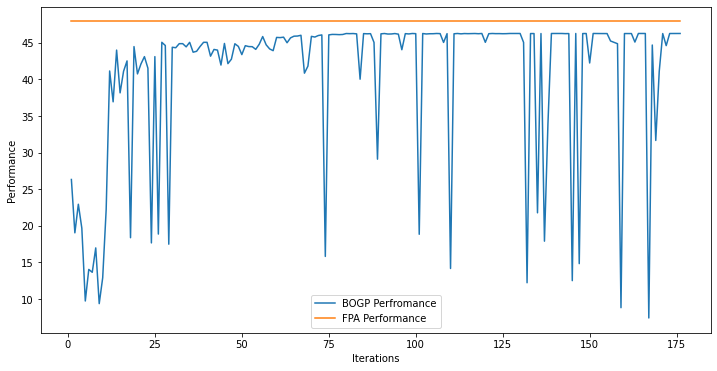

x_next is [  9.99948291   9.99919925   9.99623362   3.90940824   9.99878219
 -30.55357311   9.99941338   9.99336346 -24.13034269   7.15114346
   9.98646088   9.9963035    9.99579809   9.99738915   9.99582179
   8.33873271   9.99949865   9.99844734   8.43367036   9.99921974]
f()=46.267794, actual=46.268
175


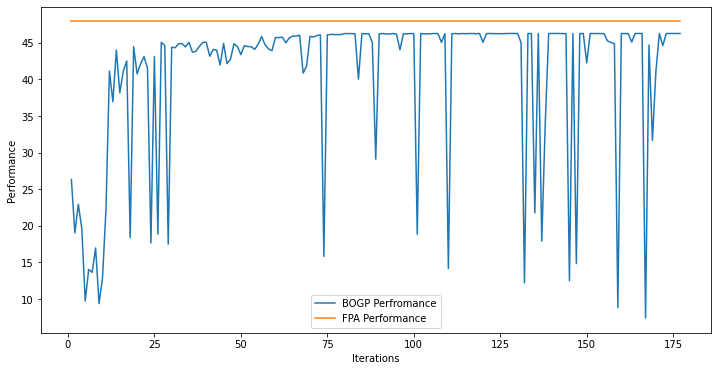

x_next is [  9.99999978   9.99997704   9.99999945   3.87433252   9.99999984
 -29.80636656   9.99999996   9.99999935 -24.20514516   7.0666374
   9.99999991   9.99999996   9.99999992   9.99999989   9.99999976
   8.31809757   9.99991789   9.99981405   8.3574013    9.99985749]
f()=46.272807, actual=46.273
176


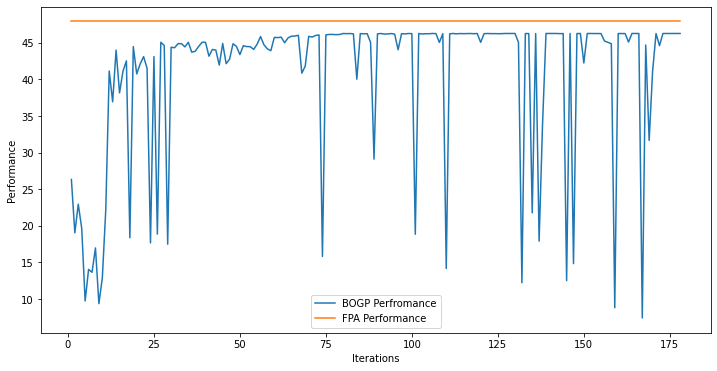

x_next is [  9.99890216   9.99838163   9.99851646   3.83502919   9.99883515
 -30.02870342   9.99769477   9.99539515 -24.32011223   7.13280945
   9.98271142   9.99539507   9.99754103   9.99845984   9.9953643
   8.33969609   9.99992795   9.99856323   8.32824551   9.99790192]
f()=46.268822, actual=46.269
177


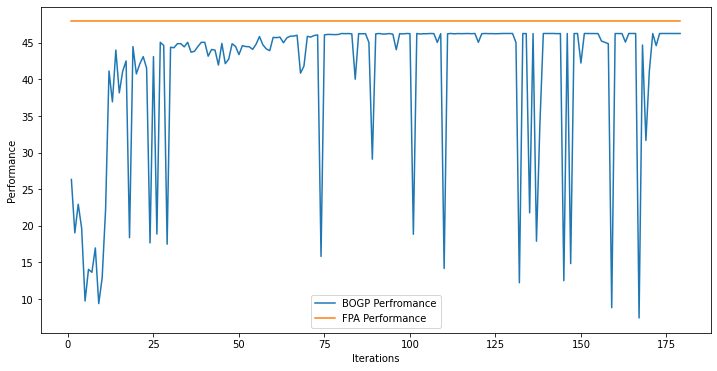

x_next is [ -9.07099011   5.3774247    4.98473959 -22.22346177   8.99817656
 -26.18277036 -30.98040018 -25.4105365   -2.62565879  -8.93870497
  -2.16310003 -21.14056102  -1.54238658   6.42340433 -25.99984
 -28.65812978 -10.33235292 -25.89803377 -12.42088853 -27.58107003]
f()=40.863570, actual=8.305
178


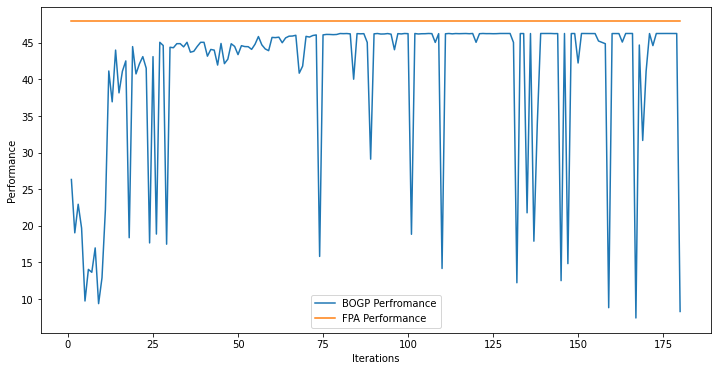

x_next is [  8.07372431 -22.37363758  -4.15109729   9.80041171   8.81940536
 -31.           8.87803106   7.82282579 -25.30218483   7.98654634
   2.64839963  -7.82253813   6.09156276   5.42846836   7.4155849
   8.34854688  10.          10.           9.83555439  10.        ]
f()=49.433982, actual=41.069
179


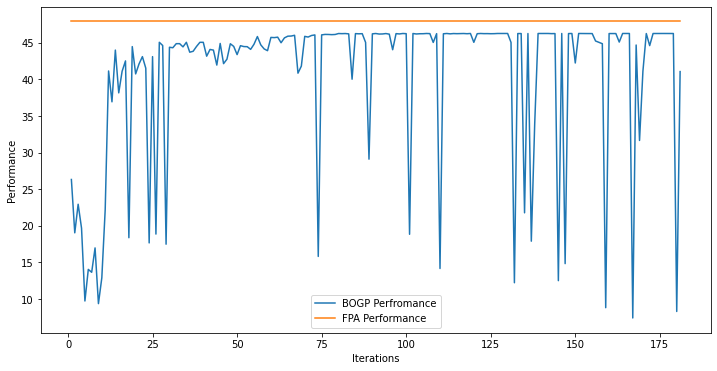

x_next is [-18.39329563  -8.9936095   -1.54453601 -30.87238007   7.71156546
 -30.24324223   8.84938796  -5.57307799 -30.5008358    3.03191378
 -17.08279372   6.71099911 -26.76472827   2.6301465  -13.60697901
  -0.49730395  -1.49240071 -16.02437573 -28.91905002 -11.03694774]
f()=40.684125, actual=16.629
180


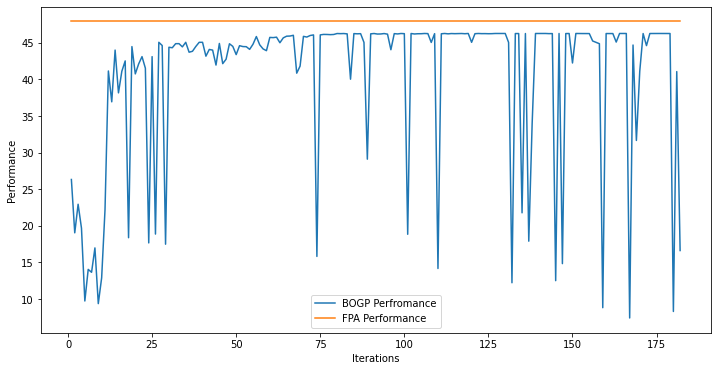

x_next is [  9.99999999   9.98895557   9.98697589   3.83359679   9.999999
 -29.76755895   9.99100362   9.99581351 -24.31220353   7.10567368
   9.99681515   9.99999998   9.99999998   9.99254779   9.99999985
   8.28603132   9.99715563   9.99999998   8.3910818    9.99999997]
f()=46.267587, actual=46.268
181


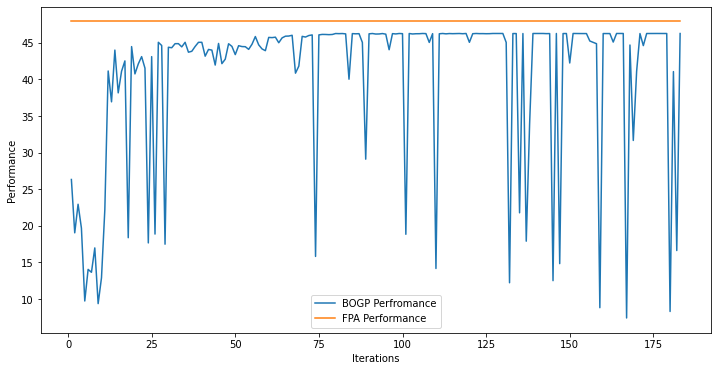

x_next is [  9.99816356   9.99679871   9.99721828   3.95906081   9.99985146
 -30.48124632   9.99869021   9.99619269 -24.06550675   7.21480726
   9.98474647   9.99822606   9.99716334   9.9974831    9.99980651
   8.40371449   9.99943629   9.99436467   8.31943958   9.9996572 ]
f()=46.268223, actual=46.268
182


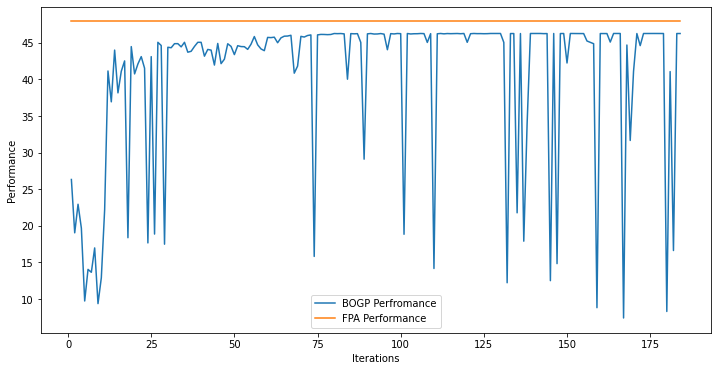

x_next is [  9.99999996   9.99999997   9.99979697   3.83459707   9.99999996
 -29.83694665   9.99999994   9.99999996 -24.2241185    7.08153614
   9.98625434   9.99999995   9.99999996   9.99999996   9.99999996
   8.32665422   9.99999996   9.99999996   8.36442923   9.99999997]
f()=46.272819, actual=46.273
183


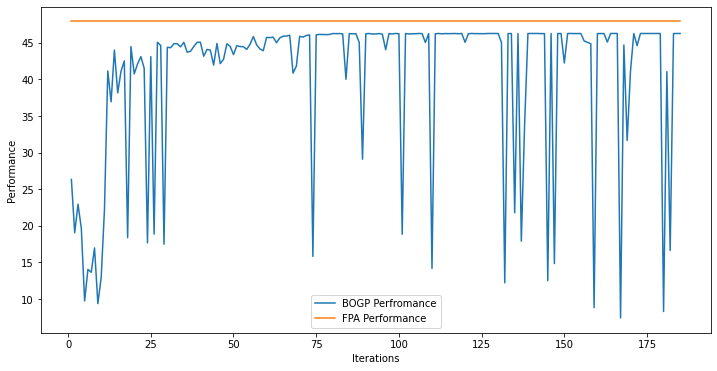

x_next is [ 10.           2.16464518  10.          10.          10.
 -31.          10.          10.         -18.43643227  10.
  10.          10.          10.           8.08395534  10.
  10.          10.          10.          10.          10.        ]
f()=46.787346, actual=44.523
184


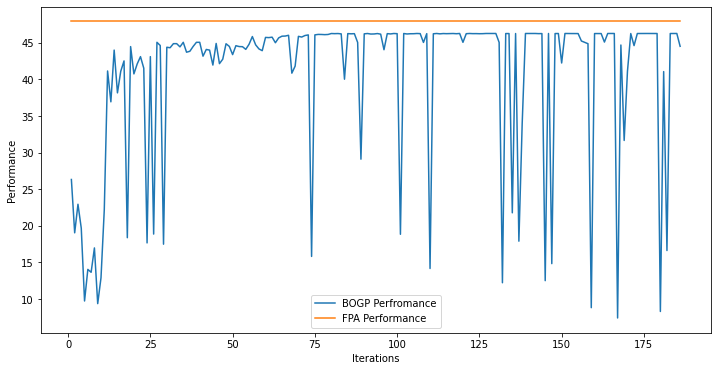

x_next is [  9.99999978   9.99999976   9.99997692   3.8232261    9.99999943
 -29.75121317   9.99999978   9.99966837 -24.23677773   7.06195413
   9.99980843   9.99999959   9.99993451   9.99999982   9.99987812
   8.30530536   9.99999966   9.99999963   8.3585767    9.99999968]
f()=46.272861, actual=46.273
185


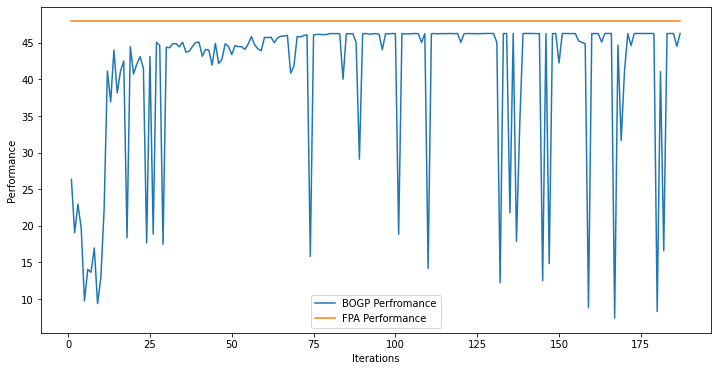

x_next is [  9.9999999    9.99999913   9.99998667   3.82387606   9.99991652
 -29.75345816   9.9999996    9.99999962 -24.23325947   7.06207407
   9.99996215   9.99999985   9.99999985   9.99999961   9.99999969
   8.30585771   9.99999147   9.99999245   8.35881163   9.99999976]
f()=46.272907, actual=46.273
186


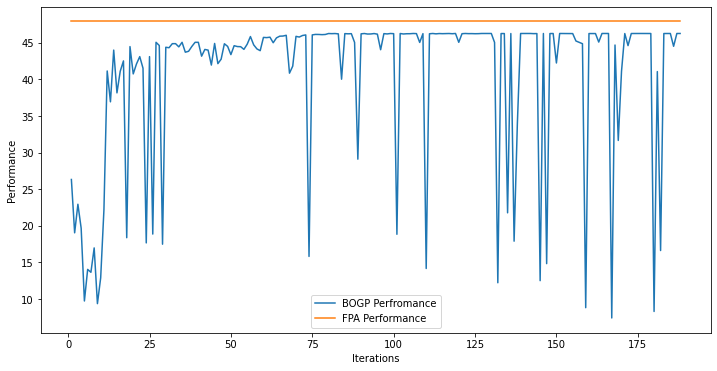

x_next is [  9.99999976   9.99999978   9.99999972   3.82348013   9.99999994
 -29.75132652   9.99999985   9.99999992 -24.24048299   7.06145104
   9.9999997    9.99999992   9.99999992   9.99999991   9.99999984
   8.30512668   9.99999975   9.99953439   8.35850855   9.99999964]
f()=46.272832, actual=46.273
187


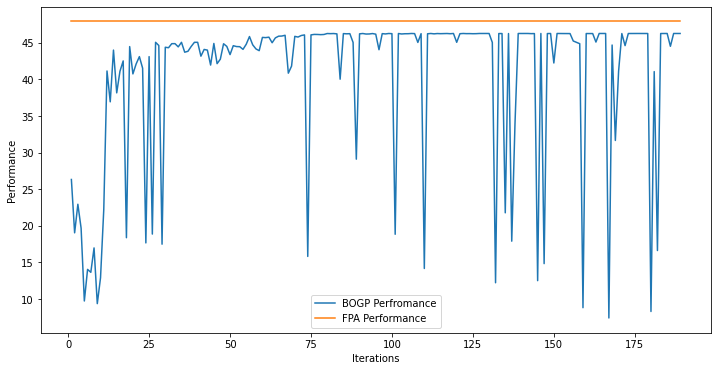

x_next is [  9.99999979   9.9994531    9.99992261   3.82418123   9.99999986
 -29.74764368   9.99999974   9.99999951 -24.21978566   7.06420046
   9.99999976   9.99999984   9.99999973   9.99999977   9.9999999
   8.30614092   9.99999981   9.99999985   8.36195666   9.99999983]
f()=46.272866, actual=46.273
188


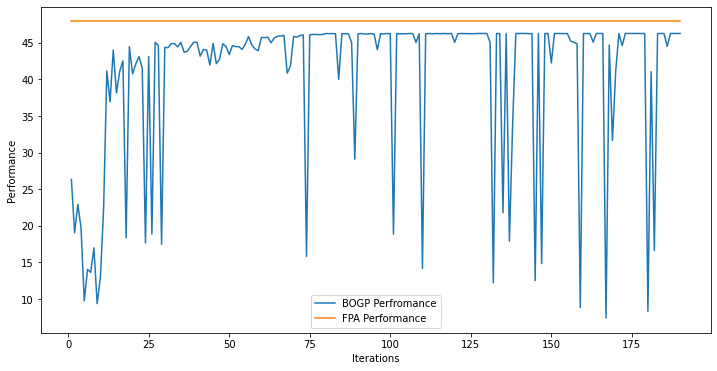

x_next is [  9.99868959   9.97260405   9.95186764   3.76821136   9.97440747
 -30.74938276   9.96021254   9.95970498 -23.72025008   7.08012888
   9.61114856   9.95818352   9.94262838   9.9309153    9.86268194
   8.00792939   9.96730258   9.96678413   8.01052132   9.96123276]
f()=46.186216, actual=46.186
189


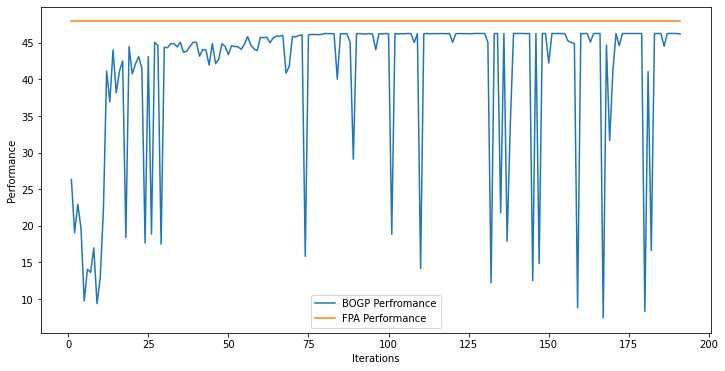

x_next is [  9.99999983   9.99999926   9.99999898   3.82378837   9.9999992
 -29.72951838   9.99999942   9.99999901 -24.22424412   7.06290635
   9.999964     9.99999956   9.99999926   9.99999907   9.99999931
   8.30450884   9.99999953   9.99999919   8.36395798   9.99999938]
f()=46.272930, actual=46.273
190


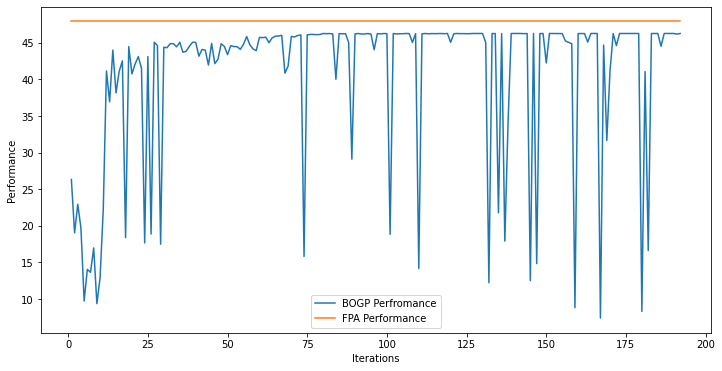

x_next is [-11.89905597  -4.87996059 -19.64214859   2.50174451 -14.29915885
  -8.35032162   5.32469017  -2.00086029   0.17450338 -21.8006768
   1.75316009   4.26186585  -4.81229251   2.16721473 -15.84449126
   1.79164212  -3.02841869 -26.14830285 -25.90533084   6.58112261]
f()=40.840606, actual=16.795
191


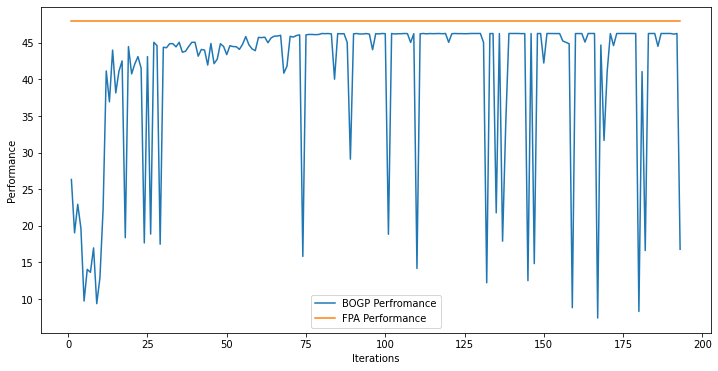

x_next is [  9.99999988   9.99999987   9.99993502   3.8230238    9.9999998
 -29.73303246   9.99999982   9.99999977 -24.22029501   7.06228444
   9.99993969   9.99999979   9.99999974   9.99999965   9.99999954
   8.30544121   9.99998495   9.99991483   8.3642733    9.99999987]
f()=46.272907, actual=46.273
192


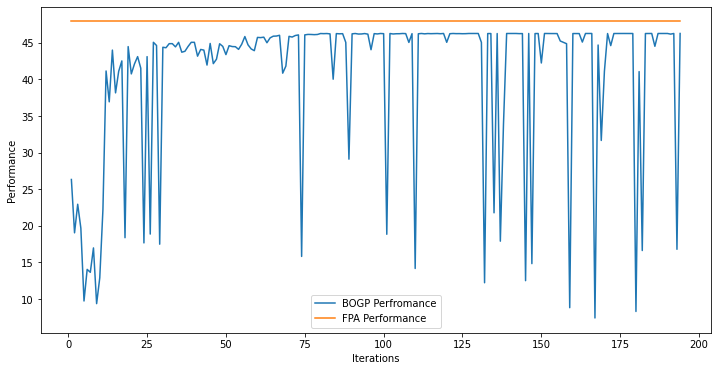

x_next is [  9.99630947   9.99695342   9.99409418   3.78656125   9.99458245
 -29.59228482   9.9980733    9.99677741 -24.37644715   6.90194718
   9.99810273   9.99364112   9.99580469   9.99970831   9.99965881
   8.22239471   9.99297737   9.99494628   8.43990869   9.98834736]
f()=46.264020, actual=46.264
193


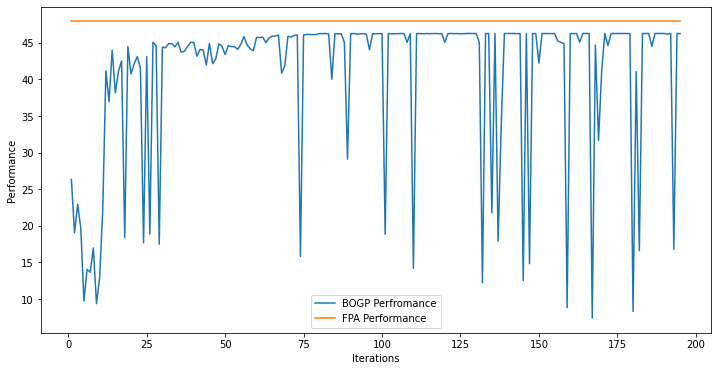

x_next is [  9.99477925   9.99253902   9.99999998   3.93898088   9.99999658
 -30.30350817   9.99999416   9.99998222 -24.5930607    7.16437733
   9.96000669   9.99999774   9.99999803   9.99999963   9.99999768
   8.33011117   9.99668477   9.99590007   8.30399718   9.99135828]
f()=46.267494, actual=46.268
194


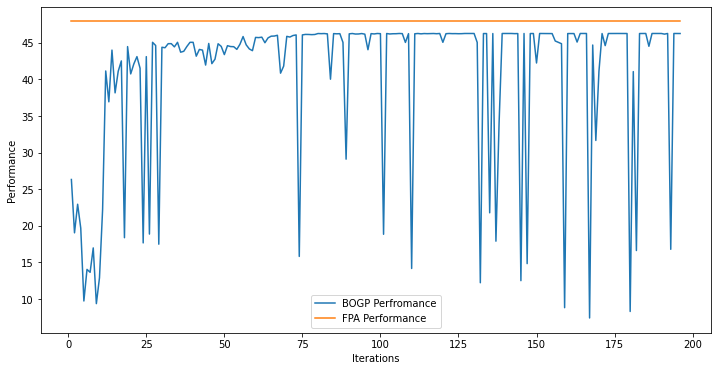

x_next is [  9.99977875   8.79700834   7.95034113   9.9971845    8.66689409
 -30.9996766    9.99992994   9.99984264  -0.98716662   9.99970937
   7.95595439   9.99972759   9.99995198 -21.44375087   6.6179425
   9.99999904   8.28614065   9.4898961    9.79607698   9.99986738]
f()=46.523254, actual=43.270
195


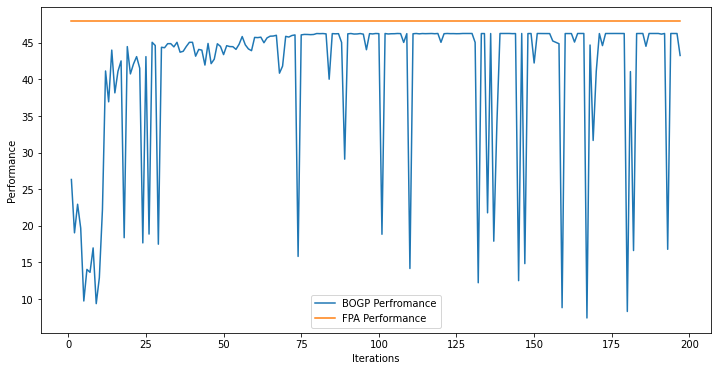

x_next is [  9.99337751   9.99553984   9.98470283   3.78220972   9.99592574
 -30.5884343    9.99746911   9.99083937 -24.49441757   7.10807053
   9.97372747   9.99660441   9.99700737   9.9996461    9.99674826
   8.33535665   9.99681725   9.99867757   8.48791764   9.99776307]
f()=46.265563, actual=46.265
196


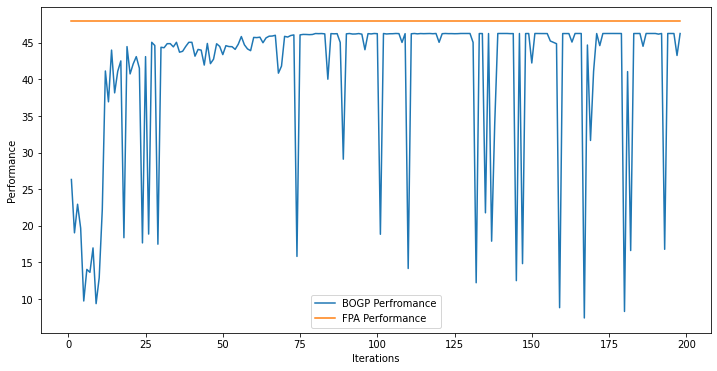

x_next is [  9.99999971   9.99998701   9.99999916   3.82378217   9.99996316
 -29.72699922   9.99999979   9.99999978 -24.22687886   7.06379434
   9.99989649   9.99999979   9.99999983   9.99999966   9.99995614
   8.30258638   9.99999984   9.99999976   8.36413095   9.99989943]
f()=46.272904, actual=46.273
197


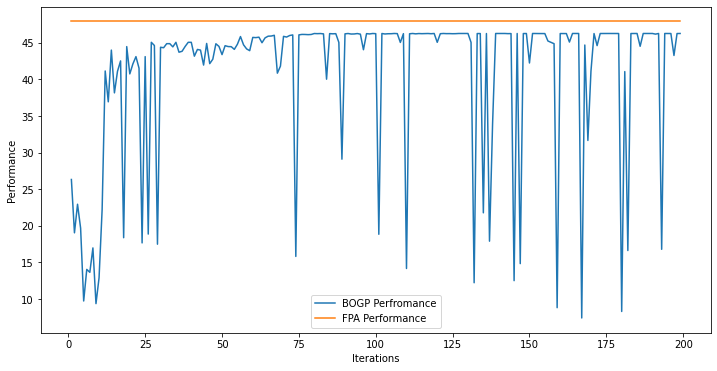

x_next is [  9.99944288   9.99848054   9.98718455   9.9995915    9.99984086
 -30.98310806   9.99782539   9.99733037   9.97432014   9.9941275
 -30.92120366   9.99830552   9.99402227   9.98855798   9.99597677
   9.99948239   9.99907045   9.9936349    9.995191     9.9975097 ]
f()=45.260953, actual=45.246
198


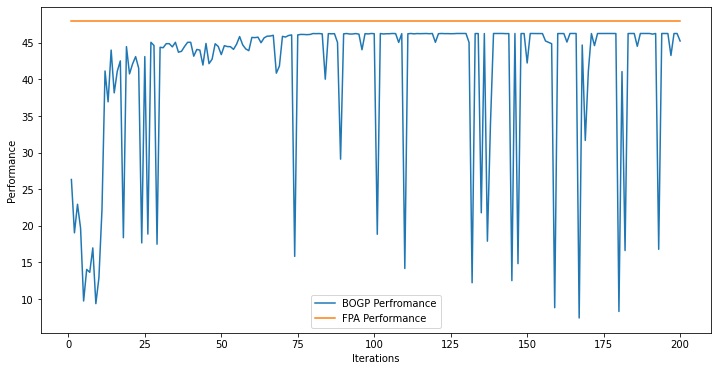

x_next is [  9.98604417   9.99976309   9.982084     3.55104255   9.98629552
 -30.01186279   9.99544666   9.99261176 -24.33475422   6.95059978
   9.94092732   9.96748609   9.98614761   9.99730401   9.97907222
   8.34324634   9.99192631   9.98837859   8.46409223   9.99840237]
f()=46.252090, actual=46.249
199


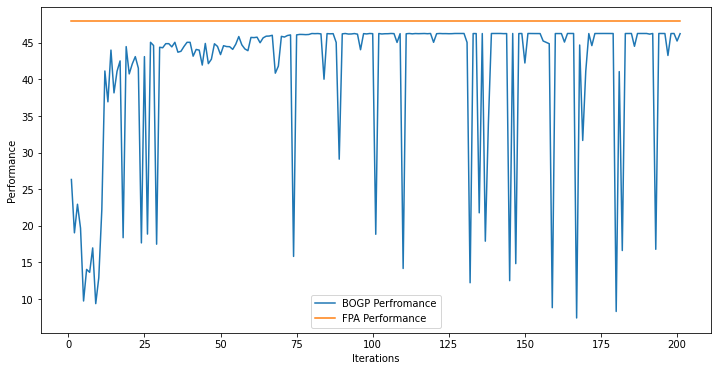

In [14]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective_FPA(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_P=10_3.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_P=10_3.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_P=10_3.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective_FPA(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


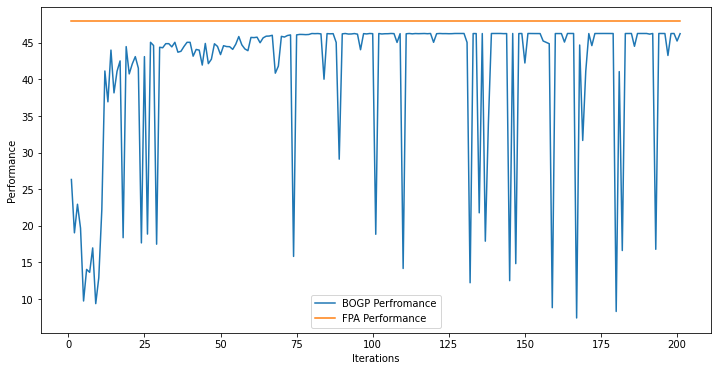

P_max = 10.000, Optimal_SE = 46.273
P_max = 10.000, Optimal_SE_FPA = 47.914


In [15]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 
ix = 0
ix = argmax(y)
print('P_max = %.3f, Optimal_SE = %.3f' % (P_max, y[ix]))

ix_FPA=0
ix_FPA=argmax(y_FPA)
print('P_max = %.3f, Optimal_SE_FPA = %.3f' % (P_max, y_FPA[ix_FPA]))

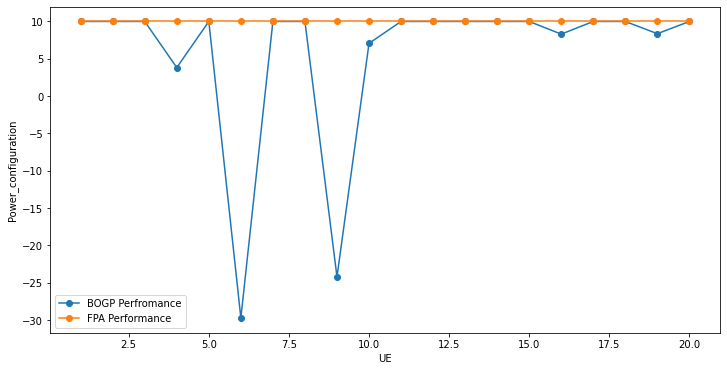

Power_configuration_BOGP is [  9.99999983   9.99999926   9.99999898   3.82378837   9.9999992
 -29.72951838   9.99999942   9.99999901 -24.22424412   7.06290635
   9.999964     9.99999956   9.99999926   9.99999907   9.99999931
   8.30450884   9.99999953   9.99999919   8.36395798   9.99999938]


In [16]:
X_FPA = P_max * np.ones([1,var], dtype = "float").reshape((int)(20), 1)
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("UE")
pyplot.ylabel("Power_configuration")
pyplot.plot(np.arange(1,21),X[ix][:], '-o')
pyplot.plot(np.arange(1,21),X_FPA[:], '-o')
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show()
print("Power_configuration_BOGP is", X[ix])

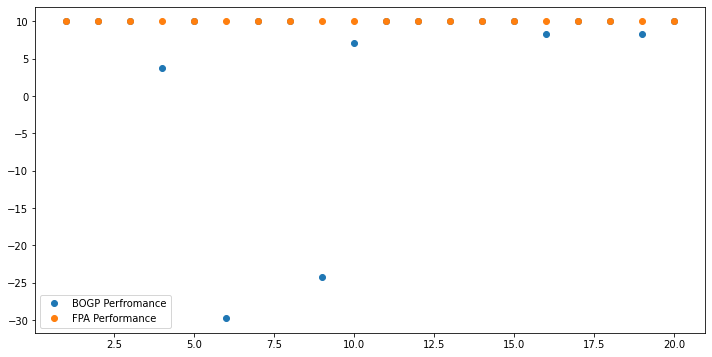

Power_configuration_BOGP is [  9.99999983   9.99999926   9.99999898   3.82378837   9.9999992
 -29.72951838   9.99999942   9.99999901 -24.22424412   7.06290635
   9.999964     9.99999956   9.99999926   9.99999907   9.99999931
   8.30450884   9.99999953   9.99999919   8.36395798   9.99999938]


In [17]:
import matplotlib.pyplot as plt
X_FPA=np.linspace(P_max,P_max,20)
plt.figure(figsize = (12, 6)) 
plt.plot(np.arange(1,21),X[ix][:], 'o')
plt.plot(np.arange(1,21),X_FPA[:], 'o')
plt.legend(["BOGP Perfromance","FPA Performance"])
plt.show()
print("Power_configuration_BOGP is", X[ix])